In [112]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
#%matplotlib inline

from matplotlib import rcParams

import numpy as np

# from utils.plotting import *
#SET UP FIGURE AESTHETICS 
plt.rcParams.update({'font.family' : 'lmodern', 'font.size': 18,                                                                                                                                                    
                     'axes.labelsize': 18, 'legend.fontsize': 16, 
                     'xtick.labelsize': 18, 'ytick.labelsize': 18, 
                     'axes.linewidth': 1.5})                                                                                                                                                                    

figdir = 'figures/2021/'

latent_dim = 3 # 8 #7 #3

kfold = 0
# savefig = True 
savefig = False

# train_data_file = 'data/train_data_kfold0_posterior_{:02d}Dlatent_layers256-128-32_minz_0pt03_noamp_no_rmapini.npy'.format(latent_dim)
# test_data_file  = 'data/test_data_kfold0_posterior_{:02d}Dlatent_layers256-128-32_minz_0pt03_noamp_no_rmapini.npy'.format(latent_dim)

# test_data_file  = 'data/train_data_kfold0_posterior_{:02d}Dlatent_layers256-128-32_minz_0pt03_noamp.npy'.format(latent_dim)

# train_data_file = 'data/train_data_kfold0_posterior_{:02d}Dlatent_layers256-128-32_minz_0pt0_amp.npy'.format(latent_dim)
# test_data_file  = 'data/test_data_kfold0_posterior_{:02d}Dlatent_layers256-128-32_minz_0pt0_amp.npy'.format(latent_dim)

train_data_file = 'data/train_data_kfold{:d}_posterior_{:02d}Dlatent_layers256-128-32_minz_0pt02_physical.npy'.format(kfold, latent_dim)
test_data_file  = 'data/test_data_kfold{:d}_posterior_{:02d}Dlatent_layers256-128-32_minz_0pt02_physical.npy'.format(kfold, latent_dim)


# Load trained data and make some plots

In [113]:
# Load data

def load_data(file_path):
    return np.load(file_path, allow_pickle=True).item()

train_data = load_data(train_data_file)
test_data  = load_data(test_data_file)

In [114]:
train_data.keys(), train_data['chain_min'], train_data['spectra_map'].shape

(dict_keys(['salt_params_label', 'wavelengths', 'spectra', 'spectra_salt', 'sigma', 'mask', 'times', 'salt_params', 'redshifts', 'names', 'times_orig', 'luminosity_distance', 'z_latent', 'u_latent', 'spectra_ae', 'sigma_ae_time', 'u_latent_ini', 'amplitude_ini', 'dtime_ini', 'chain_min', 'converged', 'num_evaluations', 'negative_log_likelihood', 'covariance', 'spectra_map', 'u_latent_map', 'z_latent_map', 'amplitude_map', 'dtime_map', 'logp_z_latent', 'logp_u_latent', 'logJ_u_latent']),
 array([0., 0., 0., 0., 6., 0., 0., 0., 0., 2., 3., 7., 0., 4., 0., 0., 0.,
        6., 0., 0., 9., 8., 1., 6., 0., 0., 0., 7., 0., 1., 0., 0., 4., 0.,
        0., 0., 7., 7., 0., 2., 9., 0., 3., 0., 7., 0., 5., 6., 0., 0., 5.,
        1., 3., 0., 7., 1., 1., 0., 0., 6., 1., 3., 6., 0., 8., 8., 0., 0.,
        0., 0., 9., 3., 0., 7., 1., 0., 7., 5., 4., 0., 0., 0., 4., 1., 0.,
        0., 0., 0., 4., 0., 0., 0., 0., 0., 8., 3., 3., 1., 8., 0., 0., 8.,
        0., 0., 0., 0., 0., 1., 0., 2., 7., 0., 0., 

[-1.1956353   0.19564284] 1.0 0.0
[-0.9846747   0.24059479] 1.0140573 -0.0077824267
[ 0.48797357 -0.68884194] 1.0 0.0
[ 1.2941335 -0.1169433] 1.1070013 -0.00094539864
[ 0.44021386 -0.9307858 ] 1.0 0.0
[ 0.4851511  -0.88081723] 0.9853706 -0.0011327155
[-1.1838075  0.8110616] 1.0 0.0
[-2.0402806   0.64906114] 0.97897357 -0.0008337636
[ 1.4401928 -2.1319087] 1.3182056 -0.010388246
[ 1.1055267 -2.461167 ] 0.8912834 0.010620678
[-0.19120157  0.72241765] 0.59301376 0.0010064937
[-0.74736273  0.40911233] 1.1485342 -0.0009273216
[-1.0549486  -0.33298063] 1.0 0.0
[-0.6840876   0.00171529] 1.0537021 0.006767326
[-0.2549171  1.2734745] 1.0 0.0
[-0.10169797  1.2871088 ] 1.0652373 0.035781484
[-3.1841784   0.05736168] 1.0 0.0
[-3.1372678  -0.36678046] 0.96579665 -0.0002347671
[0.92214435 0.28890127] 1.0 0.0
[0.7406692  0.29746038] 0.9561367 0.00044575304


array([1.0140573 , 1.1070013 , 0.9853706 , 0.97897357, 0.8912834 ,
       1.1485342 , 1.0537021 , 1.0652373 , 0.96579665, 0.9561367 ,
       0.99840635, 0.96844804, 0.9956467 , 1.2880251 , 0.80700666,
       0.927829  , 0.9938324 , 0.6775305 , 1.0392218 , 0.97367305,
       1.3170104 , 0.9249066 , 0.9416034 , 0.98389727, 1.071787  ,
       0.88694966, 0.9947579 , 1.0357453 , 0.96840435, 0.99834573,
       0.9910377 , 0.8875195 , 1.0486302 , 1.0843885 , 1.0443505 ,
       1.1064988 , 0.8800741 , 1.3441472 , 1.0669508 , 1.1917323 ,
       0.99768776, 1.1380361 , 0.982361  , 0.944736  , 0.9859943 ,
       1.0539404 , 0.93030417, 0.94555545, 0.9884973 , 1.0720572 ,
       1.1980976 , 0.8381068 , 0.99509656, 0.9270741 , 0.9826681 ,
       1.0284011 , 0.906542  , 0.90881586, 1.0791756 , 0.9248506 ,
       0.9456995 , 1.0258406 , 1.0460271 , 1.0293199 , 0.83423305,
       1.054194  , 0.9573373 , 0.8732711 , 1.0116909 , 1.1378903 ,
       1.0166621 , 0.9985596 , 1.0556899 , 0.573156  , 1.02012

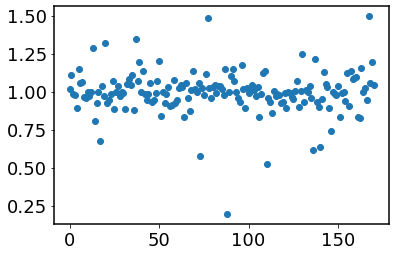

In [16]:
for i in range(10):
    print(train_data['u_latent_ini'][i], train_data['amplitude_ini'][i], train_data['dtime_ini'][i])
    print(train_data['u_latent_map'][i], train_data['amplitude_map'][i], train_data['dtime_map'][i])
    
plt.scatter(np.arange(train_data['amplitude_map'].shape[0]), train_data['amplitude_map'])
# plt.yscale('log')
train_data['amplitude_map']

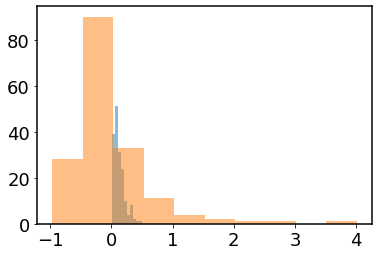

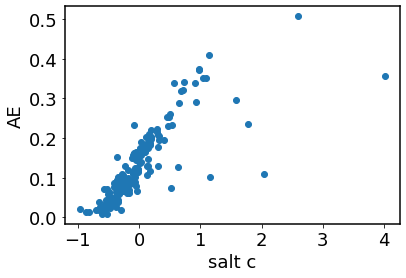

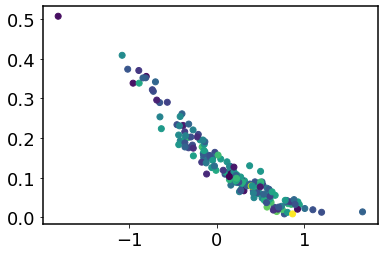

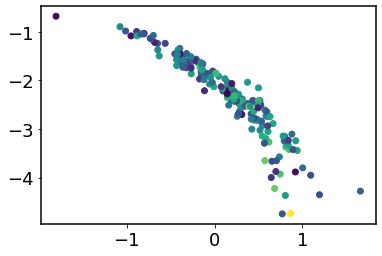

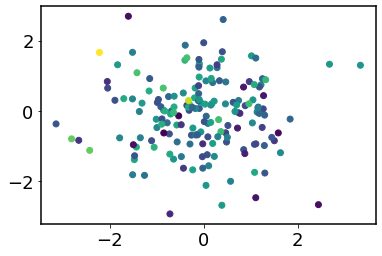

In [17]:
plt.figure()
plt.hist(np.exp(train_data['z_latent_map'][:,-1]), label='AE aolor', alpha=0.5)
plt.hist(train_data['salt_params'][:,-1], label='SALT2 color', alpha=0.5)

plt.figure()
plt.scatter(train_data['salt_params'][:,-1], np.exp(train_data['z_latent_map'][:,-1]), label='AE aolor')
plt.xlabel('salt c')
plt.ylabel('AE')

plt.figure()
plt.scatter(train_data['z_latent_map'][:,0], np.exp(train_data['z_latent_map'][:,-1]), c=train_data['redshifts'])

plt.figure()
plt.scatter(train_data['z_latent_map'][:,0], train_data['z_latent_map'][:,-1], c=train_data['redshifts'])

plt.figure()
plt.scatter(train_data['u_latent_map'][:,0], train_data['u_latent_map'][:,-1], c=train_data['redshifts'])

9
13
12
15
18
17
17
15
16
9


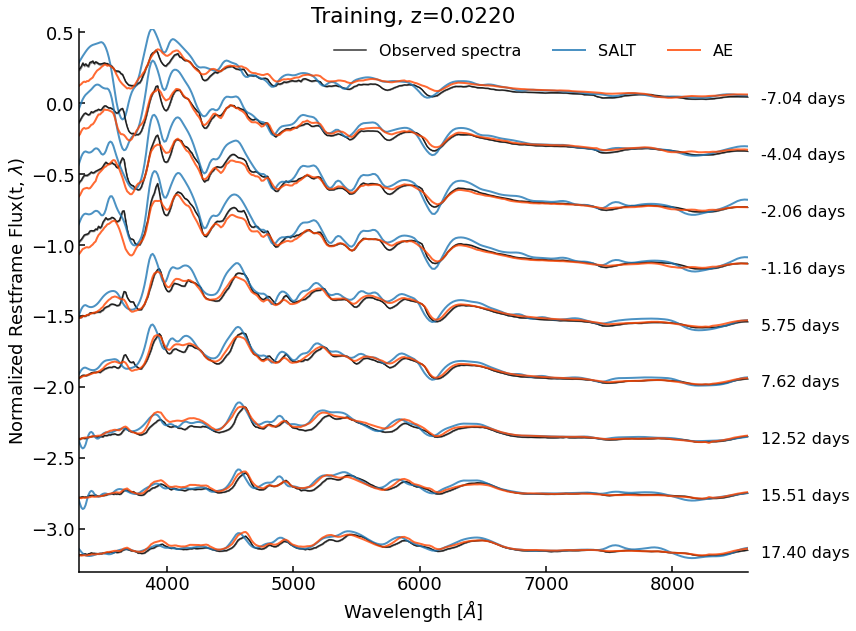

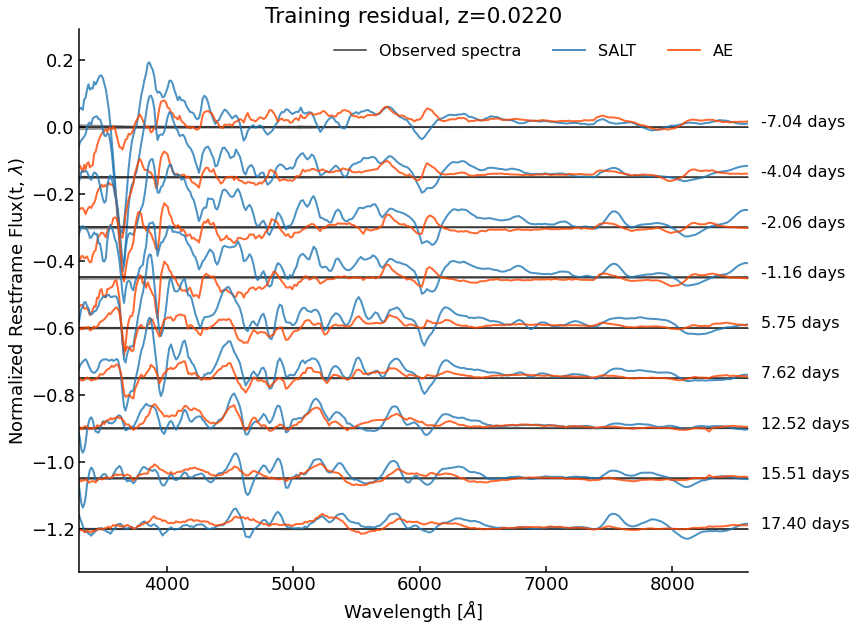

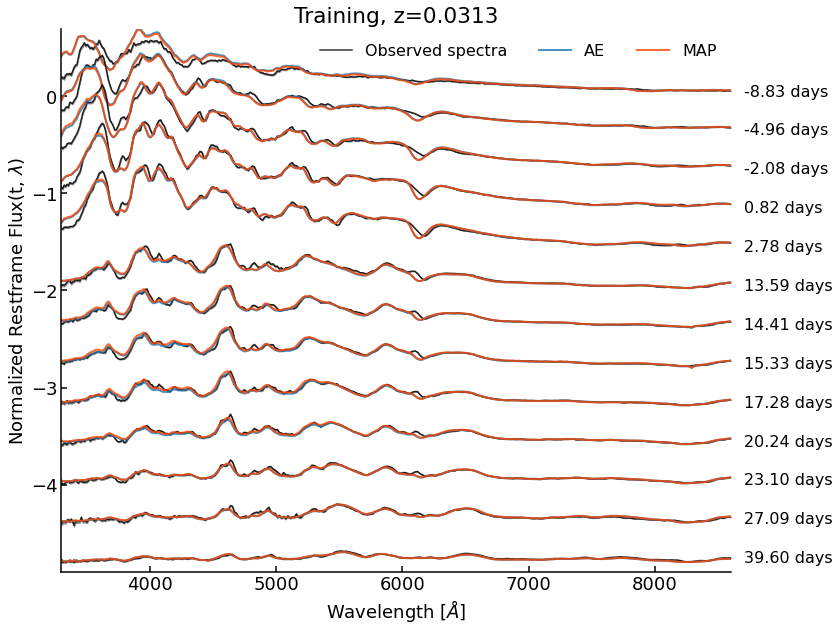

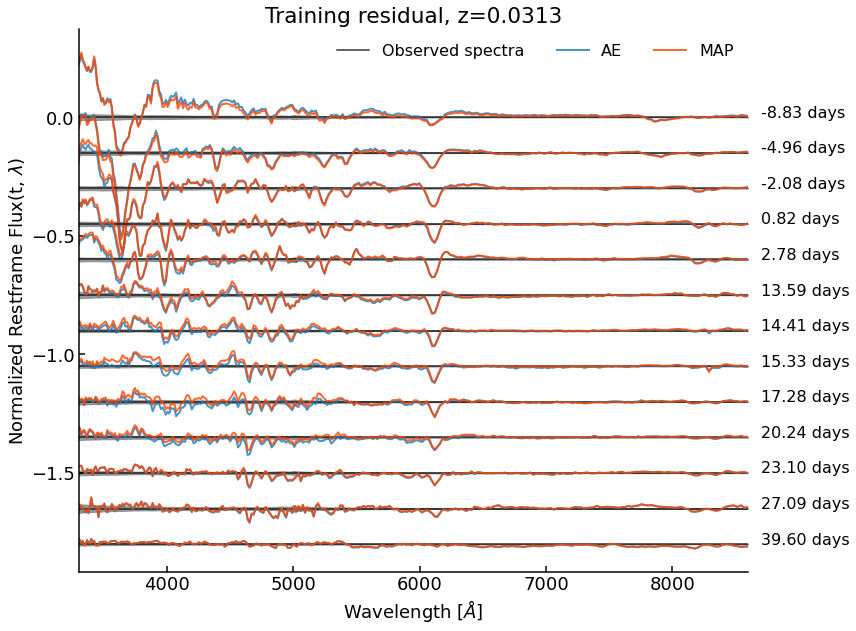

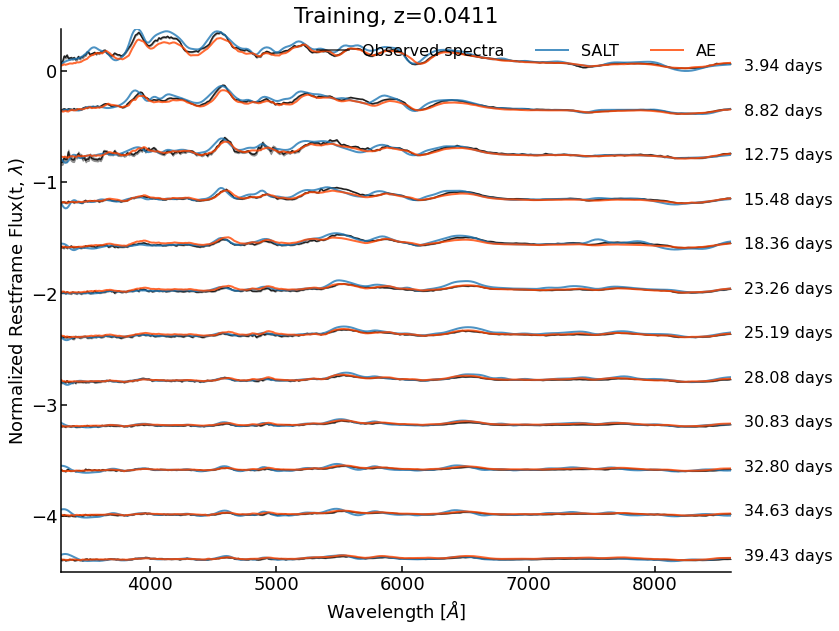

...

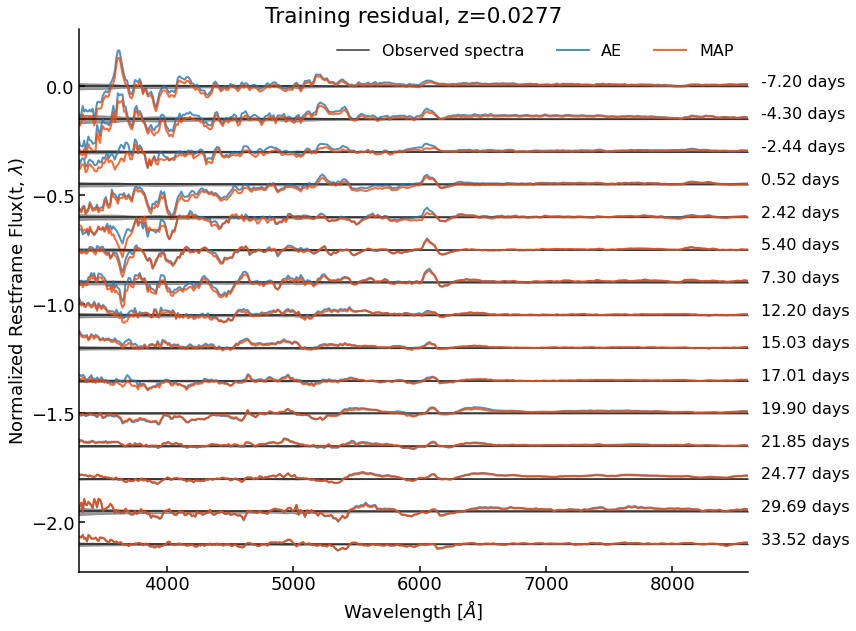

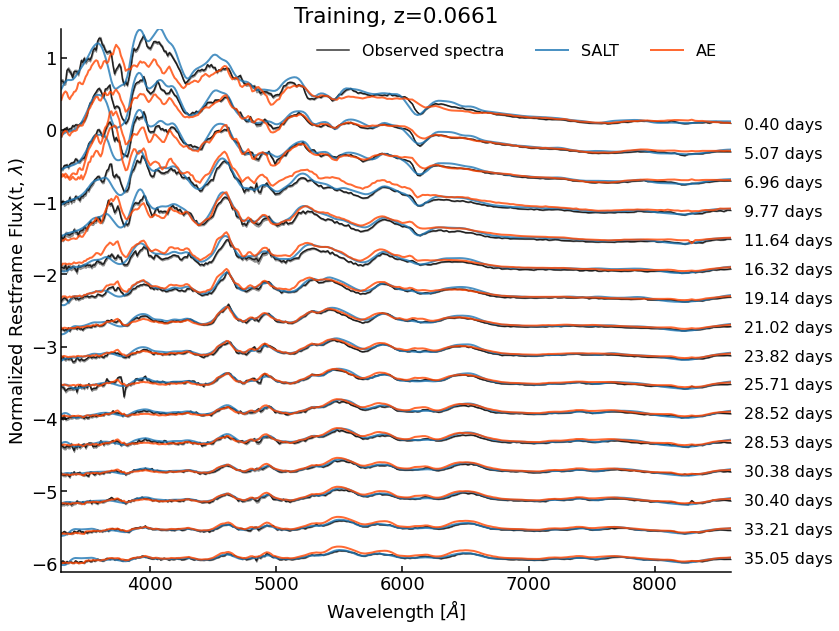

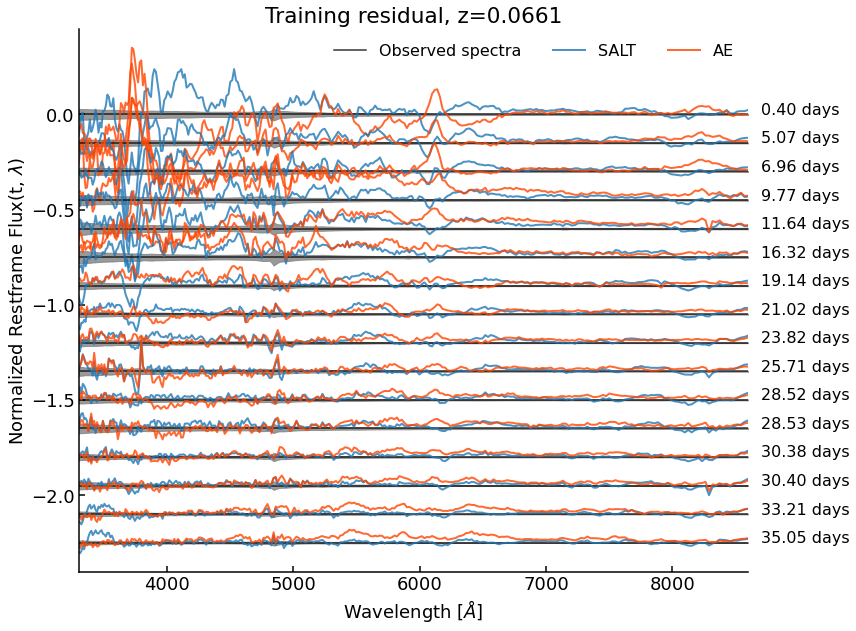

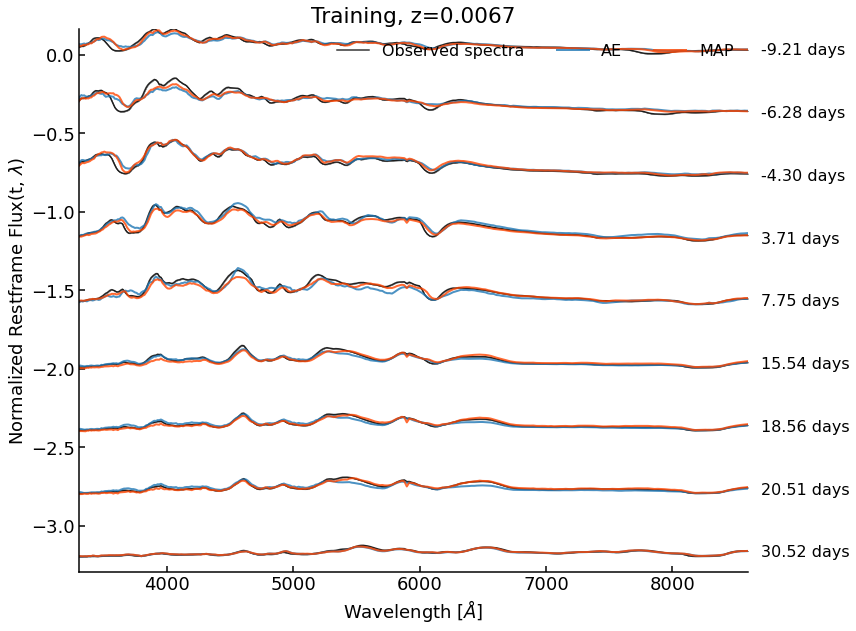

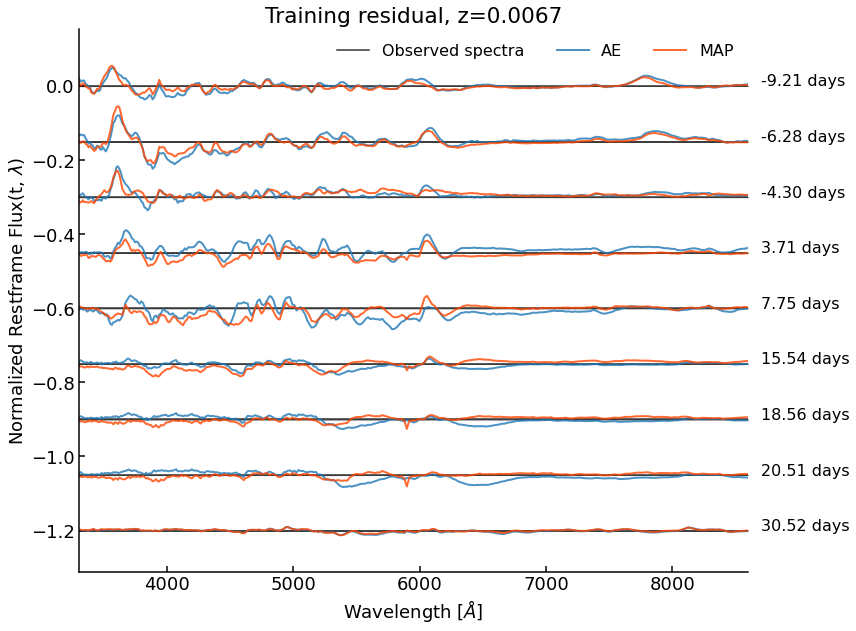

In [18]:
def plot_spectra_map(data, spec1='salt',spec2='ae',
                     title='Training', ispec=0, train=True):

    spec1 = spec1.upper()
    spec2 = spec2.upper()
    dm = data['mask'][ispec, :, 0] != 0

    x_obs = data['spectra'][ispec, dm].copy()
    
    if spec1=='SALT':
        x_1 = data['spectra_salt'][ispec, dm].copy()
    if spec1=='AE':
        x_1 = data['spectra_ae'][ispec, dm].copy()
    if spec1=='MAP':
        x_1 = data['spectra_map'][ispec, dm].copy()

    if spec2=='SALT':
        x_2 = data['spectra_salt'][ispec, dm].copy()
    if spec2=='AE':
        x_2 = data['spectra_ae'][ispec, dm].copy()
    if spec2=='MAP':
        x_2 = data['spectra_map'][ispec, dm].copy()

    sigma  = data['sigma'][ispec, dm].copy()
    times  = data['times_orig'][ispec, dm].copy()

    wavelengths = data['wavelengths']
    red = data['redshifts'][ispec]

    n_spectra = x_obs.shape[0]
    print(n_spectra)
    # Plot aesthetics                                                                                                 
    plttypes = ['normal', 'residual']
    aoffsets = [0.4, 0.15, 7]

    cmap = plt.cm.coolwarm
    colors = cmap(np.linspace(0, 1, len(x_obs)))

    lwt = 1.5
    lw  = 2

    c0  = 'orangered'
    c1  = 'C0'

    alpha=0.8

    wave_txt =wavelengths[-1]+100

    for iplt, plttype in enumerate(plttypes):
        fig, ((ax1 )) = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(12,10))                                  

        for axis in ['top','bottom','left','right']:
            ax1.spines[axis].set_linewidth(1.5)

        ax1.tick_params('both', length=6, width=1.5, which='major', color='k',direction='in')                        \

        ax1.tick_params('both', length=3, width=1.5, which='minor', color='k',direction='in')

        offset = np.arange(len(times)) * -1 * aoffsets[iplt]
        ymin = 100
        ymax = 0
        for i in range(n_spectra):
            labp = None
            labs = None
            labo = None
            ls= '-'

            if i==0:
                labo = 'Observed spectra'
                labs = spec1.upper()
                labp = spec2.upper()


            if plttype == 'normal':
                xi = x_obs[i] + offset[i]
                x1i = x_1[i] + offset[i]
                x2i = x_2[i] + offset[i]
                
                ax1.plot(wavelengths, xi, '-', c='k', lw=lwt, alpha=0.8, label=labo)#colors[i])                       
                ax1.fill_between(wavelengths, xi-sigma[i],  xi+sigma[i], color='gray', alpha=0.8, lw=1)
                ax1.plot(wavelengths, x1i, '-', c=c1, lw=lw, alpha=alpha, label=labs)
                ax1.plot(wavelengths, x2i, ls=ls, c=c0, lw=lw, alpha=alpha, label=labp)

                ax1.text(wave_txt, offset[i], '{:.2f} days'.format(times[i][0]), fontsize=16)

                ymin = min(ymin, min(xi), min(x1i), min(x2i) )
                ymax = max(ymax, max(xi), max(x1i), max(x2i) )


            if plttype == 'residual':
                xi = x_obs[i]
                x1i = x_1[i]
                x2i = x_2[i]

                ax1.plot(wavelengths, wavelengths*0+offset[i], '-', c='k', lw=lwt, alpha=0.8, label=labo)#colors[i])  
                ax1.fill_between(wavelengths, offset[i]-sigma[i],  offset[i]+sigma[i], color='gray', alpha=0.8, lw=1)
                ax1.plot(wavelengths, x1i - xi + offset[i], '-', c=c1, lw=lw, alpha=alpha, label=labs)
                ax1.plot(wavelengths, x2i - xi + offset[i], ls=ls, c=c0, lw=lw, alpha=alpha, label=labp)

                ax1.text(wave_txt, offset[i], '{:.2f} days'.format(times[i][0]), fontsize=16)

                ymin = min(ymin, min(x1i - xi + offset[i]), min(x2i - xi + offset[i]) )
                ymax = max(ymax, max(x1i - xi + offset[i]), max(x2i - xi + offset[i]) )

        ax1.set_ylabel('Restframe Flux')
        ax1.set_xlabel('Wavelength [$\AA$]')
        ax1.set_ylabel('Normalized Restframe Flux(t, $\lambda$)')

        if plttype == 'normal':
            ax1.set_title(title+', z={:.4f}'.format(red))
            ax1.set_ylim(ymin-0.1, ymax)

        if plttype == 'residual':
            ax1.set_title(title+' residual, z={:.4f}'.format(red))
            ax1.set_ylim(ymin-0.1, ymax+0.1)

#         ax1.set_frame_on(False)
#         ax1.get_xaxis().tick_bottom()
#         ax1.axes.get_yaxis().set_visible(False)
#         xmin, xmax = ax1.get_xaxis().get_view_interval()
#         ymin, ymax = ax1.get_yaxis().get_view_interval()
#         ax1.add_artist(plt.Line2D((xmin, xmax), (ymin, ymin), color='black', linewidth=2))
        ax1.spines['right'].set_visible(False)
        ax1.spines['top'].set_visible(False)

        # Only show ticks on the left and bottom spines
        ax1.yaxis.set_ticks_position('left')
        ax1.xaxis.set_ticks_position('bottom')


        ax1.legend(loc='upper right', frameon=False, ncol=3)

        ax1.set_xlim(wavelengths[0], wavelengths[-1])

istart = 0 #44
nplt = 5
for iplt in range(istart, istart+nplt):
#     plot_spectra_map(train_data, ispec=iplt)
    
    plot_spectra_map(test_data, ispec=iplt, train=False)

    plot_spectra_map(train_data, ispec=iplt, spec1='ae', spec2='map')

In [19]:
# def RMSe(spec_true, spec_pred, sigma, weighted=False, outlier_cut=95):
  
#     dm = spec_true != -1.

#     s0 = spec_true[dm].copy()
#     s1 = spec_pred[dm].copy()
#     sig = sigma[dm].copy()

#     s0 = np.reshape(s0, (-1, 288))
#     s1 = np.reshape(s1, (-1, 288))
#     sig = np.reshape(sig, (-1, 288))

# #     mse = (s0 - s1)**2
# #     if weighted:
# #         mse /= sig**2
        
#     mse = (s0 - s1)**2
#     weight = 1./sig**2
#     if weighted:
#         mse *= weight
#     # sometimes there are huge outliers,
#     # so set errors larger than some percentile to the value corresponding to that percentile
#     maxval = np.percentile(mse, outlier_cut, axis=0)
#     maxval_tile = np.tile(maxval, (mse.shape[0], 1))
# #         msei[np.greater(msei, maxval)] = maxval_tile
#     indgt = np.greater(mse, maxval)
#     mask = np.ones(mse.shape)
#     mask[indgt] = 0. #maxval_tile[indgt]

#     mean_flux = np.mean(s0, axis=0)


#     if weighted:
#         rmse = np.sqrt( np.sum(mse*mask, axis=0) / np.sum(weight*mask, axis=0))#/mean_flux
# #         rmse = np.sqrt( np.sum(weight*mse, axis=0) / np.sum(weight, axis=0))#/mean_flux

#     else:
#         rmse = np.sqrt( np.sum(mse*mask, axis=0)/np.sum(mask, axis=0))#/mean_flux

#     return rmse

def RMSe(spec_true, spec_pred, sigma, mask, per_sn=False):
  
    dm = mask[:,:,0] == 1.

    if per_sn:
        disp = np.zeros((spec_true.shape[0], spec_true.shape[-1]))
        for i in range(spec_true.shape[0]):
            s0i = spec_true[i, dm[i]]
            s1i = spec_pred[i, dm[i]]

            dispi = -2.5*np.log10(np.abs(s0i/s1i))
            disp[i] = np.mean(dispi, axis=0)

            disp = np.std(disp, axis=0)

    if not per_sn:
        s0 = spec_true[dm].copy().reshape((-1, 288))
        s1 = spec_pred[dm].copy().reshape((-1, 288))
        sig = sigma[dm].copy().reshape((-1, 288))

        ratio = np.abs(s0/s1)
        maxval = np.percentile(ratio, 100, axis=0)
        maxval_tile = np.tile(maxval, (ratio.shape[0], 1))

        indgt = np.greater(ratio, maxval)    
        ratio[indgt] = maxval_tile[indgt]
        
        disp = np.std(-2.5*np.log10(ratio), axis=0)
    return disp

def NMAD(spec_true, spec_pred, sigma, mask, weighted=False, outlier_cut=95):
  
    dm = mask != 1.
    
    s0 = spec_true[dm].copy()
    s1 = spec_pred[dm].copy()
    sig = sigma[dm].copy()

    s0 = np.reshape(s0, (-1, 288))
    s1 = np.reshape(s1, (-1, 288))
    sig = np.reshape(sig, (-1, 288))

#     nmad = np.median( np.abs((s0 - s1))/s0, axis=0)
    disp = -2.5*np.log10( np.abs(s1/s0))
   
    return np.median(np.abs(disp - np.median(disp, axis=0)), axis=0)


In [20]:
def RMSe_time(spec_true, spec_pred, sigma, mask, time):
  
    dm = mask[:,:,0] == 1

    ntbins = 10
    t_bin_edge = np.linspace(0, 1, ntbins+1)
    t_bin_cent = (t_bin_edge[:-1] + t_bin_edge[1:])/2

    s0 = spec_true[dm].copy()
    s1 = spec_pred[dm].copy()  
    sig = sigma[dm].copy()

    t   = time[dm][:,0]
    
    s0 = np.reshape(s0, (-1, 288))
    s1 = np.reshape(s1, (-1, 288))
    sig = np.reshape(sig, (-1, 288))

    mse = -2.5*np.log10(np.abs(s0/s1))

    # sometimes there are huge outliers,
    # so set errors larger than some percentile to the value corresponding to that percentile
    sigma_t = np.zeros((len(t_bin_cent), mse.shape[1]))
    bins = np.digitize(t, t_bin_edge) - 1
    for ibin in np.unique(bins):
        dm   = bins == ibin
 
        sigma_t[ibin, :] = np.std(mse[dm], axis=0)
            
    return sigma_t, t_bin_edge, t_bin_cent


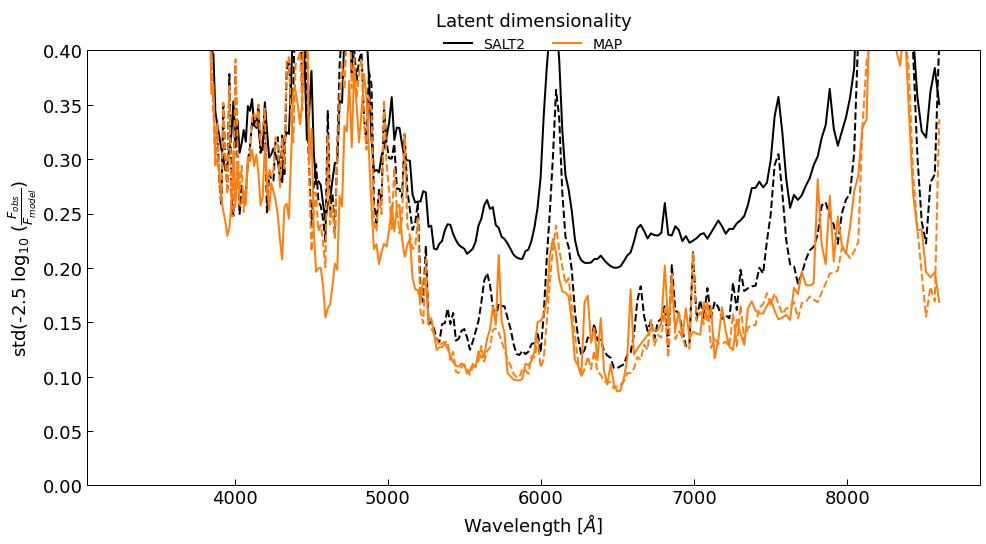

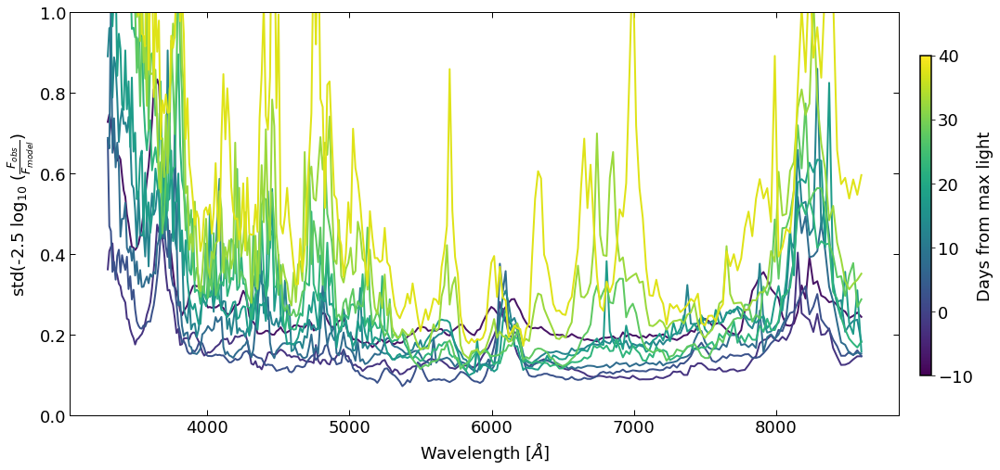

In [21]:
# load multiple training types, plot spectra, and calculate rmse


istart = 0 #44
iend = 999
nplt = 1
lw = 2
# file_bases  = ['data_kfold0_posterior_03Dlatent_layers64-32-8_minz_0pt03_nophysical_noamploss.npy',
#                'data_kfold0_posterior_03Dlatent_layers64-32-8_minz_0pt03_nophysical_noamploss_varymask.npy',
#               'data_kfold0_posterior_03Dlatent_layers64-32-8_minz_0pt03_physical.npy',
#               'data_kfold0_posterior_03Dlatent_layers64-32-8_minz_0pt03_physical_amplitude.npy']

# file_bases  = ['data_kfold0_posterior_03Dlatent_layers32-16_minz_0pt03_physical.npy',
#                'data_kfold0_posterior_03Dlatent_layers64-32-8_minz_0pt03_physical.npy',
#               'data_kfold0_posterior_03Dlatent_layers128-64-16_minz_0pt03_physical.npy',
#                'data_kfold0_posterior_03Dlatent_layers256-128-32_minz_0pt03_physical.npy']

file_bases  = ['data_kfold0_posterior_02Dlatent_layers256-128-32_minz_0pt02_physical.npy']#,
#                'data_kfold0_posterior_04Dlatent_layers256-128-32_minz_0pt03_physical.npy',
#                'data_kfold0_posterior_08Dlatent_layers256-128-32_minz_0pt03_physical.npy'
#               ]

latent_dims = [3, 4, 8]

# for file_base in file_bases:
#     train_data = load_data('data/train_'+file_base)
#     test_data  = load_data('data/test_'+file_base)

#     for iplt in range(istart, istart+nplt):
#         plot_spectra_map(test_data, ispec=iplt, train=False)

    
fig, ((ax1)) = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(16,8))#, gridspec_kw={'height_ratios': [3, 1]})

for axis in ['top','bottom','left','right']:
    ax1.spines[axis].set_linewidth(1.)

ax1.tick_params('both', length=6, width=1., which='major', color='k', direction='in')                                         
ax1.tick_params('both', length=3, width=1., which='minor', color='k', direction='in')
# Ratio figures

# per_sn = True
per_sn = False
min_train_redshift = 0.00
max_train_redshift = 1.0

mask_vary_test = np.ones(test_data['mask'].shape, dtype=np.float32)
dm_redshift = (test_data['redshifts'] > min_train_redshift) & \
              (test_data['redshifts'] < max_train_redshift)
mask_vary_test[~dm_redshift] = 0.

mask_vary_train = np.ones(train_data['mask'].shape, dtype=np.float32)
dm_redshift = (train_data['redshifts'] > min_train_redshift) & \
              (train_data['redshifts'] < max_train_redshift)
mask_vary_train[~dm_redshift] = 0.

# ALL SPECTRA
for il, file_base in enumerate(file_bases):
    train_data = load_data('data/train_'+file_base)
    test_data  = load_data('data/test_'+file_base)

    if il==0:
        rms_p_salt_train = RMSe(train_data['spectra'][istart:iend], train_data['spectra_salt'][istart:iend], train_data['sigma'][istart:iend], train_data['mask'][istart:iend]*mask_vary_train[istart:iend], per_sn=per_sn)
        rms_p_salt_test  = RMSe(test_data['spectra'][istart:iend], test_data['spectra_salt'][istart:iend], test_data['sigma'][istart:iend], test_data['mask'][istart:iend]*mask_vary_test[istart:iend], per_sn=per_sn)

    rms_p_ae_train = RMSe(train_data['spectra'][istart:iend], train_data['spectra_ae'][istart:iend], train_data['sigma'][istart:iend], train_data['mask'][istart:iend]*mask_vary_train[istart:iend], per_sn=per_sn)
    rms_p_ae_test  = RMSe(test_data['spectra'][istart:iend], test_data['spectra_ae'][istart:iend], test_data['sigma'][istart:iend], test_data['mask'][istart:iend]*mask_vary_test[istart:iend], per_sn=per_sn)

    rms_p_map_train = RMSe(train_data['spectra'][istart:iend], train_data['spectra_map'][istart:iend], train_data['sigma'][istart:iend], train_data['mask'][istart:iend]*mask_vary_train[istart:iend], per_sn=per_sn)
    rms_p_map_test  = RMSe(test_data['spectra'][istart:iend], test_data['spectra_map'][istart:iend], test_data['sigma'][istart:iend], test_data['mask'][istart:iend]*mask_vary_test[istart:iend], per_sn=per_sn)

    if not per_sn:
        if il==0:
            ax1.plot(train_data['wavelengths'], rms_p_salt_train, '-', lw=lw, c='k', label='SALT2')
            ax1.plot(train_data['wavelengths'], rms_p_salt_test, '--', lw=lw, c='k')

#         ax1.plot(train_data['wavelengths'], rms_p_ae_train, '-', lw=lw, c='C{:d}'.format(il), label='AE')
#         ax1.plot(train_data['wavelengths'], rms_p_ae_test, '--', lw=lw, c='C{:d}'.format(il))

        ax1.plot(train_data['wavelengths'], rms_p_map_train, '-', lw=lw, c='C{:d}'.format(il+1), label='MAP')
        ax1.plot(train_data['wavelengths'], rms_p_map_test, '--', lw=lw, c='C{:d}'.format(il+1))

    if per_sn:
        
        for isn in range(3):#rms_p_salt_train.shape[0]):
            labs=None
            labae=None
            labmap=None
            if isn==0:
                labs='SALT2'
                labae='{:d}'.format(latent_dim)
            if il==0:
                ax1.plot(train_data['wavelengths'], rms_p_salt_train[isn], '--', lw=lw, c='k', label=labs, alpha=0.3)
            ax1.plot(train_data['wavelengths'], rms_p_ae_train[isn], '-', lw=lw, c='C{:d}'.format(il%10), label=labae, alpha=0.3)

ax1.set_ylim(0, 0.4)

ax1.set_yscale('linear')
# ax1.set_yscale('log')

ax1.legend(ncol=5, fontsize=14, title='Latent dimensionality', bbox_to_anchor=(0.5, 0.97), loc='lower center', frameon=False)

ax1.set_ylabel('Dispersion (mag)')
ax1.set_ylabel(r'std(-2.5 log$_{10}$ $(\frac{F_{obs}}{F_{model}})$')

ax1.set_xlabel('Wavelength [$\AA$]')





# VS TIME
cmap = plt.cm.viridis
for il, file_base in enumerate(file_bases):
    fig, ((ax1)) = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(16,8))#, gridspec_kw={'height_ratios': [3, 1]})

    # Make dummie mappable
    xx = np.linspace(-10, 40, 100)
    dummie_cax = ax1.scatter(xx, xx, c=xx, cmap=cmap)
    # Clear axis
    ax1.cla()
    
    for axis in ['top','bottom','left','right']:
        ax1.spines[axis].set_linewidth(1.)

    ax1.tick_params('both', length=6, width=1., which='major', color='k', direction='in')                                         
    ax1.tick_params('both', length=3, width=1., which='minor', color='k', direction='in')

    train_data = load_data('data/train_'+file_base)
    test_data  = load_data('data/test_'+file_base)

    if il==0:
        rms_p_salt_train, t_bin_edge, t_bin_cent = RMSe_time(train_data['spectra'][istart:iend],
                                     train_data['spectra_salt'][istart:iend],
                                     train_data['sigma'][istart:iend],
                                     train_data['mask'][istart:iend]*mask_vary_train[istart:iend],
                                     train_data['times'][istart:iend])
        rms_p_salt_test, t_bin_edge, t_bin_cent  = RMSe_time(test_data['spectra'][istart:iend],
                                     test_data['spectra_salt'][istart:iend],
                                     test_data['sigma'][istart:iend],
                                     test_data['mask'][istart:iend]*mask_vary_test[istart:iend],
                                     test_data['times'][istart:iend])

    rms_p_ae_train, t_bin_edge, t_bin_cent = RMSe_time(train_data['spectra'][istart:iend], train_data['spectra_ae'][istart:iend], train_data['sigma'][istart:iend], train_data['mask'][istart:iend]*mask_vary_train[istart:iend], train_data['times'][istart:iend])
    rms_p_ae_test, t_bin_edge, t_bin_cent  = RMSe_time(test_data['spectra'][istart:iend], test_data['spectra_ae'][istart:iend], test_data['sigma'][istart:iend], test_data['mask'][istart:iend]*mask_vary_test[istart:iend]*mask_vary_test[istart:iend],  test_data['times'][istart:iend])

    for it in range(rms_p_ae_train.shape[0]):
#         ax1.plot(train_data['wavelengths'], rms_p_salt_train[it], '-', lw=lw, c=cmap(t_bin_cent[it]), label='SALT2')
#         ax1.plot(train_data['wavelengths'], rms_p_salt_test[it], '--', lw=lw, c='k')

        ax1.plot(train_data['wavelengths'], rms_p_ae_train[it], '-', lw=lw, c=cmap(t_bin_cent[it]), 
                 label='{:.0f} days < t < {:.0f} days'.format(t_bin_edge[it]*50-10, t_bin_edge[it+1]*50-10))
#         ax1.plot(train_data['wavelengths'], rms_p_ae_test[it], '--', lw=lw, c=cmap(t_bin_cent[it]))

    ax1.set_yscale('linear')
#     ax1.set_yscale('log')

#     ax1.legend(ncol=5, fontsize=14, title='Latent dimensionality', bbox_to_anchor=(0.5, 0.97), loc='lower center', frameon=False)

#     ax1.set_ylabel('Dispersion (mag)')
    ax1.set_ylabel(r'std(-2.5 log$_{10}$ $(\frac{F_{obs}}{F_{model}})$')

    ax1.set_xlabel('Wavelength [$\AA$]')

    ax1.set_ylim(0, 1.0)
    
    cax = fig.add_axes([0.92, 0.2, 0.01, 0.6])
    fig.colorbar(dummie_cax, cax=cax, label='Days from max light')

    

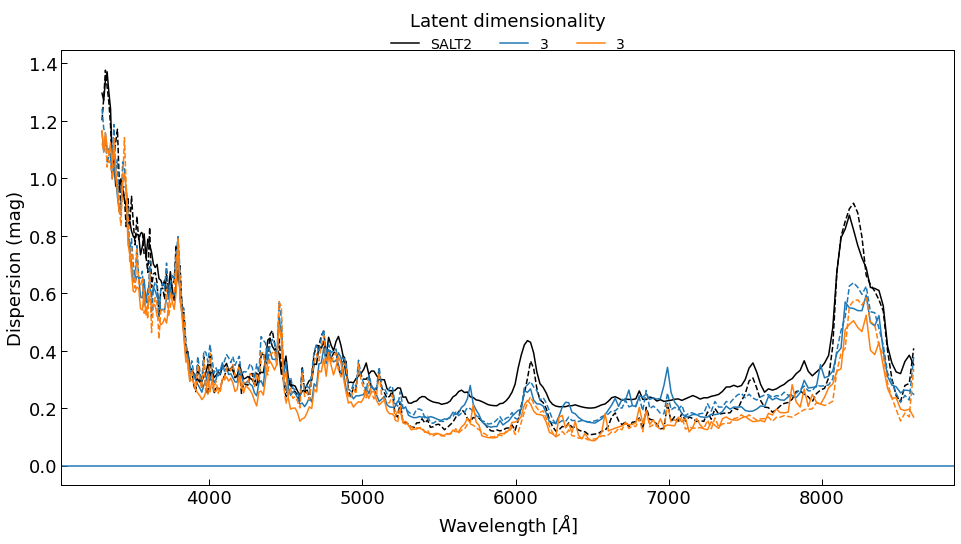

In [22]:
# RMSe
istart = 0
iend = 200

savefig=True
# savefig=False

latent_dims = [3]
# latent_dims = [2,3,8,16]

csalt = 'k'
cae = 'C0' 
cmap = 'orangered'    

lw  = 1.5
weighted_list = [True, False]

abs_lab = ['Si II', 'FE', 'Si II', 'Si II', 'O I', 'Si II', 'Si II']
zref = 0.05
abs_wavelength = np.array([4131., 4800., 5972, 6355, 7773, 5454, 5640])#/(1+zref)
dxtxt = 5

outlier_cut = 98

data_use = train_data

    
fig, ((ax1)) = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(16,8))#, gridspec_kw={'height_ratios': [3, 1]})

for axis in ['top','bottom','left','right']:
    ax1.spines[axis].set_linewidth(1.)

ax1.tick_params('both', length=6, width=1., which='major', color='k', direction='in')                                         
ax1.tick_params('both', length=3, width=1., which='minor', color='k', direction='in')
# Ratio figures

# per_sn = True
per_sn = False

for il, latent_dim in enumerate(latent_dims):

    rms_p_salt_train = RMSe(train_data['spectra'][istart:iend], train_data['spectra_salt'][istart:iend], train_data['sigma'][istart:iend], train_data['mask'][istart:iend], per_sn=per_sn)
    rms_p_salt_test  = RMSe(test_data['spectra'][istart:iend], test_data['spectra_salt'][istart:iend], test_data['sigma'][istart:iend], test_data['mask'][istart:iend], per_sn=per_sn)

    rms_p_ae_train = RMSe(train_data['spectra'][istart:iend], train_data['spectra_ae'][istart:iend], train_data['sigma'][istart:iend], train_data['mask'][istart:iend], per_sn=per_sn)
    rms_p_ae_test  = RMSe(test_data['spectra'][istart:iend], test_data['spectra_ae'][istart:iend], test_data['sigma'][istart:iend], test_data['mask'][istart:iend], per_sn=per_sn)

    rms_p_map_train = RMSe(train_data['spectra'][istart:iend], train_data['spectra_map'][istart:iend], train_data['sigma'][istart:iend], train_data['mask'][istart:iend], per_sn=per_sn)
    rms_p_map_test  = RMSe(test_data['spectra'][istart:iend], test_data['spectra_map'][istart:iend], test_data['sigma'][istart:iend], test_data['mask'][istart:iend], per_sn=per_sn)
    
    if not per_sn:
        if il==0:
            ax1.plot(train_data['wavelengths'], rms_p_salt_train, '-', lw=lw, c='k', label='SALT2')
            ax1.plot(train_data['wavelengths'], rms_p_salt_test, '--', lw=lw, c='k')

        ax1.plot(train_data['wavelengths'], rms_p_ae_train, '-', lw=lw, c='C{:d}'.format(il), label='{:d}'.format(latent_dim))
        ax1.plot(train_data['wavelengths'], rms_p_ae_test, '--', lw=lw, c='C{:d}'.format(il))

        ax1.plot(train_data['wavelengths'], rms_p_map_train, '-', lw=lw, c='C{:d}'.format(il+1), label='{:d}'.format(latent_dim))
        ax1.plot(train_data['wavelengths'], rms_p_map_test, '--', lw=lw, c='C{:d}'.format(il+1))

    if per_sn:
        
        for isn in range(3):#rms_p_salt_train.shape[0]):
            labs=None
            labae=None
            labmap=None
            if isn==0 and il==0:
                labs='SALT2'
                labae='{:d}'.format(latent_dim)
            if il==0:
                ax1.plot(train_data['wavelengths'], rms_p_salt_train[isn], '--', lw=lw, c='k', label=labs, alpha=0.3)
            ax1.plot(train_data['wavelengths'], rms_p_ae_train[isn], '-', lw=lw, c='C{:d}'.format(il%10), label=labae, alpha=0.3)
#             ax1.plot(train_data['wavelengths'], rms_p_map_train[isn], '-', lw=lw, c='C{:d}'.format(i+1), label=labmap)

ax1.set_yscale('linear')

ax1.legend(ncol=5, fontsize=14, title='Latent dimensionality', bbox_to_anchor=(0.5, 0.97), loc='lower center', frameon=False)

ax1.set_ylabel('Dispersion (mag)')
ax1.set_xlabel('Wavelength [$\AA$]')
#     ax1.set_yscale('log')

# ax1.set_ylim(0.5, 2)
ax1.axhline(0.0)
#     if savefig: 
#         fname = 'rmse_ae_latent_dim'
#         if weighted: fname += '_weighted'
#         plt.savefig(figdir+fname+'.pdf', bbox_inches='tight')


NameError: name 'weighted' is not defined

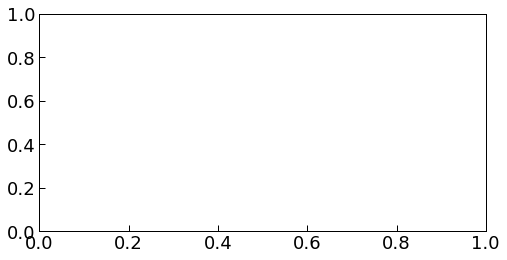

In [23]:
#NMAD
fig, ((ax1 )) = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(8,4))#, gridspec_kw={'height_ratios': [3, 1]})

for axis in ['top','bottom','left','right']:
    ax1.spines[axis].set_linewidth(1.)

ax1.tick_params('both', length=6, width=1., which='major', color='k',direction='in')                                         
ax1.tick_params('both', length=3, width=1., which='minor', color='k',direction='in')
# Ratio figures

for i, latent_dim in enumerate(latent_dims):

    nmad_salt_train = NMAD(train_data['spectra'][istart:iend], train_data['spectra_salt'][istart:iend], train_data['sigma'][istart:iend], weighted=weighted, outlier_cut=outlier_cut)
    nmad_salt_test  = NMAD(test_data['spectra'][istart:iend], test_data['spectra_salt'][istart:iend], test_data['sigma'][istart:iend], weighted=weighted, outlier_cut=outlier_cut)

    nmad_ae_train = NMAD(train_data['spectra'][istart:iend], train_data['spectra_ae'][istart:iend], train_data['sigma'][istart:iend], weighted=weighted, outlier_cut=outlier_cut)
    nmad_ae_test  = NMAD(test_data['spectra'][istart:iend], test_data['spectra_ae'][istart:iend], test_data['sigma'][istart:iend], weighted=weighted, outlier_cut=outlier_cut)

    if i==0:
        ax1.plot(train_data['wavelengths'], nmad_salt_train, '-', lw=lw, c='k', label='SALT2')
        ax1.plot(train_data['wavelengths'], nmad_salt_test, '--', lw=lw, c='k')

    ax1.plot(train_data['wavelengths'], nmad_ae_train, '-', lw=lw, c='C{:d}'.format(i), label='{:d}'.format(latent_dim))
    ax1.plot(train_data['wavelengths'], nmad_ae_test, '--', lw=lw, c='C{:d}'.format(i))

ax1.set_yscale('linear')

ax1.legend(ncol=5, fontsize=14, title='Latent dimensionality', bbox_to_anchor=(0.5, 0.97), loc='lower center', frameon=False)

ax1.set_ylabel('NMAD')
ax1.set_xlabel('Wavelength [$\AA$]')
ax1.set_ylim(0, 0.4)

# ax1.set_yscale('log')

# if savefig: 
#     fname = 'NMAD_ae_latent_dim'
#     if weighted: fname += '_weighted'
#     plt.savefig(figdir+fname+'.pdf', bbox_inches='tight')


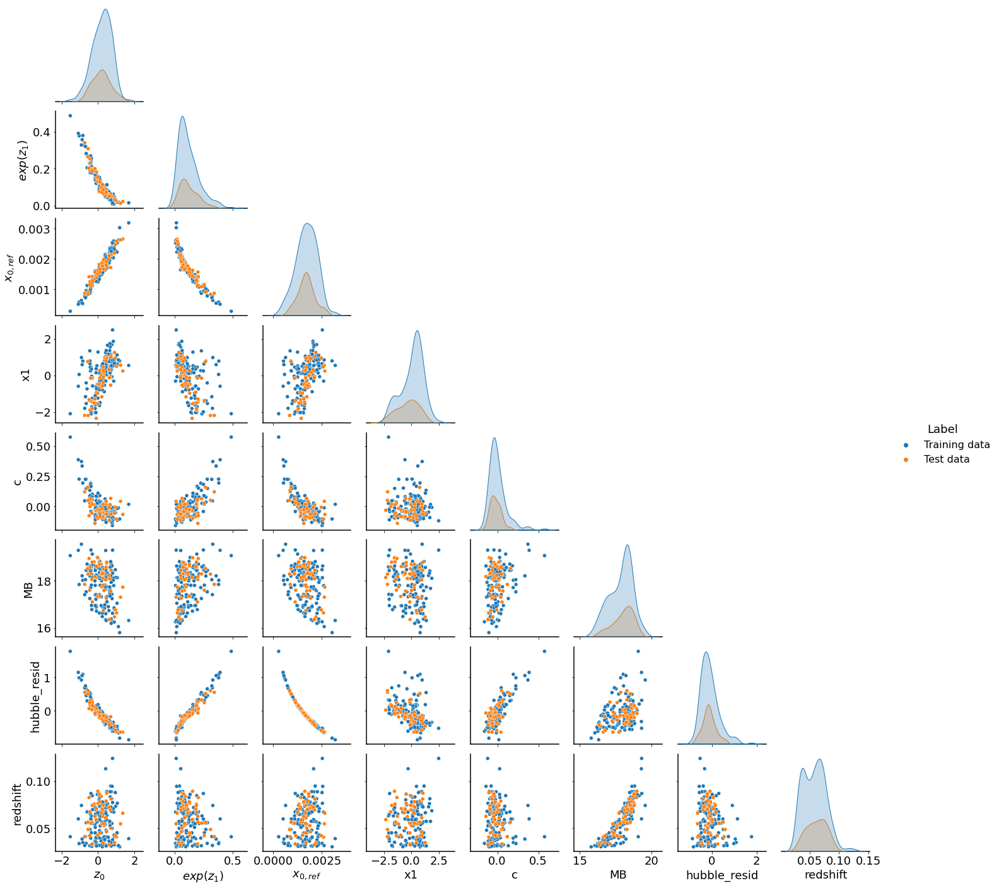

In [24]:
# Corner plot of all variables
import seaborn as sns
import pandas as pd
import scipy.interpolate as interpolate

# savefig=True
savefig=False

dm_train = train_data['redshifts'] > 0.03
dm_test = test_data['redshifts'] > 0.03

zs = np.concatenate([train_data['z_latent'][dm_train], test_data['z_latent'][dm_test]])
us = np.concatenate([train_data['u_latent'][dm_train], test_data['u_latent'][dm_test]])
rs = np.concatenate([train_data['redshifts'][dm_train], test_data['redshifts'][dm_test]])
ss = np.concatenate([train_data['salt_params'][dm_train], test_data['salt_params'][dm_test]])
labs = np.concatenate([ ['Training data']*train_data['z_latent'][dm_train].shape[0], ['Test data']*test_data['z_latent'][dm_test].shape[0]])

dl = np.concatenate([train_data['luminosity_distance'][dm_train], test_data['luminosity_distance'][dm_test]])

d = {}
for i in range(zs.shape[1]):   
    if i == zs.shape[1]-1:
        d['$exp(z_{:d})$'.format(i)] = np.exp(zs[:,i])
    else:
        d['$z_{:d}$'.format(i)] = zs[:,i]

# for i in range(us.shape[1]):    
#     d['$u_{:d}$'.format(i)] = us[:,i]
    
for i in range(0, ss.shape[1]):
    if i==0:
        
#         x0lab = r'$x_0 \left(\frac{d_L(z)}{d_L(z_{ref})}\right)^2 \frac{(1+z)}{(1+z_{ref})}$'
        x0lab = r'$x_{0, ref}$'

        #'luminosity_distance'
        inds_sort = np.argsort(rs)
        dl_z = interpolate.interp1d(rs[inds_sort], dl[inds_sort])

        dl_dz = (dl_z(rs)/dl_z(0.05))**2 * (1+rs)/(1+0.05)
        d[x0lab] = ss[:,i] * dl_dz
    else:
        d[train_data['salt_params_label'][i]] = ss[:,i]

# np.savetxt('x0_vs_z.txt', np.c_[rs, ss[:,0]])

d['redshift'] = rs
d['Label']    = labs


df = pd.DataFrame(data=d)
# test sample is way off
# ind_skip = 3
# df = df.drop(index=176+ind_skip)

sns.pairplot(df, corner=True, hue='Label')


# plt.savefig('corner_plot.pdf', bbox_inches='tight')

In [25]:
# import math
# train_data.keys()
# -np.linalg.inv(np.linalg.inv(train_data['inv_hessian'])),  train_data['covariance']
# for k, v in train_data.items():
#     print(k, tf.is_tensor(v))
    
# for i in range(train_data['maximum_likelihood'].shape[0]):
# #     print(train_data['maximum_likelihood'][i], test_data['maximum_likelihood'][i])
#     if not math.isclose(train_data['maximum_likelihood'][i], test_data['maximum_likelihood'][i], rel_tol=0.02) and (train_data['maximum_likelihood'][i] > test_data['maximum_likelihood'][i]):
#         print(i)
#         print(train_data['maximum_likelihood'][i] , train_data['amplitude_map'][i], train_data['dtime_map'][i])
#         print(test_data['maximum_likelihood'][i], test_data['amplitude_map'][i], test_data['dtime_map'][i])

print(test_data['sn_labels'])
# plt.scatter(np.arange(train_data['maximum_likelihood'].shape[0]), train_data['maximum_likelihood']/test_data['maximum_likelihood']) 
# plt.yscale('log')

KeyError: 'sn_labels'

In [ ]:
# Amplitude and time
# --------- both------------------
fig, axs = plt.subplots(1, 2, figsize=(12, 6))


zmin = min(train_data['redshifts'].min(), test_data['redshifts'].min())
zmax = min(train_data['redshifts'].max(), test_data['redshifts'].max())

xmin = -4
xmax = 4 #2.5
ymin = 0.5#5
ymax = 2.0

for ti, tstr in enumerate(['train', 'test']):

    if tstr=='train':
        data = train_data
#         dm = np.full(train_data['maximum_likelihood'].shape[0], True, dtype=bool)

    if tstr=='test':
        data = test_data
#         dm = train_data['maximum_likelihood'] > test_data['maximum_likelihood']

    t = data['dtime_map']*50
    A = data['amplitude_map']
    dt = data['covariance'][:, -1, -1]*50
    dA = data['covariance'][:, -2, -2]
#     print(dA.max(), dt.max())
    c = (data['redshifts'] - zmin)/(zmax-zmin)
    # print(t[dm], A[dm], dA[dm], dt[dm], train_data['covariance'][dm, -2, -2])
    for i in range(t.shape[0]):
#         axs[ti].errorbar(t[i], A[i], xerr=dt[i], yerr=dA[i], ls='none', color=plt.cm.viridis(c[i]))
        axs[ti].scatter(t[i], A[i], color=plt.cm.viridis(c[i]), alpha=0.6)


    axs[ti].set_xlim(xmin, xmax)
    axs[ti].set_ylim(ymin, ymax)
    
    axs[ti].set_title(tstr.capitalize(), fontsize=16)

    if ti==0:
        axs[ti].set_ylabel('$Amplitude$')
    axs[ti].set_xlabel('$\Delta time\ [days]$')

# ax0.axhline(1.0, ls='--', color='k')
# ax1.axhline(1.0, ls='--', color='k')
# # ax2.axhline(1.0, ls='--', color='k')

# ax0.axvline(0.0, ls='--', color='k')
# ax1.axvline(0.0, ls='--', color='k')
# # ax2.axvline(0.0, ls='--', color='k')

# # ax0.legend(loc='upper right', frameon=False)
# # ax1.legend(loc='upper right', frameon=False)
# # ax2.legend(loc='upper right', frameon=False)


# # ax2.set_title('Testing HMC', fontsize=18)

# #   ax1.legend(loc='upper center', frameon=False, ncol=4, 
# #                    handlelength=1., handletextpad=0.5,
# #                    bbox_to_anchor=(0.5, 1.15), title='Posterior $A, \Delta t:$')
        
# ax1.set_yticklabels([])
# # ax2.set_yticklabels([])


# # if savefig:
# #     plt.savefig('../figures/uncertainty_quantification/train_test_amplitude_time_scatter.pdf', bbox_inches='tight')

# plt.savefig('amplitude_vs_dtime.pdf', bbox_inches='tight')

In [ ]:
# plt.scatter(train_data['loss_hist'][:, 1], test_data['loss_hist'][:, 1])
# plt.scatter(train_data['loss_hist'][:, 1], train_data['loss_hist'][:, 1])

# r = train_data['loss_hist'][:, 1]/test_data['loss_hist'][:, 1]
# dm = r<1
# print( train_data['loss_hist'][dm, 1], test_data['loss_hist'][dm, 1])

# for i in range(train_data['loss_hist'][dm, 1].shape[0]):
#     print(train_data['loss_hist'][dm, 1][i]/test_data['loss_hist'][dm, 1][i], 
#           train_data['amplitude_hist'][dm, 1][i], 
#           test_data['amplitude_hist'][dm, 1][i])

In [ ]:
# train_data['loss_hist'][:,-1]

#  2.1253973e-01, -7.7128053e-02,  5.0641666e-03,  2.8382801e-04],
#         [-7.7128053e-02,  3.3463292e-02, -3.3468986e-04, -2.2039299e-04],
#         [ 5.0641666e-03, -3.3468986e-04,  5.9356750e-04, -1.8589179e-05],
#         [ 2.8382801e-04, -2.2039299e-04, -1.8589179e-05,  6.9029115e-06]],

#        [[ 6.6618896e-01, -2.3645161e-01,  5.2320850e-03, -2.1465599e-04],
#         [-2.3645161e-01,  8.3938368e-02, -1.8503435e-03,  7.9555291e-05],
#         [ 5.2320850e-03, -1.8503435e-03,  7.0984133e-05,  3.2766773e-06],
#         [-2.1465599e-04,  7.9555291e-05,  3.2766773e-06,  3.3252443e-06]],

#        [[ 3.9459396e-02,  1.0351125e-02,  2.0044134e-04,  2.5505909e-05],
#         [ 1.0351125e-02,  3.2500615e-03, -1.2141025e-04,  2.7588927e-05],
#         [ 2.0044134e-04, -1.2141025e-04,  1.1000911e-04, -1.4087672e-06],
#         [ 2.5505909e-05,  2.7588927e-05, -1.4087672e-06,  4.0199934e-06

In [ ]:
train_data.keys(), train_data['salt_params_label']

In [34]:
# name,iau_name,salt_x1,salt_x1_err,salt_c,salt_c_err,rbtl_av,rbtl_av_err,rbtl_dm,rbtl_dm_err,xi_1,xi_2,xi_3,dm_residuals_twins,dm_residuals_salt,mask_twins,mask_salt
df_twins = pd.read_csv('data/boone_data.dat', delimiter = ",")
df_twins

,name,iau_name,salt_x1,salt_x1_err,salt_c,salt_c_err,rbtl_av,rbtl_av_err,rbtl_dm,rbtl_dm_err,xi_1,xi_2,xi_3,dm_residuals_twins,dm_residuals_salt,mask_twins,mask_salt
0,CSS110918_01,SN2011gf,0.967207,0.165343,-0.148229,0.029244,-0.385303,0.012061,0.093838,0.082249,-0.540578,0.579459,-1.273868,0.080634,0.120296,True,True
1,CSS110918_02,SN2011ga,-0.105939,0.201070,-0.057414,0.030794,-0.112257,0.012064,0.039548,0.057930,0.304010,-0.828091,0.572674,0.031052,0.009806,True,True
2,CSS120424_01,CSS120424\_01,0.916477,0.186529,-0.062033,0.030413,-0.171355,0.013152,0.026040,0.059351,-1.188422,1.068120,0.407094,-0.009120,0.098368,True,True
3,CSS130502_01,CSS130502\_01,-0.031882,0.205939,-0.106917,0.030909,-0.217453,0.011826,0.185999,0.065010,2.088746,-1.108696,-0.321906,0.163458,0.168614,True,True
4,LSQ12dbr,LSQ12dbr,1.121662,0.103410,-0.140146,0.027260,-0.376683,0.011939,0.038228,0.117380,0.123506,0.953317,-1.644063,0.014981,0.066712,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198,SNUGC11797,SN2015N,0.505604,0.579733,0.083711,0.038223,0.073001,0.011949,-0.911237,0.123461,-4.021680,1.416634,-2.174397,-0.853686,-0.880465,False,False
199,SNUGC2855,SNUGC2855,-0.278836,0.160914,-0.097173,0.030924,-0.230618,0.012026,0.045572,0.584684,2.627988,-0.183095,-1.628669,0.064898,-0.042096,False,False
200,SNhunt281,AT2015bp,-2.441861,0.212036,-0.057860,0.034561,0.284932,0.012097,0.921659,0.461478,0.760761,-3.361403,0.517785,0.895812,0.997366,False,False
201,SNhunt46,SN2011be,0.482091,0.233557,-0.070521,0.032047,-0.161315,0.011799,0.095668,0.061864,2.174565,-0.608511,-0.955559,0.092299,0.146287,True,True


In [71]:
dm_twins = df_twins['dm_residuals_twins']
dm_twins_salt = df_twins['dm_residuals_salt']
dm_twins_mask = df_twins['mask_twins']

# print(train_data.keys())

train_names = load_data('data/test_data_kfold0.npy')
print(train_names['names'], len(train_names['names']), len(np.unique(train_names['names'])))
set_snf = set(list(train_names['names']))
set_boone = set(list(df_twins['name']))

intersection = list(set_snf & set_boone)
print(intersection)
mask_twins = np.full(data['names'].shape[0], False)
dm_twins = np.zeros(data['names'].shape[0])


for i, name in enumerate(intersection):
    ind_snf = np.argwhere(train_names['names'] == name)[0]
    dfi = df_twins[df_twins['name'] == name]
    mask_twins[ind_snf] = dfi['mask_twins']
    dm_twins[ind_snf] = dfi['dm_residuals_twins']
    
dm_twins

['SN2006dm' 'SN2009hi' 'SN2010dt' 'SNF20070712-003' 'SNF20070727-016'
 'LSQ13avx' 'PTF11mkx' 'SNF20061024-000' 'SNF20070506-006'
 'SNF20080510-005' 'PTF13anh' 'SNF20070330-024' 'SNF20070429-000'
 'LSQ12ekl' 'PTF11bgv' 'PTF11qzq' 'SNF20071003-016' 'SNF20080919-001'
 'SNhunt46' 'SN2006ob' 'LSQ13vy' 'SNF20070810-004' 'PTF11pbp'
 'SNF20070417-002' 'SNF20070331-025' 'SNF20080810-001' 'SNNGC2691'
 'SNF20080806-002' 'PTF12izc' 'PTF12ena' 'SNF20080918-002' 'LSQ12hjm'
 'PTF12hwb' 'SN2005hc' 'SNF20080731-000' 'LSQ12fhe' 'SNF20080610-000'
 'SNF20070818-001' 'SN2005bg' 'PTF09foz' 'SNF20061022-005'
 'SNF20070701-005' 'PTF10ndc' 'SNF20060621-012' 'SNNGC2370' 'SN2007cq'
 'SNNGC0927' 'SNF20070403-000' 'SNF20060512-002' 'SNF20080926-009'
 'SNF20070817-003' 'SNF20080614-010' 'SNF20061030-010' 'SNF20080623-001'
 'LSQ14cnm' 'SNF20080913-031' 'SNNGC4076'] 57 57
['SNNGC0927', 'PTF11bgv', 'LSQ13vy', 'PTF12hwb', 'SNF20070810-004', 'SN2009hi', 'SNF20080623-001', 'SNF20061022-005', 'SNF20061030-010', 'SN2005hc'

array([ 0.05263888,  0.01357097, -0.01879801, ...,  0.        ,
        0.        ,  0.        ])

"['PTF13ajv' 'PTF11kly' 'PTF11mty' 'SNF20060621-012' 'PTF12fuu' 'LSQ12dbr'\n 'SNF20060621-015' 'CSS130502_01' 'SNF20080626-002' 'PTF09dlc' 'PTF10icb'\n 'SNF20070820-000' 'PTF12izc' 'SNF20071015-000' 'SNF20080920-000'\n 'LSQ12gdj' 'SNF20070725-001' 'SNF20061022-014' 'SNF20080516-000'\n 'SNF20080918-002' 'PTF10qjl' 'SNF20061030-010' 'SN2006cj'\n 'SNF20060618-014' 'SNF20080516-022' 'LSQ13aiz' 'SNF20071003-016'\n 'PTF12jqh' 'PTF11kly' 'PTF10nlg' 'SNF20050927-005' 'PTF10ndc' 'SNNGC4424'\n 'SNF20070630-006' 'SN2007bc' 'SNF20070717-003' 'SNIC3573' 'SN2004gs'\n 'PTF11kly' 'SNF20061111-002' 'SN2005bc' 'SNF20070802-000' 'PTF10ygu'\n 'SN2005bc' 'PTF11bnx' 'SNF20070429-000' 'SNF20070902-018' 'PTF12ena'\n 'PTF09dlc' 'SNF20070403-000' 'SNF20050728-006' 'SNBOSS38'\n 'SNF20070803-005' 'SNF20060911-014' 'SNhunt89' 'PTF11mkx' 'SN2012fr'\n 'SNF20080731-000' 'PTF11bju' 'SNF20080920-000' 'CSS110918_02' 'PTF12eer'\n 'LSQ12gxj' 'SNF20080822-005' 'SNF20080620-000' 'PTF10hmv'\n 'SNF20070424-003' 'SNF20080918-0

-0.078944765
-0.078944765
-1.3867457 1.753698
-0.1010299
-0.1010299
-0.4213777 0.48898187


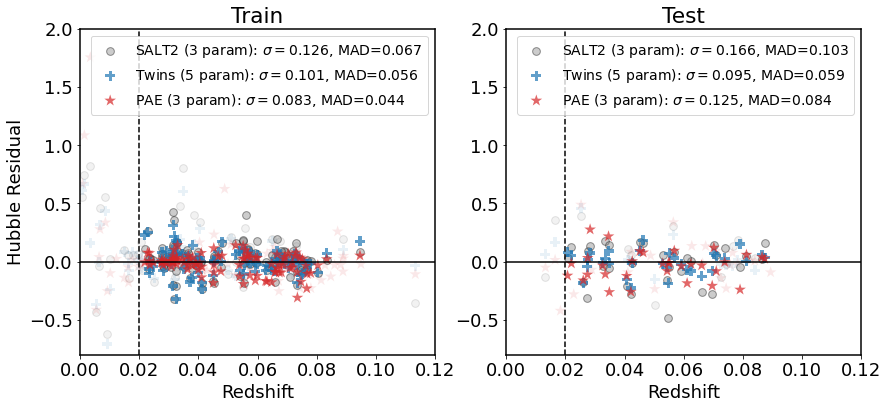

In [115]:
import scipy.interpolate as interpolate

inds_sort = np.argsort(train_data['redshifts'])
dl_dz = interpolate.interp1d(train_data['redshifts'][inds_sort], train_data['luminosity_distance'][inds_sort])

zmeasurement_min = 0.02
ms = 90
mss = [60, 100, 150]

# plt.figure(figsize=(12,8))
fig, axs = plt.subplots(1, 2, figsize=(14, 6))
for ti, tstr in enumerate(['train', 'test']):
    if tstr=='train':
        data = train_data
        data_names = load_data('data/train_data_kfold0.npy')

        m = '*'
#         dm = np.full(train_data['maximum_likelihood'].shape[0], True, dtype=bool)
#         dm = train_data['maximum_likelihood'] > test_data['maximum_likelihood']

    if tstr=='test':
        m = '*'
        data = test_data
        data_names = load_data('data/test_data_kfold0.npy')

#         dm = train_data['maximum_likelihood'] > test_data['maximum_likelihood']

    
    # get twins data for sn
    set_snf = set(list(data_names['names']))
    set_boone = set(list(df_twins['name']))

    intersection = list(set_snf & set_boone)
    in_twins = np.full(data['redshifts'].shape[0], False)
    mask_twins = np.full(data['redshifts'].shape[0], False)
    dm_twins = np.zeros(data['redshifts'].shape[0])
    dm_salt = np.zeros(data['redshifts'].shape[0])

    for i, name in enumerate(intersection):
        ind_snf = np.argwhere(data_names['names'] == name)[0]
        dfi = df_twins[df_twins['name'] == name]
        
        mask_twins[ind_snf] = dfi['mask_twins']
        in_twins[ind_snf]   = True

        dm_twins[ind_snf] = dfi['dm_residuals_twins']
        dm_salt[ind_snf] = dfi['dm_residuals_salt']

    
    
    dm_z = data['redshifts'] > zmeasurement_min

    A = -2.5*np.log10(data['amplitude_map'])

    dm_conds = [False, True]
    alpha_dm_salt = [0.1, 0.4]
    alpha_dm_pae = [0.1, 0.7]

    for idm, dm_cond in enumerate(dm_conds):
        dm = mask_twins == dm_cond

        dm_meas = dm_z & dm
        
#         sigma_salt  = np.std(data['salt_params'][:, -1][dm_meas])
        sigma_salt = np.std(dm_salt[dm_meas])
        sigma_twins = np.std(dm_twins[dm_meas])
        sigma_pae = np.std(A[dm_meas])

#         nmad_salt = np.median(np.abs(data['salt_params'][:, -1][dm_meas] - np.median(data['salt_params'][:, -1][dm_meas])))
        nmad_salt  = np.median(np.abs(dm_salt[dm_meas] - np.median(dm_salt[dm_meas])))
        nmad_twins  = np.median(np.abs(dm_twins[dm_meas] - np.median(dm_twins[dm_meas])))
        nmad_pae  = np.median(np.abs(A[dm_meas] - np.median(A[dm_meas])))

        lab_salt = None
        lab_twins = None
        lab_pae = None
        if idm!=0:
            lab_salt = 'SALT2 (3 param): $\sigma=${:.3f}, MAD={:.3f}'.format(sigma_salt, nmad_salt)
            lab_twins = 'Twins (5 param): $\sigma=${:.3f}, MAD={:.3f}'.format(sigma_twins, nmad_twins)

            lab_pae = 'PAE (3 param): $\sigma=${:.3f}, MAD={:.3f}'.format(sigma_pae, nmad_pae)
        print(np.mean(data['salt_params'][:, -1][dm_z]))

    
#         axs[ti].scatter(data['redshifts'][dm], data['salt_params'][dm, -1],
#                         marker='o', s=mss[0], edgecolor='k',
#                         label=lab_salt, facecolor='gray', alpha=alpha_dm_salt[idm])
        axs[ti].scatter(data['redshifts'][dm & in_twins==True], dm_salt[dm & in_twins==True],
                        marker='o', s=mss[0], edgecolor='k',
                        label=lab_salt, facecolor='gray', alpha=alpha_dm_salt[idm])



    #     dA = np.sqrt(np.abs(data['covariance'][:, -2, -2]))
    #     dA = np.abs(data['covariance'][:, -2, -2])

    #     plt.errorbar(data['redshifts'], A, yerr=dA, ls='none', color='C{:d}'.format(ti))
        axs[ti].scatter(data['redshifts'][dm & in_twins==True], dm_twins[dm & in_twins==True], marker='P',
                        color='C0', edgecolor='none', s=mss[1],
                    label=lab_twins, alpha=alpha_dm_pae[idm])

        axs[ti].scatter(data['redshifts'][dm], A[dm], marker=m, 
                        color='C3', edgecolor='none', s=mss[2],
                        label=lab_pae, alpha=alpha_dm_pae[idm])

                #'luminosity_distance'

    print(A.min(), A.max())
    axs[ti].legend(fontsize=14)
    

    # plt.ylim(0.1, 30)
    # plt.axhline(1, color='k')
    if ti==0:
        axs[ti].set_ylabel(r'Hubble Residual')

    axs[ti].set_xlabel('Redshift')
    axs[ti].set_title(tstr.capitalize())
    
    axs[ti].axhline(0, color='k', ls='-', alpha=1.0)
    axs[ti].axvline(zmeasurement_min, color='k', ls='--')
 
    axs[ti].set_xlim(0, 0.12)
#     axs[ti].set_xlim(zmeasurement_min, 0.12)
    axs[ti].set_ylim(-0.8, 2)

# plt.savefig('figures/hubble_residual.pdf', bbox_inches='tight')


[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False F

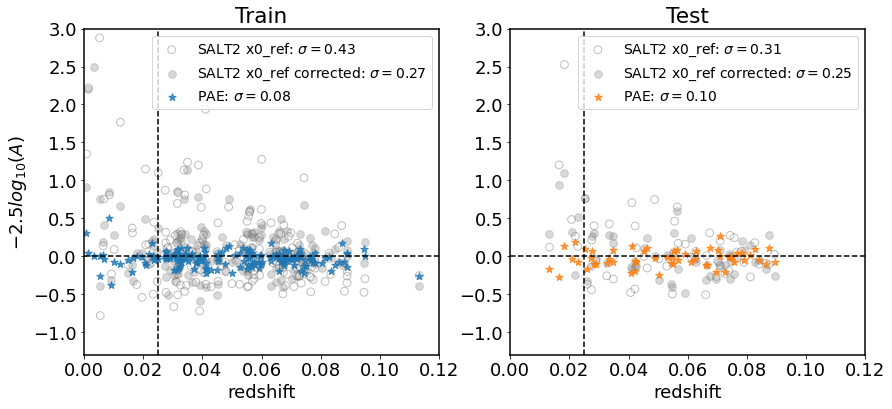

In [35]:
inds_sort = np.argsort(train_data['redshifts'])
dl_dz = interpolate.interp1d(train_data['redshifts'][inds_sort], train_data['luminosity_distance'][inds_sort])

ms = 60
# plt.figure(figsize=(12,8))
fig, axs = plt.subplots(1, 2, figsize=(14, 6))
for ti, tstr in enumerate(['train', 'test']):
    if tstr=='train':
        data = train_data
        m = '*'
#         dm = np.full(train_data['maximum_likelihood'].shape[0], True, dtype=bool)
#         dm = train_data['maximum_likelihood'] > test_data['maximum_likelihood']

    if tstr=='test':
        m = '*'
        data = test_data
#         dm = train_data['maximum_likelihood'] > test_data['maximum_likelihood']

    dm_z = data['redshifts'] > 0.025

    dl_fac = (data['luminosity_distance']/dl_z(0.05))**2 * (1+data['redshifts'])/(1+0.05)
    print()
    x0_ref = data['salt_params'][:, 0]*dl_fac #/np.median(data['salt_params'][:, 0]*dl_fac)
    mag_salt = -2.5*np.log10(x0_ref/np.median(x0_ref))
    mag_salt_corrected = -2.5*np.log10(x0_ref/np.median(x0_ref)) + 1*(0.3*data['salt_params'][:, 1]-1.77*data['salt_params'][:, 2])

    lab = None
    labc = None

#     if ti==0:
    lab = 'SALT2 x0_ref: $\sigma=${:.2f}'.format(np.std(mag_salt[dm_z]))
    labc = 'SALT2 x0_ref corrected: $\sigma=${:.2f}'.format(np.std(mag_salt_corrected[dm_z]))

    axs[ti].scatter(data['redshifts'], mag_salt, marker='o', s=ms, edgecolor='gray', label=lab, facecolor='none', alpha=0.5)
    axs[ti].scatter(data['redshifts'], mag_salt_corrected, marker='o', s=ms, color='gray', label=labc, alpha=0.3)


    print(data['converged'])
    A = -2.5*np.log10(data['amplitude_map'])
#     dA = np.sqrt(np.abs(data['covariance'][:, -2, -2]))
#     dA = np.abs(data['covariance'][:, -2, -2])

#     plt.errorbar(data['redshifts'], A, yerr=dA, ls='none', color='C{:d}'.format(ti))
    axs[ti].scatter(data['redshifts'], A, marker=m, color='C{:d}'.format(ti), s=ms,
                    label=r'PAE: $\sigma=${:.2f}'.format(np.std(A[dm_z])), alpha=0.8)

            #'luminosity_distance'

    print(A.min(), A.max())
    axs[ti].legend(fontsize=14)
    

    # plt.ylim(0.1, 30)
    # plt.axhline(1, color='k')
    if ti==0:
        axs[ti].set_ylabel(r'$-2.5 log_{10}(A)$')

    axs[ti].set_xlabel('redshift')
    axs[ti].set_title(tstr.capitalize())
    
    axs[ti].axhline(0, color='k', ls='--')
    axs[ti].axvline(0.025, color='k', ls='--')
    
    axs[ti].set_xlim(0.0, 0.12)
    axs[ti].set_ylim(-1.3, 3)

# plt.savefig('amplitude_vs_redshift.pdf', bbox_inches='tight')

In [108]:
test_data['redshifts']#[test_data['redshifts'] < 0.05]

array([0.017789, 0.07385 , 0.06655 , 0.00524 , 0.022812, 0.07182 ,
       0.04526 , 0.055955, 0.06719 , 0.031242, 0.06272 , 0.0812  ,
       0.001458, 0.076513, 0.03295 , 0.03403 , 0.08279 , 0.074356,
       0.03    , 0.045185, 0.0593  , 0.06737 , 0.0555  , 0.02075 ,
       0.0313  , 0.07336 , 0.02338 , 0.030324, 0.06754 , 0.0574  ,
       0.064756, 0.02836 , 0.06741 , 0.05985 , 0.065822, 0.05519 ,
       0.027556, 0.041052, 0.042224, 0.056799, 0.07189 , 0.00855 ,
       0.076603, 0.05678 ], dtype=float32)

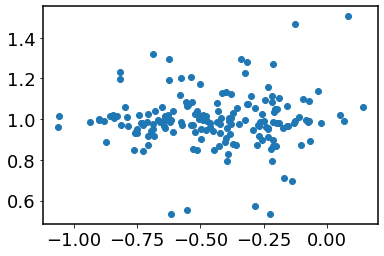

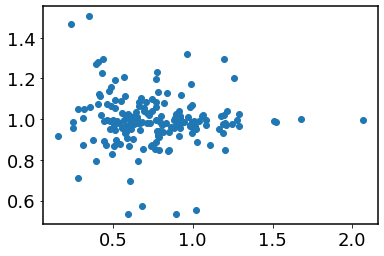

In [46]:
plt.scatter(train_data['z_latent_map'][:,0], train_data['amplitude_map'])
plt.figure()
plt.scatter(train_data['z_latent_map'][:,1], train_data['amplitude_map'])

# Load and use Models

In [36]:
import tensorflow as tf
print('tensorflow version: ', tf.__version__)
print('devices: ', tf.config.list_physical_devices('GPU') )

tfk  = tf.keras
tfkl = tf.keras.layers
print("TFK Version", tfk.__version__)

# %pip install tensorflow-probability==0.9.0                                                                          
import tensorflow_probability as tfp

tfb  = tfp.bijectors
tfd  = tfp.distributions
print("TFP Version", tfp.__version__)

import numpy as np
import os
import time

import tensorboard.plugins.hparams as HParams
import argparse

from utils.YParams import YParams
from utils.data_loader import *
from utils.calculations import *

from models.losses import *
from models.posterior import *

import models.loader 
import models.flow

import matplotlib.pyplot as plt

tensorflow version:  2.5.0
devices:  []
TFK Version 2.5.0
TFP Version 0.12.2


In [37]:
latent_dim = 2

parser = argparse.ArgumentParser()
parser.add_argument("--yaml_config", default='./config/posterior_analysis.yaml', type=str)
parser.add_argument("--config", default='posterior', type=str)
parser.add_argument("--print_params", default=True, action='store_true')

args = parser.parse_args(args=[])


params = YParams(os.path.abspath(args.yaml_config), args.config, print_params=True)#args.print_params)            
params['latent_dim'] = latent_dim
# Get PAE model
PAE = models.loader.PAE(params)

train_data = load_data(params['train_data_file'])#, print_params=params['print_params'])
test_data  = load_data(params['test_data_file'])

# get latent representations from encoder and flow                                                                       
train_data['z_latent'] = PAE.encoder((train_data['spectra'], train_data['times'], train_data['mask'])).numpy()
test_data['z_latent']  = PAE.encoder((test_data['spectra'], test_data['times'], test_data['mask'])).numpy()

train_data['u_latent'] = PAE.flow.bijector.inverse(train_data['z_latent']).numpy()
test_data['u_latent']  = PAE.flow.bijector.inverse(test_data['z_latent']).numpy()

# get reconstructions
train_data['spectra_ae'] = PAE.decoder((train_data['z_latent'], train_data['times'])).numpy()
test_data['spectra_ae']  = PAE.decoder((test_data['z_latent'], test_data['times'])).numpy()

------------------ Configuration ------------------
epochs 100
stop_ratio 0.001
max_iterations 5
max_line_search_iterations 50
nchains 1
test_every 10
seed 13579
batch_size 171
train_noise False
vary_mask False
lr 0.001
noise_scale 1.0
mask_vary_frac 0.2
rMAPini False
train_MAP True
train_amplitude True
train_dtime True
train_bias False
savedata True
fig_dir ../figures/2021/
model_dir tf_models/
data_dir data/
param_dir params/
log_dir logs/
train_data_file data/train_data_kfold0.npy
test_data_file data/test_data_kfold0.npy
colorlaw_file data/F99_colorlaw.txt
out_file_tail _minz_0pt02_physical
kfold 0
model_summary True
savefig False
savemodel True
print_params True
data_dim 288
cond_dim 1
n_timestep 32
encode_dims [256, 128, 32]
decode_dims [32, 128, 256]
latent_dims [2]
physical_latent True
colorlaw_preset True
use_amplitude False
nlayers 12
nunit 8
batchnorm False
---------------------------------------------------
params/AE_kfold0_02Dlatent_layers256-128-32_minz_0pt02_physical.npy


In [49]:
# z = train_data['z_latent'].copy()
# u = PAE.flow.bijector.inverse(z).numpy()
# print(z[0], u[0])

# z = train_data['z_latent'].copy()
# z[:, -1] = np.log(0.2)
# u = PAE.flow.bijector.inverse(z).numpy()
# print(z[0], u[0])

# # u[0, -1] = -4
# # print(u[0])
# # z = PAE.flow.bijector.forward(u).numpy()
# # print(z[0], np.exp(z[0,-1]))

Text(0, 0.5, 'AE')

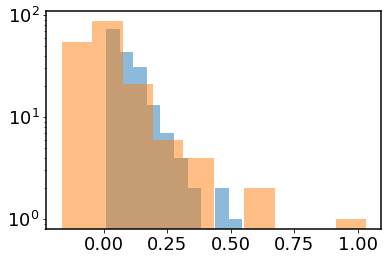

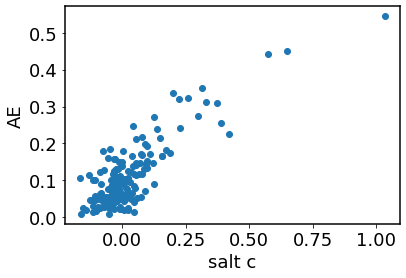

In [50]:
plt.figure()
plt.hist(np.exp(train_data['z_latent'][:,-1]), label='AE aolor', alpha=0.5)
# plt.hist(train_data['z_latent'][:,-1], label='AE aolor', alpha=0.5)
plt.hist(train_data['salt_params'][:,-1], label='SALT2 color', alpha=0.5)
plt.yscale('log')

plt.figure()
plt.scatter(train_data['salt_params'][:,-1], np.exp(train_data['z_latent'][:,-1]), label='AE aolor')
plt.xlabel('salt c')
plt.ylabel('AE')


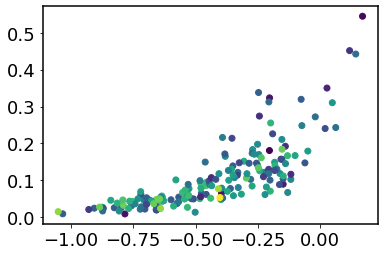

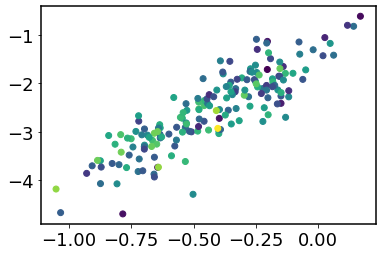

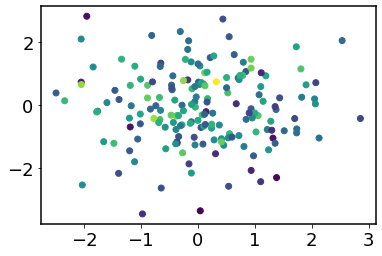

In [51]:
plt.scatter(train_data['z_latent'][:,0], np.exp(train_data['z_latent'][:,-1]), c=train_data['redshifts'])

plt.figure()
plt.scatter(train_data['z_latent'][:,0], train_data['z_latent'][:,-1], c=train_data['redshifts'])

plt.figure()
plt.scatter(train_data['u_latent'][:,0], train_data['u_latent'][:,-1], c=train_data['redshifts'])

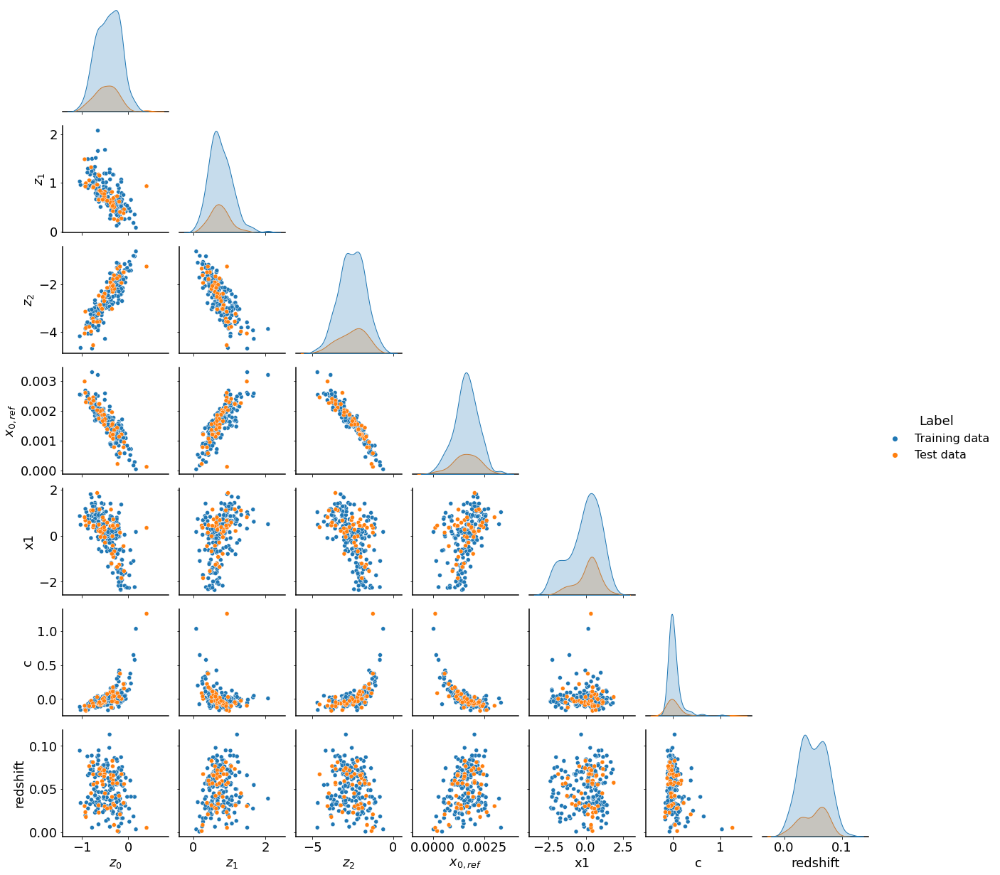

In [127]:
# Corner plot of all variables
import seaborn as sns
import pandas as pd
import scipy.interpolate as interpolate

# savefig=True
savefig=False

zs = np.concatenate([train_data['z_latent'], test_data['z_latent']])
us = np.concatenate([train_data['u_latent'], test_data['u_latent']])
rs = np.concatenate([train_data['redshifts'], test_data['redshifts']])
ss = np.concatenate([train_data['salt_params'], test_data['salt_params']])
labs = np.concatenate([ ['Training data']*train_data['z_latent'].shape[0], ['Test data']*test_data['z_latent'].shape[0]])

dl = np.concatenate([train_data['luminosity_distance'], test_data['luminosity_distance']])

d = {}
for i in range(zs.shape[1]):    
    d['$z_{:d}$'.format(i)] = zs[:,i]
    
# for i in range(us.shape[1]):    
#     d['$u_{:d}$'.format(i)] = us[:,i]
    
for i in range(0, ss.shape[1]):
    if i==0:
        
#         x0lab = r'$x_0 \left(\frac{d_L(z)}{d_L(z_{ref})}\right)^2 \frac{(1+z)}{(1+z_{ref})}$'
        x0lab = r'$x_{0, ref}$'
        #'luminosity_distance'
        inds_sort = np.argsort(rs)
        dl_z = interpolate.interp1d(rs[inds_sort], dl[inds_sort])


        dl_dz = (dl_z(rs)/dl_z(0.05))**2 * (1+rs)/(1+0.05)
        d[x0lab] = ss[:,i] * dl_dz
    else:
        d[train_data['salt_params_label'][i]] = ss[:,i]

# np.savetxt('x0_vs_z.txt', np.c_[rs, ss[:,0]])

d['redshift'] = rs
d['Label']    = labs


df = pd.DataFrame(data=d)
# test sample is way off
# ind_skip = 3
# df = df.drop(index=176+ind_skip)

sns.pairplot(df, corner=True, hue='Label')


[-4.85433769 -3.77303451 -2.69173133 -1.61042815 -0.52912498  0.5521782
  1.63348138]
[[0.         0.07419355 0.1483871  0.22258065 0.29677419 0.37096774
  0.44516129 0.51935484 0.59354839 0.66774194 0.74193548 0.81612903
  0.89032258 0.96451613 1.03870968 1.11290323 1.18709677 1.26129032
  1.33548387 1.40967742 1.48387097 1.55806452 1.63225806 1.70645161
  1.78064516 1.85483871 1.92903226 2.00322581 2.07741935 2.1516129
  2.22580645 2.3       ]] [[-10.          -6.29032258  -2.58064516   1.12903226   4.83870968
    8.5483871   12.25806452  15.96774194  19.67741935  23.38709677
   27.09677419  30.80645161  34.51612903  38.22580645  41.93548387
   45.64516129  49.35483871  53.06451613  56.77419355  60.48387097
   64.19354839  67.90322581  71.61290323  75.32258065  79.03225806
   82.74193548  86.4516129   90.16129032  93.87096774  97.58064516
  101.29032258 105.        ]]
[[ 0.54778576 -2.34041905]]
[-0.25159109  0.01486784  0.28132677  0.5477857   0.81424463  1.08070356
  1.34716249]
[[

No handles with labels found to put in legend.


[[-0.25159109 -2.34041905]]
[[ 0.01486784 -2.34041905]]
[[ 0.28132677 -2.34041905]]
[[ 0.5477857  -2.34041905]]
[[ 0.81424463 -2.34041905]]
[[ 1.08070356 -2.34041905]]
[[ 1.34716249 -2.34041905]]


No handles with labels found to put in legend.


[-4.00704038 -3.45150018 -2.89595997 -2.34041977 -1.78487957 -1.22933936
 -0.67379916]
[[ 0.54778576 -4.00704038]]
[[ 0.54778576 -3.45150018]]
[[ 0.54778576 -2.89595997]]
[[ 0.54778576 -2.34041977]]
[[ 0.54778576 -1.78487957]]
[[ 0.54778576 -1.22933936]]
[[ 0.54778576 -0.67379916]]


No handles with labels found to put in legend.


[[ 0.54778576 -4.00704038]]
[[ 0.54778576 -3.45150018]]
[[ 0.54778576 -2.89595997]]
[[ 0.54778576 -2.34041977]]
[[ 0.54778576 -1.78487957]]
[[ 0.54778576 -1.22933936]]
[[ 0.54778576 -0.67379916]]


No handles with labels found to put in legend.


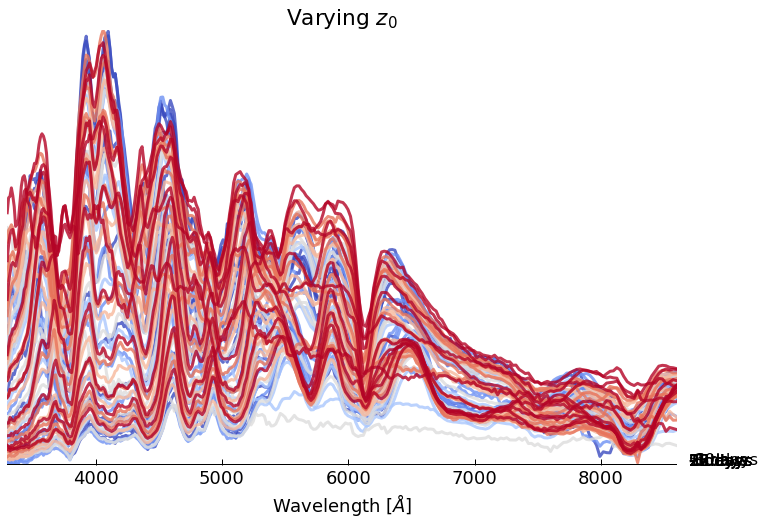

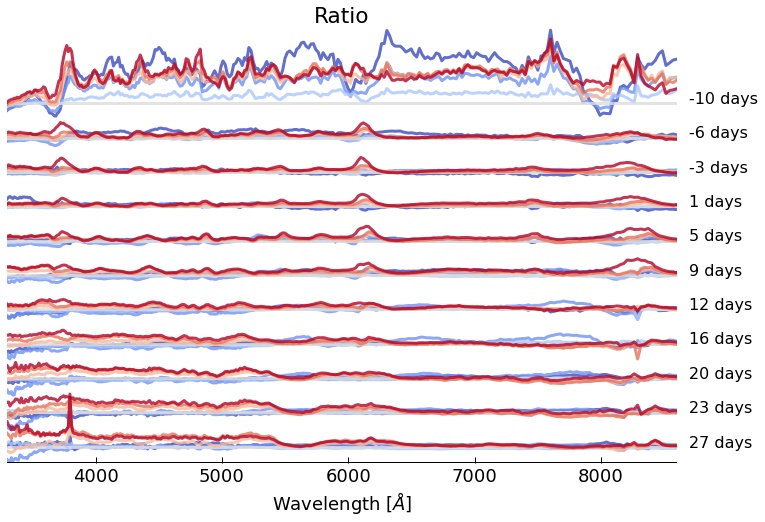

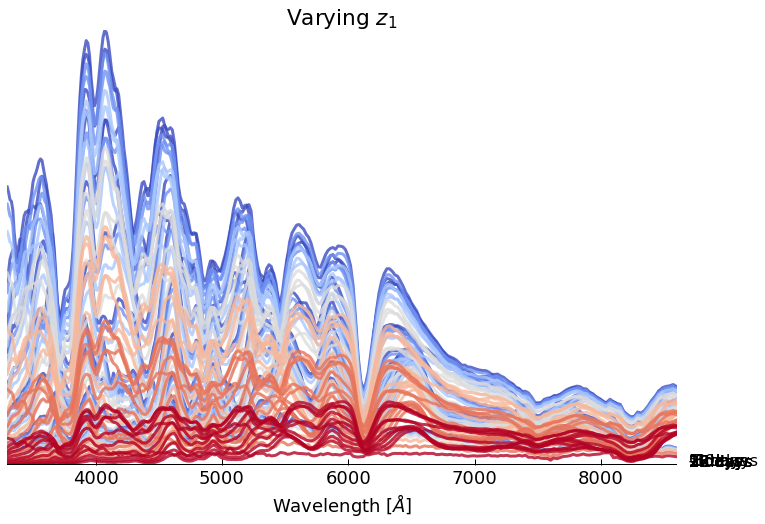

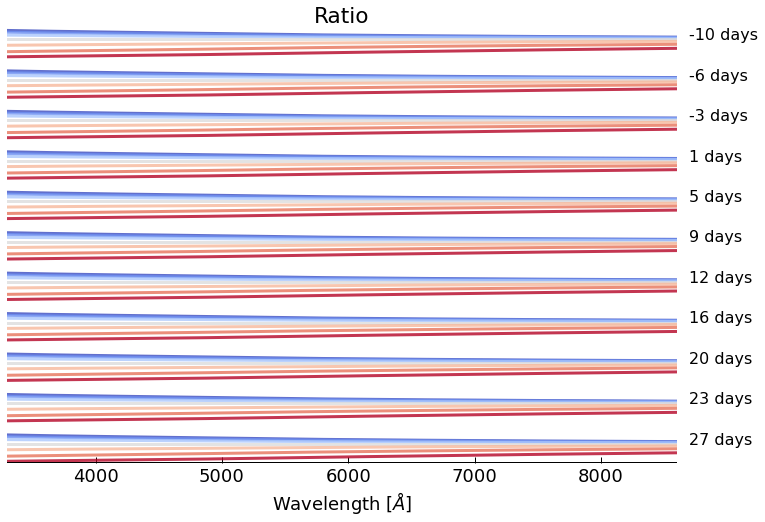

In [39]:
# Plot SN while varying z latent params to see effects
zin = PAE.encoder((train_data['spectra'], train_data['times'], train_data['mask'])).numpy()

savefig = True
# savefig = False

lwt = 2
lw  = 3

c0  = 'orangered'
c1  = 'C0'

wave_txt = train_data['wavelengths'][-1]+100

alpha=0.8
#     fig, ((ax1, ax2)) = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(16,8), gridspec_kw={'height_ratios': [3, 1]})
plttypes = ['normal', 'residual']
aoffsets_list = [[0.1, 3], [0.1, 5], [1.5, 2.75]] #0.7]

# get data to use

nsamples   = 7
zsamp = np.linspace(zin.min(), zin.max(), nsamples)
print(zsamp)
# plt.plot(zin.flatten())
Asamp = np.linspace(0.5, 1.5, nsamples)

nshow = 11 #3
times_lin = np.zeros((1, params['n_timestep'])) + np.linspace(0, 2.3, params['n_timestep'])

# nshow = 6 #3
# times_lin = np.zeros((1, 24)) + np.linspace(0,4.6,24)

times_orig_lin = times_lin*50 - 10
print(times_lin, times_orig_lin)

sample     = 0
seed       = 13579 #np.random.randint(10000)
redshift   = 0.05
ntrainstep = 2000
stop_ratio = 1.0001

cmap = plt.cm.coolwarm
colors = cmap(np.linspace(0,1,nsamples))

z = np.zeros((1, params['latent_dim'])) + zin.mean(0)
print(z)
# get u array of zeros
for dim in range(z.shape[1]):
    if dim < 2:
        aoffsets = [0.75, 2] #aoffsets_list[dim]
        std = 2.0
    else:
        aoffsets = [1.5, 2] #aoffsets_list[dim]
        std = 1.0
    title = 'Varying u$_{:d}$'.format(dim)

    zstd = zin[:,dim].std()*std
    zmean = zin[:,dim].mean()
    zsamp = np.linspace(zmean-zstd, zmean+zstd, nsamples)
    print(zsamp)
    for iplt, plttype in enumerate(plttypes):
        
        if plttype == 'normal':   title = 'Varying $z_{:d}$'.format(dim)
        if plttype == 'residual': title = 'Ratio'

        fig, ((ax1 )) = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(12,8))#, gridspec_kw={'height_ratios': [3, 1]})

        for axis in ['top','bottom','left','right']:
            ax1.spines[axis].set_linewidth(1.)
    #         ax2.spines[axis].set_linewidth(1.5)

        ax1.tick_params('both', length=6, width=1., which='major', color='k',direction='in')                                         
        ax1.tick_params('both', length=3, width=1., which='minor', color='k',direction='in')
    #     ax2.tick_params('both', length=6, width=1.5, which='major', color='k',direction='in')                                         
    #     ax2.tick_params('both', length=3, width=1.5, which='minor', color='k',direction='in')

        ymin = 100
        ymax = 0
        
        # get origin value
        z_ = z.copy()
        xpred_m = PAE.decoder((z_, times_lin))[0]
        
        for sample, zi in enumerate(zsamp):
            # set u values along slice
            z_ = z.copy()
            z_[:, dim] = zi
            print(z_)
#             print(decoder((z_, times_lin))[0].shape, times_lin.shape)
            xpred_i = PAE.decoder((z_, times_lin))[0] 
#             if dim==1:
#                 xpred_i *= Asamp[sample]
                
            offset = np.arange(times_lin.shape[1]) * -1 * aoffsets[iplt]

            for i in range(nshow):
                labp = None
                labo = None
                if i==0:
                    labs = 'Encoder'
                    labp = 'MAP'
                if plttype == 'normal':
                    xpi = xpred_i[i]*train_data['wavelengths']+ offset[i]
                    ax1.plot(train_data['wavelengths'], xpi, '-', c=colors[sample], lw=lw, alpha=alpha)#, label=labp)

                    if sample == len(zsamp)//2:
                        ax1.text(wave_txt, offset[i], '{:.0f} days'.format(times_orig_lin[0,i]), fontsize=16)

                    ymin = min(ymin, min(xpi) )
                    ymax = max(ymax, max(xpi) )

                if plttype == 'residual':
                    xti = xpred_m[i]
                    xpi = xpred_i[i]
#                     print(xti, xpi)
                    ax1.plot(train_data['wavelengths'], xpi/xti + offset[i], '-', c=colors[sample], lw=lw, alpha=alpha)#, label=labp)

                    if sample == len(zsamp)//2:
                        ax1.text(wave_txt, (xpi/xti)[-1] + offset[i], '{:.0f} days'.format(times_orig_lin[0,i]), fontsize=16)
                
                    if plttype == 'normal': 
                        ymin = min(ymin, min(xpi/xti + offset[i])-0.1)
                        ymax = max(ymax, max(xpi/xti + offset[i])+0.1)
                    if plttype == 'residual': 
                        ymin = min(ymin, min(xpi/xti + offset[i])-0.1)
                        ymax = max(ymax, max(xpi/xti + offset[i])+0.1)
                                       
        #         ax1.set_title(title+', z={:.4f}, latent=[{:.2f}, {:.2f}]'.format(red, z_lat[0], z_lat[1]))
        ax1.set_title(title)


        ax1.set_ylabel('Restframe Flux')
    #     ax2.set_ylabel('$|x-x_{recon}|/\sigma$')
        ax1.set_xlabel('Wavelength [$\AA$]')
        ax1.set_ylabel('Normalized Restframe Flux(t, $\lambda$)')

        if plttype == 'normal':      
            ax1.set_ylim(ymin, ymax)
            
        if plttype == 'residual':  
#             ymin = min(offset[:nshow])-4
#             ymax = max(offset[:nshow])+4

            ax1.set_ylim(ymin, ymax)
               
#         ax1.set_ylim(ymin-0.1, ymax)
        
#         ax1.spines['right'].set_visible(False)
#         ax1.spines['top'].set_visible(False)

#         # Only show ticks on the left and bottom spines
#         ax1.yaxis.set_ticks_position('left')
#         ax1.xaxis.set_ticks_position('bottom')

        ax1.set_frame_on(False)
        ax1.get_xaxis().tick_bottom()
        ax1.axes.get_yaxis().set_visible(False)
        xmin, xmax = ax1.get_xaxis().get_view_interval()
        ymin, ymax = ax1.get_yaxis().get_view_interval()
        ax1.add_artist(plt.Line2D((xmin, xmax), (ymin, ymin), color='black', linewidth=2))

        ax1.legend(loc='upper right', frameon=False, ncol=3)


    #     ax1.axis('off')

    #     ax2.set_yscale('log')
        ax1.set_xlim(train_data['wavelengths'][0], train_data['wavelengths'][-1])
    #     plt.subplots_adjust(hspace=0.025)

#         if savefig: 
#             fname = 'vary_zlatent_{:d}_{:s}'.format(dim, plttype)
#             plt.savefig(figdir+fname+'.pdf', bbox_inches='tight')



In [56]:
train_data_file = 'data/train_data_kfold0_posterior_{:02d}Dlatent_layers256-128-32_minz_0pt03_physical.npy'.format(latent_dim)
test_data_file  = 'data/test_data_kfold0_posterior_{:02d}Dlatent_layers256-128-32_minz_0pt03_physical.npy'.format(latent_dim)

train_data = load_data(train_data_file)
test_data  = load_data(test_data_file)

In [174]:
amplitude_input_dim = train_data['z_latent'].shape[-1]#+1
amplitude_predictor_inputs = tfkl.Input(shape=(amplitude_input_dim))            

# x =  tf.keras.layers.Dense(amplitude_input_dim, activation=tf.nn.relu)(amplitude_predictor_inputs) 
# x =  tf.keras.layers.Dense(amplitude_input_dim, activation=tf.nn.relu)(x)  
# x =  tf.keras.layers.Dense(amplitude_input_dim, activation=tf.nn.relu)(x)  
# x =  tf.keras.layers.Dense(amplitude_input_dim, activation=tf.nn.relu)(x)  
# x =  tf.keras.layers.Dense(amplitude_input_dim, activation=tf.nn.relu)(x)  
# x =  tf.keras.layers.Dense(amplitude_input_dim, activation=tf.nn.relu)(x)  

amplitude_predictor_outputs = tf.keras.layers.Dense(1, use_bias=False)(amplitude_predictor_inputs)                   
                                                         
Amodel = tfk.Model(inputs=amplitude_predictor_inputs, 
          outputs=amplitude_predictor_outputs)   

Amodel.compile(optimizer="Adam", loss="mse", metrics=["mae"])

z_train = train_data['z_latent'].copy()
z_train[:,-1] = np.exp(z_train[:,-1])
# z_train = np.c_[z_train, train_data['dtime_map']]
Amodel.fit(z_train, train_data['amplitude_map'], epochs=5000, verbose=0)

(176,) (176,)


Text(0.5, 0, 'Amplitude MAP')

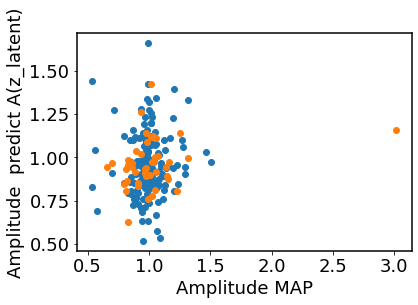

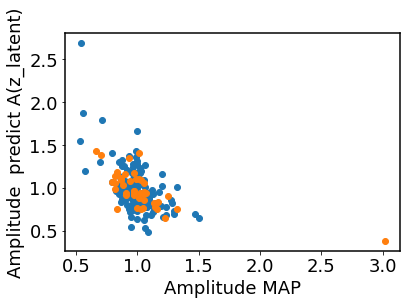

In [175]:
z_train = train_data['z_latent'].copy()
z_train[:,-1] = np.exp(z_train[:,-1])
# z_train = np.c_[z_train, train_data['dtime_map']]

z_test = test_data['z_latent'].copy()
z_test[:,-1] = np.exp(z_test[:,-1])
# z_test = np.c_[z_test, test_data['dtime_map']]

pred_train = Amodel.predict(z_train).flatten()
true_train = train_data['amplitude_map']

pred_test = Amodel.predict(z_test).flatten()
true_test = test_data['amplitude_map']

plt.figure()
plt.scatter(true_train, pred_train)
plt.scatter(true_test, pred_test)

plt.ylabel('Amplitude  predict A(z_latent)')
plt.xlabel('Amplitude MAP')

print(pred_train.shape, true_train.shape)
plt.figure()
plt.scatter(true_train, pred_train/true_train)
plt.scatter(true_test, pred_test/true_test)

plt.ylabel('Amplitude  predict A(z_latent)')
plt.xlabel('Amplitude MAP')

Text(0, 0.5, '$z_2$')

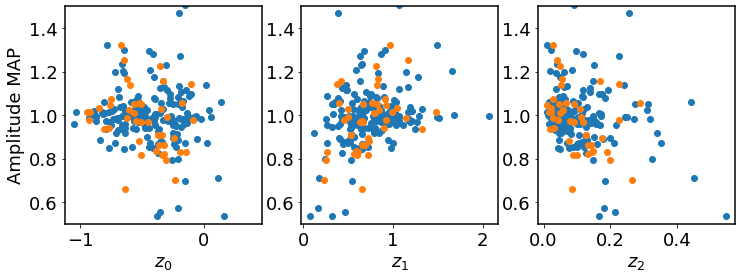

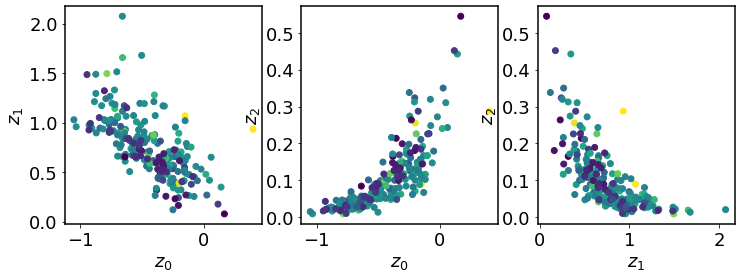

In [176]:
fig, axs = plt.subplots(1, z_train.shape[-1], figsize=(12,4))
for i in range(z_train.shape[-1]):
    axs[i].scatter(z_train[:, i], train_data['amplitude_map'])
    axs[i].scatter(z_test[:, i], test_data['amplitude_map'])
    if i==0:
        axs[i].set_ylabel('Amplitude MAP')
    axs[i].set_xlabel('$z_{0}$'.format(i))
    
    axs[i].set_ylim(0.5, 1.5)
    
    
fig, axs = plt.subplots(1, z_train.shape[-1], figsize=(12,4))
axs[0].scatter(z_train[:, 0], z_train[:, 1], c=train_data['amplitude_map'])
axs[0].scatter(z_test[:, 0], z_test[:, 1], c=test_data['amplitude_map'])

axs[1].scatter(z_train[:, 0], z_train[:, 2], c=train_data['amplitude_map'])
axs[1].scatter(z_test[:, 0], z_test[:, 2], c=test_data['amplitude_map'])

axs[2].scatter(z_train[:, 1], z_train[:, 2], c=train_data['amplitude_map'])
axs[2].scatter(z_test[:, 1], z_test[:, 2], c=test_data['amplitude_map'])

axs[0].set_xlabel('$z_0$')
axs[0].set_ylabel('$z_1$')

axs[1].set_xlabel('$z_0$')
axs[1].set_ylabel('$z_2$')

axs[2].set_xlabel('$z_1$')
axs[2].set_ylabel('$z_2$')

# axs[i].set_xlabel('$z_{0}$'.format(i))

# axs[i].set_ylim(0.5, 1.5)

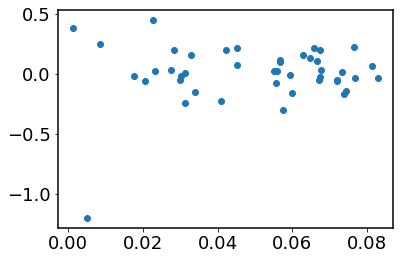

In [76]:
plt.scatter(test_data['redshifts'], -2.5*np.log10(test_data['amplitude_map']))

## kfold = 0
savefig= False

In [ ]:
# Load data
spectra = {}
spectra_salt = {}
sigma = {}
mask = {}
times = {}
times_orig = {}
salts = {}
redshifts = {}
labels = {}
salt_params = {}
luminosity_distance = {}

spectra_ae = {}
spectra_map = {}

u_latent_ae = {}
z_latent_ae = {}
u_latent_map = {}
z_latent_map = {}

lp_u_latent_ae = {}
lp_z_latent_ae = {}
lJ_u_latent_ae = {}
lp_u_latent_map = {}
lp_z_latent_map = {}
lJ_u_latent_map = {}

loss_ae = {}
loss_map = {}
dt = {}
cov = {}
dt_sig = {}

# cmap = plt.cm.viridis()

nx=8

fig = plt.figure(figsize=(20,5))
gs = fig.add_gridspec(1,nx)
gs.update(wspace=0.02, hspace=0.02)

ax0 = fig.add_subplot(gs[:, 0:nx-1])
ax0_y = fig.add_subplot(gs[:, nx-1], sharey=ax0)

#1 spectra at a time
kfold = 0
latent_dim = 3
dt_all = []
snuse_all = []

for imask in range(24):
    # for tstr in ['train', 'test']:
    for tstr in ['test']:

        # spectra data
        df = np.load('../data/{:s}_data_kfold{:d}.npz'.format(tstr, kfold))

        wavelengths       = df['wavelengths']
        salt_params[tstr] = df['salt_params']
        salt_params_label = df['salt_params_label']

        spectra[tstr]      = df['spectra']
        spectra_salt[tstr] = df['spectra_salt']
        sigma[tstr]        = df['sigma']

        mask[tstr]         = df['mask']    
        times[tstr]        = df['times']
        times_orig[tstr]   = df['times_orig']
        salts[tstr]        = df['salts']
        redshifts[tstr]    = df['redshifts']
        labels[tstr]       = df['labels']
        
        luminosity_distance[tstr] = df['luminosity_distance']

        # post map
    #     df = np.load('../data/{:s}_data_{:02d}Dlatent_ae_kfold{:d}.npz'.format(tstr, latent_dim, kfold))
        df = np.load('../data/{:s}_data_{:02d}Dlatent_MAP_kfold{:d}_imask{:02d}.npz'.format(tstr, latent_dim, kfold, imask))

    #     spectra_map[tstr] = df['spectra_map']
        spectra_ae[tstr]  = df['spectra_ae']

    #     u_latent_ae[tstr] = df['u_latent_ae']
    #     z_latent_ae[tstr] = df['z_latent_ae']
    #     u_latent_map[tstr] = df['u_latent_map']
    #     z_latent_map[tstr] = df['z_latent_map']

    #     lp_u_latent_ae[tstr] = df['lp_u_latent_ae']
    #     lp_z_latent_ae[tstr] = df['lp_z_latent_ae']
    #     lJ_u_latent_ae[tstr] = df['lJ_u_latent_ae']
    #     lp_u_latent_map[tstr] = df['lp_u_latent_map']
    #     lp_z_latent_map[tstr] = df['lp_z_latent_map']
    #     lJ_u_latent_map[tstr] = df['lJ_u_latent_map']

    #     loss_ae[tstr]  = df['loss_ae']
    #     loss_map[tstr] = df['loss_map']

        dt[tstr]  = df['dtime']*50
        cov[tstr] = df['covariance']
        dt_sig[tstr] = np.sqrt(cov[tstr][:, -1, -1])*50
        dt[tstr][np.isnan(dt[tstr])] = 0

    cond_dim     = 1 # time
    n_timestep   = spectra['test'].shape[1]
    n_wavelength = spectra['test'].shape[2]

    #debug
    # dt = {}
    # # for tstr in ['train', 'test']:    
    # for tstr in ['test']:    

    #     dt[tstr] = np.zeros(spectra[tstr].shape[0])

    # spectra_map = spectra_ae

    # xx_train = np.arange(dt['train'].shape[0])
    xx_test = np.arange(dt['test'].shape[0])



    plt.setp(ax0_y.get_yticklabels(), visible=False)

    # ax0_x.axis('off')
    # ax0_y.axis('off')

    for axi in ['left', 'bottom', 'right', 'top']:
        ax0_y.spines[axi].set_visible(False)

    ax0.tick_params('both', length=6, width=1, which='major', color='k',direction='in')                                         
    ax0.tick_params('both', length=3, width=1, which='minor', color='k',direction='in')

    ax0_y.tick_params('both', length=6, width=1, which='major', color='k',direction='in')                                         
    ax0_y.tick_params('both', length=3, width=1, which='minor', color='k',direction='in')


    ax0.axhline(0, color='k', ls=':')

    # ax0.scatter(xx_train, dt['train'], s=20, label='Train')
    # ax0.errorbar(xx_train, dt['train'], yerr=dt_sig['train'], ls='none')

    
    for i in range(dt['test'].shape[0]):
        if(times['test'][i, imask]) >= 0.:
            ax0.scatter(xx_test[i]+times['test'][i, imask]/5, dt['test'][i], color=plt.cm.viridis(times['test'][i, imask]), s=20)
            ax0.errorbar(xx_test[i]+times['test'][i, imask]/5, dt['test'][i], color=plt.cm.viridis(times['test'][i, imask]), yerr=dt_sig['test'][i], ls='none', alpha=0.4)
            
            dt_all.append(dt['test'][i])
            snuse_all.append(i)

    # ax0_y.hist(dt['train'], bins=dt_bins, orientation="horizontal", alpha=alpha, color='C0', density=True)

    
dt_min = -15
dt_max = 15
alpha=0.5

dt_bins = np.linspace(dt_min, dt_max, 25)
    
ax0_y.hist(dt_all, bins=dt_bins, orientation="horizontal", alpha=alpha, color='gray', density=True)

ax0.set_ylabel('$\Delta$ phase [days]')
ax0.set_xlabel('Supernovae ID')

ax0.set_xlim(xx_test[0]-1, xx_test[-1]+1)
ax0.set_ylim(dt_min, dt_max)

ax0.legend(loc='upper right')

ax0.set_title('Test samples, color=phase')

savefig=False
if savefig:
    plt.savefig(figdir+'deltatime_individual_{:02d}Dlatent.pdf'.format(latent_dim), bbox_inches='tight')

In [ ]:
import sklearn.mixture
from scipy.stats import norm

dm = np.array(snuse_all) != 3
dt_all_use = np.array(dt_all)[dm]

print(dt_all_use)
alpha=0.4

gmm = sklearn.mixture.GaussianMixture()

r_test = gmm.fit(dt_all_use[:, np.newaxis]) # GMM requires 2D data as of sklearn version 0.16
gmm_mean_test =  r_test.means_[0, 0]
gmm_std_test = np.sqrt(r_test.covariances_[0, 0])
print("Test mean : %f, var : %f" % (gmm_mean_test, gmm_std_test))

plt.figure(figsize=(8,4))

plt.hist(dt_all_use, bins=dt_bins, alpha=alpha, color='C0', density=True, label='Test, $\mu$=%.2f, $\sigma$=%.2f'%(gmm_mean_test, gmm_std_test))

xx = np.linspace(dt_min, dt_max, 100)
plt.plot(xx, norm.pdf(xx, gmm_mean_test, gmm_std_test), color='C1')

plt.axvline(0, color='k', ls=':')

plt.xlabel('$\Delta$ time [days]')
plt.ylabel('Normalized counts')

plt.legend(loc='upper right')

if savefig:
    plt.savefig(figdir+'deltatime_individual_hist_{:02d}Dlatent.pdf'.format(latent_dim), bbox_inches='tight')

NameError: name 'dt_sig' is not defined

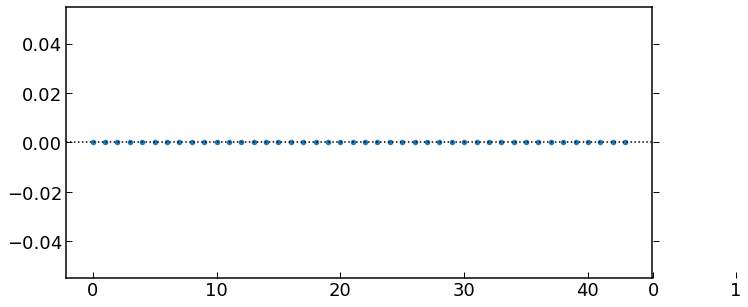

In [8]:
# xx_train = np.arange(dt['train'].shape[0])
xx_test = np.arange(dt['test'].shape[0])

dt_min = -2
dt_max = 3
alpha=0.5

dt_bins = np.linspace(dt_min, dt_max, 25)

nx=8
fig = plt.figure(figsize=(12,5))
gs = fig.add_gridspec(1,nx)
gs.update(wspace=0.02, hspace=0.02)

ax0 = fig.add_subplot(gs[:, 0:nx-1])
ax0_y = fig.add_subplot(gs[:, nx-1], sharey=ax0)


plt.setp(ax0_y.get_yticklabels(), visible=False)

# ax0_x.axis('off')
# ax0_y.axis('off')

for axi in ['left', 'bottom', 'right', 'top']:
    ax0_y.spines[axi].set_visible(False)

ax0.tick_params('both', length=6, width=1, which='major', color='k',direction='in')                                         
ax0.tick_params('both', length=3, width=1, which='minor', color='k',direction='in')

ax0_y.tick_params('both', length=6, width=1, which='major', color='k',direction='in')                                         
ax0_y.tick_params('both', length=3, width=1, which='minor', color='k',direction='in')

    
ax0.axhline(0, color='k', ls=':')

# ax0.scatter(xx_train, dt['train'], s=20, label='Train')
# ax0.errorbar(xx_train, dt['train'], yerr=dt_sig['train'], ls='none')

ax0.scatter(xx_test, dt['test'], s=20, label='Test')
ax0.errorbar(xx_test, dt['test'], yerr=dt_sig['test'], ls='none')

# ax0_y.hist(dt['train'], bins=dt_bins, orientation="horizontal", alpha=alpha, color='C0', density=True)
ax0_y.hist(dt['test'], bins=dt_bins, orientation="horizontal", alpha=alpha, color='C1', density=True)

ax0.set_ylabel('$\Delta$ time [days]')
ax0.set_xlabel('Supernovae ID')

# ax0.set_ylim(dt_min, dt_max)

ax0.legend(loc='upper right')

if savefig:
    plt.savefig(figdir+'deltatime_train_test_{:02d}Dlatent.pdf'.format(latent_dim), bbox_inches='tight')

Train mean : 0.079286, var : 0.513195
[-1.89441128e-01 -1.11381742e-02 -7.66871544e-01  1.96120441e+00
  1.54558802e-01  7.73107167e-03 -2.70418799e-01 -1.25045876e-01
 -5.83432568e-01 -8.76347942e-02  1.88508478e-01 -4.45507932e-01
  2.46345042e-01  5.90428419e-02  2.76172254e-01  2.19239341e-01
 -6.48071244e-01 -3.94190662e-01  7.98758864e-01  1.33054273e-03
 -1.38831092e-01  3.44114582e-02  1.95868127e-01  1.43086016e+00
  1.20013807e-02 -8.97403900e-01  2.62368727e-01 -5.83259575e-01
 -1.31106365e-01 -8.28355830e-01 -7.92857143e-02  2.83340254e-02
 -4.66942554e-01 -1.85471145e-01 -9.13739437e-02 -7.77564896e-01
 -4.79572173e-01  5.13067096e-01  1.12949843e+00 -2.41422635e+00
 -2.02576211e-01  3.84240504e-01 -4.21880046e-01 -1.91643205e-01]
Test mean : -0.079721, var : 0.660319


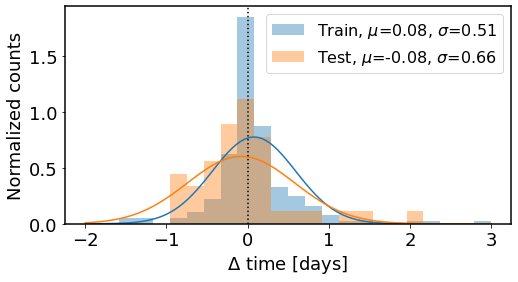

In [4]:
import sklearn.mixture
from scipy.stats import norm

alpha=0.4

gmm = sklearn.mixture.GaussianMixture()

r_train = gmm.fit(dt['train'][:, np.newaxis]) # GMM requires 2D data as of sklearn version 0.16
gmm_mean_train =  r_train.means_[0, 0]
gmm_std_train = np.sqrt(r_train.covariances_[0, 0])
print("Train mean : %f, var : %f" % (gmm_mean_train, gmm_std_train))

print(dt['test'])
r_test = gmm.fit(dt['test'][:, np.newaxis]) # GMM requires 2D data as of sklearn version 0.16
gmm_mean_test =  r_test.means_[0, 0]
gmm_std_test = np.sqrt(r_test.covariances_[0, 0])
print("Test mean : %f, var : %f" % (gmm_mean_test, gmm_std_test))

plt.figure(figsize=(8,4))

plt.hist(dt['train'], bins=dt_bins, alpha=alpha, color='C0', density=True, label='Train, $\mu$=%.2f, $\sigma$=%.2f'%(gmm_mean_train, gmm_std_train))
plt.hist(dt['test'], bins=dt_bins, alpha=alpha, color='C1', density=True, label='Test, $\mu$=%.2f, $\sigma$=%.2f'%(gmm_mean_test, gmm_std_test))

xx = np.linspace(dt_min, dt_max, 100)
plt.plot(xx, norm.pdf(xx, gmm_mean_train, gmm_std_train), color='C0')
plt.plot(xx, norm.pdf(xx, gmm_mean_test, gmm_std_test), color='C1')

plt.axvline(0, color='k', ls=':')

plt.xlabel('$\Delta$ time [days]')
plt.ylabel('Normalized counts')

plt.legend(loc='upper right')

if savefig:
    plt.savefig(figdir+'deltatime_train_test_hist_{:02d}Dlatent.pdf'.format(latent_dim), bbox_inches='tight')

In [9]:
# Corner plot of all variables
import seaborn as sns
import pandas as pd

# savefig=True
savefig=False

zs = np.concatenate([z_latent_ae['train'], z_latent_ae['test']])
us = np.concatenate([u_latent_ae['train'], u_latent_ae['test']])
rs = np.concatenate([redshifts['train'], redshifts['test']])
ss = np.concatenate([salts['train'], salts['test']])
labs = np.concatenate([ ['Training data']*z_latent_ae['train'].shape[0], ['Test data']*z_latent_ae['test'].shape[0]])

d = {}
for i in range(zs.shape[1]):    
    d['$z_{:d}$'.format(i)] = zs[:,i]
    
for i in range(us.shape[1]):    
    d['$u_{:d}$'.format(i)] = us[:,i]
    
for i in range(0, ss.shape[1]):
    d[salt_params_label[i]] = ss[:,i]

# np.savetxt('x0_vs_z.txt', np.c_[rs, ss[:,0]])

d['redshift'] = rs
d['Label']    = labs


df = pd.DataFrame(data=d)
# test sample is way off
ind_skip = 3
df = df.drop(index=176+ind_skip)

sns.pairplot(df, corner=True, hue='Label')

if savefig:
    plt.savefig(figdir+'train_test_corner_plot.pdf', bbox_inches='tight')



# # illustrate u and z
# d = {}
# d['$z_0$'] = zs[:,0]
# d['$z_1$'] = zs[:,2]

# d['Label']    = labs

# df = pd.DataFrame(data=d)
# sns.pairplot(df, corner=True, hue='Label')

# plt.savefig(figdir+'corner_plot_z.pdf', bbox_inches='tight')

# d = {}
# d['$u_0$'] = us[:,1]
# d['$u_1$'] = us[:,2]

# d['Label']    = labs

# df = pd.DataFrame(data=d)
# sns.pairplot(df, corner=True, hue='Label')

# plt.savefig(figdir+'corner_plot_u.pdf', bbox_inches='tight')

NameError: name 'z_latent_ae' is not defined

In [40]:
import matplotlib.colors as colors

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

def plt_predictions_side_by_side(wavelengths, x_true, x_pred, x_salt, sigma, times, times_unscaled, dtime, red, n_spectra, title='Training', ispec=0, savefig=False, tstr='train', fhead='postMAP'):
    dm = x_true[:,0] != -1.

#                 labo = 'Observed spectra'
#                 labs = 'Encoder'
#                 labp = 'MAP'
    x_truei = x_true.copy()
    x_predi = x_pred.copy() 
    x_salti = x_salt.copy()

    sigmai  =  sigma.copy()
    timesi  =  times_unscaled.copy()

    cmap = cm.coolwarm
    colors = cmap(np.linspace(0,1,len(x_truei)))

    lwt = 2
    lw  = 2
    
    c0  = 'orangered'
    c1  = 'C0'
    
    cmap0 = truncate_colormap(cm.viridis, 0., 1.0)
    cmap1 = truncate_colormap(cm.viridis, 0., 1.0)

    wave_txt = wavelengths[-1]+100

    alpha=0.8
    alphat = 0.4
    
    nrow = 3
    ncol = 2
    
    fig, ax = plt.subplots(nrows=nrow, ncols=ncol, sharex=True, figsize=(20,6), gridspec_kw={'height_ratios': [3, 1, 1]})
    plt.subplots_adjust(wspace=0.025, hspace=0.075)
    
    # Make dummie mappable
    xx = np.linspace(-10, 40, 100)
    dummie_cax = ax[0,0].scatter(xx, xx, c=xx, cmap=cmap0)
    # Clear axis
    ax[0, 0].cla()
    
    for axi in ax:
        for axj in axi:
            for axis in ['top','bottom','left','right']:
                axj.spines[axis].set_linewidth(1.)
  
            axj.tick_params('both', length=6, width=1., which='major', color='k',direction='in')                                         
            axj.tick_params('both', length=3, width=1., which='minor', color='k',direction='in')
        
        
    ymax = 0
    for i in range(n_spectra):
        labp = None
        labs = None
        labo = None
        ls= '-'

        if i==0:
            labo = 'Observed spectra'
            if fhead=='preMAP':
                labs = 'SALT2'
                labp = 'Encoder'

            if fhead=='postMAP':
                labs = 'Encoder'
                labp = 'MAP'
                    
        xti = x_truei[i]
        xpi = x_predi[i]
        xsi = x_salti[i]

        for j in range(ncol):
            ax[0,j].plot(wavelengths, xti, '-', c='k', lw=lwt, alpha=alphat, label=labo)#colors[i])
            ax[0,j].fill_between(wavelengths, xti-sigmai[i],  xti+sigmai[i], color='gray', alpha=alphat, lw=1)
    
        im = ax[0,0].plot(wavelengths, xsi, '-', c=cmap0(times[i, 0]), lw=lw, alpha=alpha, label=labs)
        ax[0,1].plot(wavelengths, xpi, ls=ls, c=cmap1(times[i, 0]), lw=lw, alpha=alpha, label=labp)

        if i==0: 
            for j in range(ncol):
                ax[1,j].plot(wavelengths, wavelengths*0, '-', c='k', lw=lwt, alpha=0.8, label=labo)#colors[i])

        ax[1,0].plot(wavelengths, xsi - xti, '-', c=cmap0(times[i, 0]), lw=lw, alpha=alpha, label=labs)
        ax[1,1].plot(wavelengths, xpi - xti, ls=ls, c=cmap1(times[i, 0]), lw=lw, alpha=alpha, label=labp)


        if i==0: 
            for j in range(ncol):
                ax[2,j].plot(wavelengths, wavelengths*0, '-', c='k', lw=lwt, alpha=0.8, label=labo)#colors[i])

        ax[2,0].plot(wavelengths, (xsi - xti)/sigmai[i], '-', c=cmap0(times[i, 0]), lw=lw, alpha=alpha, label=labs)
        ax[2,1].plot(wavelengths, (xpi - xti)/sigmai[i], ls=ls, c=cmap1(times[i, 0]), lw=lw, alpha=alpha, label=labp)
        
        
        ymax = max(ymax, xti.max(), xsi.max(), xpi.max())#1.4
        
    yminmax_resid = 0.09
    yminmax_pull = 9

    for j in range(ncol):
        ax[0,j].set_ylim(0, ymax)
        ax[1,j].set_ylim(-yminmax_resid, yminmax_resid)
        ax[2,j].set_ylim(-yminmax_pull, yminmax_pull)

#         ax[0,j].legend(loc='upper right')

    for i in range(nrow):
        for j in range(ncol):
            ax[i,j].set_xlim(wavelengths[0], wavelengths[-1])
            
            ax[i,j].grid()

#             ax2.set_ylim(0, ymax)

#         if plttype == 'residual':   
#             yminmax = 0.3
#             ax1.set_ylim(-yminmax, yminmax)

    ax[0,0].set_ylabel('Restframe Flux')
#         ax[1,0].text(0.95, 0.95, '$F - \hat{F}$', transform = ax[1,0].transAxes)
    ax[1,0].set_ylabel('Residual')
    ax[2,0].set_ylabel('Pull')

    # turn off ylabels on right plots
    
    for i in range(nrow):
        ax[i,1].set_yticklabels([])
        
    for i in range(ncol):
        ax[2,i].set_xlabel('Wavelength [$\AA$]')

    labo = 'Observed spectra'
    if fhead=='preMAP':
        labs = 'SALT2'
        labp = 'Encoder'

    if fhead=='postMAP':
        labs = 'Encoder'
        labp = 'MAP'
    ax[0,0].set_title(labs)
    ax[0,1].set_title(labp)

    cax = fig.add_axes([0.92, 0.2, 0.01, 0.6])

    fig.colorbar(dummie_cax, cax=cax, label='Days from max light')

    
    if savefig: 
        fname = 'spectra/sidebyside_spectra_{:s}_{:s}{:03d}_{:s}_{:02d}Dlatent'.format(fhead, tstr, ispec, plttype, latent_dim)
        plt.savefig(figdir+fname+'.pdf', bbox_inches='tight')
#
#           
#             ymax = 1.4
#             ax1.set_ylim(0, ymax)
#             ax2.set_ylim(0, ymax)

#         if plttype == 'residual':   
#             yminmax = 0.3
#             ax1.set_ylim(-yminmax, yminmax)
#             ax2.set_ylim(-yminmax, yminmax)

#         if plttype == 'pull':        
#             ax1.set_ylim(ymin-0.1, ymax+0.1)

 
# #         ax1.set_frame_on(False)
# #         ax1.get_xaxis().tick_bottom()
# #         ax1.axes.get_yaxis().set_visible(False)
# #         xmin, xmax = ax1.get_xaxis().get_view_interval()
# #         ymin, ymax = ax1.get_yaxis().get_view_interval()
# #         ax1.add_artist(plt.Line2D((xmin, xmax), (ymin, ymin), color='black', linewidth=2))

#         ax1.legend(loc='upper right', frameon=False, ncol=3)
#         ax2.legend(loc='upper right', frameon=False, ncol=3)


#         ax1.set_xlim(wavelengths[0], wavelengths[-1])
#         ax2.set_xlim(wavelengths[0], wavelengths[-1])

    

Redshift of sample(s) =  0.017789
number of spectra in sample(s) =  10


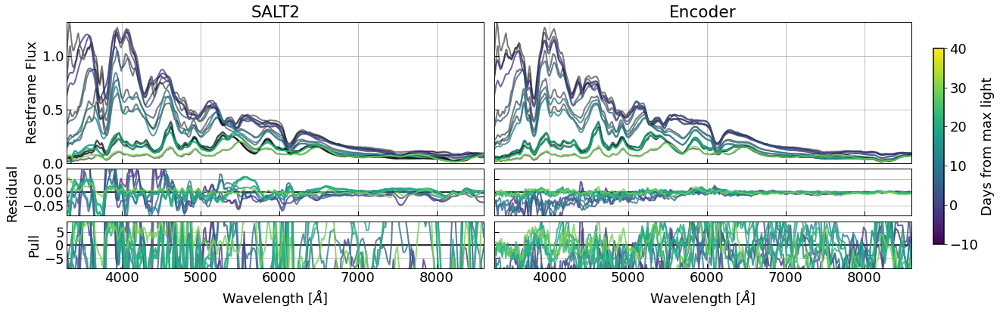

In [19]:
# Plot spectra
savefig = False
# savefig = True

tstr = 'test'
# tstr = 'train'

nplt = 1

for iplt in range(nplt):

    n_timesamples = spectra[tstr].shape[1]
    n_spectra = np.shape(np.where(spectra[tstr][iplt, :, 0] > -1))[1] # number of spectra that exist in observation

    data_dim      = spectra[tstr].shape[2]

    print('Redshift of sample(s) = ', redshifts[tstr][iplt])
    print('number of spectra in sample(s) = ', n_spectra)

    plt_predictions_side_by_side(wavelengths, spectra[tstr][iplt], spectra_ae[tstr][iplt], spectra_salt[tstr][iplt], 
            sigma[tstr][iplt], times[tstr][iplt], times_orig[tstr][iplt], dt[tstr][iplt], redshifts[tstr][iplt], n_spectra, title=tstr, ispec=iplt, savefig=savefig, tstr=tstr, fhead='preMAP')

#     plt_predictions_side_by_side(wavelengths, spectra[tstr][iplt], spectra_map[tstr][iplt], spectra_ae[tstr][iplt], 
#             sigma[tstr][iplt], times[tstr][iplt], times_orig[tstr][iplt], dt[tstr][iplt], redshifts[tstr][iplt], n_spectra, title=tstr, ispec=iplt, savefig=savefig, tstr=tstr, fhead='postMAP')


# Look at outliers

In [10]:
# Load data
spectra = {}
spectra_salt = {}
sigma = {}
mask = {}
times = {}
times_orig = {}
salts = {}
redshifts = {}
labels = {}
salt_params = {}
luminosity_distance = {}

spectra_ae = {}
spectra_map = {}

u_latent_ae = {}
z_latent_ae = {}
u_latent_map = {}
z_latent_map = {}

lp_u_latent_ae = {}
lp_z_latent_ae = {}
lJ_u_latent_ae = {}
lp_u_latent_map = {}
lp_z_latent_map = {}
lJ_u_latent_map = {}

loss_ae = {}
loss_map = {}
dt = {}
cov = {}
dt_sig = {}

labels_all = np.array([])
logp_all = np.array([])
redshifts_all = np.array([])
ind_fold = np.array([])

latent_dim = 4
for kfold in range(0, 1):
    for tstr in ['train', 'test']:
#     for tstr in ['test']:

        # spectra data
#         df = np.load('../data/{:s}_data.npz'.format(tstr))

        df = np.load('../data/{:s}_data_kfold{:d}.npz'.format(tstr, kfold))

        wavelengths       = df['wavelengths']
        salt_params[tstr] = df['salt_params']
        salt_params_label = df['salt_params_label']

        spectra[tstr]      = df['spectra']
        spectra_salt[tstr] = df['spectra_salt']
        sigma[tstr]        = df['sigma']

        mask[tstr]         = df['mask']    
        times[tstr]        = df['times']
        times_orig[tstr]   = df['times_orig']
        salts[tstr]        = df['salts']
        redshifts[tstr]    = df['redshifts']
        labels[tstr]       = df['labels']

        luminosity_distance[tstr] = df['luminosity_distance']

        labels_all = np.concatenate((labels_all, labels[tstr]))
        redshifts_all = np.concatenate((redshifts_all, redshifts[tstr]))
        ind_fold = np.concatenate((ind_fold, redshifts[tstr]*0+kfold))
        # post map
        
#         df = np.load('../data/{:s}_data_{:02d}Dlatent_MAP.npz'.format(tstr, latent_dim))
        df = np.load('../data/{:s}_data_{:02d}Dlatent_MAP_kfold{:01d}.npz'.format(tstr, latent_dim, kfold))

        print(df.files)

        spectra_map[tstr] = df['spectra_map']
        spectra_ae[tstr]  = df['spectra_ae']

        u_latent_ae[tstr] = df['u_latent_ae']
        z_latent_ae[tstr] = df['z_latent_ae']
        u_latent_map[tstr] = df['u_latent_map']
        z_latent_map[tstr] = df['z_latent_map']

        lp_u_latent_ae[tstr] = df['lp_u_latent_ae']
        lp_z_latent_ae[tstr] = df['lp_z_latent_ae']
        lJ_u_latent_ae[tstr] = df['lJ_u_latent_ae']
        lp_u_latent_map[tstr] = df['lp_u_latent_map']
        lp_z_latent_map[tstr] = df['lp_z_latent_map']
        lJ_u_latent_map[tstr] = df['lJ_u_latent_map']

        logp_all = np.concatenate((logp_all, lp_z_latent_map[tstr]))
        
        loss_ae[tstr]  = df['loss_ae']
        loss_map[tstr] = df['loss_map']

        dt[tstr]  = df['dtime']*50
        cov[tstr] = df['covariance']
        dt_sig[tstr] = np.sqrt(cov[tstr][:, -1, -1])*50
        dt[tstr][np.isnan(dt[tstr])] = 0

cond_dim     = 1 # time
n_timestep   = spectra['test'].shape[1]
n_wavelength = spectra['test'].shape[2]

# spectra_map = spectra_ae

['spectra_ae', 'spectra_map', 'u_latent_ae', 'z_latent_ae', 'u_latent_map', 'z_latent_map', 'lp_z_latent_ae', 'lp_u_latent_ae', 'lJ_u_latent_ae', 'lp_z_latent_map', 'lp_u_latent_map', 'lJ_u_latent_map', 'loss_ae', 'loss_map', 'nspectra', 'redshift', 'dtime', 'amplitude', 'covariance']
['spectra_ae', 'spectra_map', 'u_latent_ae', 'z_latent_ae', 'u_latent_map', 'z_latent_map', 'lp_z_latent_ae', 'lp_u_latent_ae', 'lJ_u_latent_ae', 'lp_z_latent_map', 'lp_u_latent_map', 'lJ_u_latent_map', 'loss_ae', 'loss_map', 'nspectra', 'redshift', 'dtime', 'amplitude', 'covariance']


In [11]:
logp_all

array([   3.84205055,    4.66819668,    5.18211269,    3.54554605,
          3.76348114,    4.54612923,    3.42430878,    2.76334572,
          5.228549  ,    0.86874485,    5.11891747,    4.97002268,
          5.65278912,    3.85600376,    4.87554741,    4.53808022,
          3.2555232 ,    3.85792637,    4.53231525,    5.48854637,
          5.6750536 ,    2.81721115,    4.9095583 ,    5.00160694,
          5.59387207,    5.03575039,    5.88087082,    5.81903315,
          4.49562359,    4.37590027,    5.16969204,    3.97889042,
          5.01056767,    5.46367931,    4.94475174,    0.85302544,
          6.04306221,    4.45438337,    3.71097469,    5.87497187,
          3.56369066,    5.92403507,    5.08150291,    4.80214214,
          5.17367268,    3.92888117,    5.93723774,    5.11760759,
          4.87041759,    4.79482746,    5.27061987,    5.10574007,
          4.06127834,    5.09043217,    3.60333157,    3.91930771,
          4.65975571,    4.5488162 ,    5.36253738,    4.11616

[-213.97348022  -39.68650055  -14.37540054  -10.5338068    -8.32854176
   -7.0257473    -6.58938599   -2.99702072   -2.5506649    -1.0454073 ]
['SNF20080720-001' 'SNF20080717-000' 'SNF20080918-000' 'SNF20080825-010'
 'SNPGC027923' 'PTF12evo' 'LSQ12gdj' 'SN2010ex' 'PTF10yux' 'SNNGC0927']
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[       nan 6.04306221 6.03551674 5.94835567 5.93723774 5.92403507
 5.89475012 5.88131714 5.88087082 5.87497187]
['SN2006X' 'SNF20080531-000' 'SN2005cg' 'SNF20070817-003' 'LSQ12hjm'
 'CSS120424_01' 'SNF20080512-010' 'SNF20061020-000' 'SNF20080815-017'
 'SNF20071003-004']
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


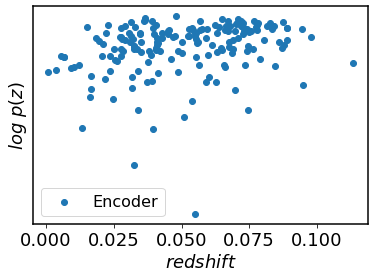

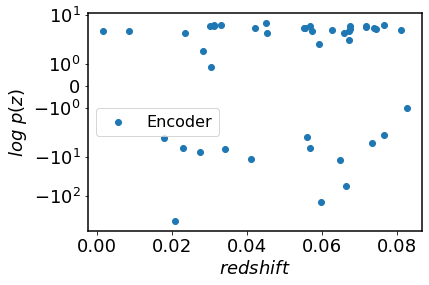

In [12]:
import numpy as np
# ind_min_pz = {}

# outliers ['SNF20060526-003' 'SNF20080920-000' 'LSQ12dbr' 'SNNGC4424' 'SN2006X' 'PTF10icb' 'LSQ13aiz' 'PTF10hmv' 'PTF11mkx' 'SN2007kk']
# [1. 4. 4. 0. 0. 0. 4. 1. 1. 4.]

# non outlier = ['SNF20061022-014' 'SN2005bc' 'SN2012cu' 'SNF20080620-000' 'SNF20070630-006' 'PTF09dlc' 'PTF12ikt' 'SNF20070712-000' 'LSQ12ekl' 'SNF20080510-001']
savefig = False
# savefig = True

inds = np.argsort(logp_all)
nprint = 10
print(logp_all[inds][:nprint])
print(labels_all[inds][:nprint])
print(ind_fold[inds][:nprint])

inds = np.argsort(logp_all)[::-1]
print(logp_all[inds][:nprint])
print(labels_all[inds][:nprint])
print(ind_fold[inds][:nprint])

for tstr in ['train', 'test']:
# for tstr in ['test']:

    plt.figure()
    plt.scatter(redshifts[tstr], lp_z_latent_ae[tstr], label='Encoder')
#     plt.scatter(redshifts_all, logp_all, c=ind_fold)

    plt.xlabel('$redshift$')
    plt.ylabel('$log\ p(z)$')
    
    plt.legend()
    plt.yscale('symlog')

#     plt.ylim(-10,10)
    if savefig:
        plt.savefig(figdir+'probability_vs_redshift_{:s}_{:02d}Dlatent.pdf'.format(tstr, latent_dim), bbox_inches='tight')



0 135 PTF11mkx
i, log p(z) 0 1.0943984985351562
Redshift of sample(s) =  0.054823
number of spectra in sample(s) =  17
1 9 PTF11bju
i, log p(z) 1 1.5413036346435547
Redshift of sample(s) =  0.032261
number of spectra in sample(s) =  13
2 115 SNF20060609-002
i, log p(z) 2 1.862137794494629
Redshift of sample(s) =  0.03959
number of spectra in sample(s) =  14
0 3 SN2006X
i, log p(z) 0 -inf
Redshift of sample(s) =  0.00524
number of spectra in sample(s) =  4
1 23 SNF20080720-001
i, log p(z) 1 -438.15240478515625
Redshift of sample(s) =  0.02075
number of spectra in sample(s) =  13


<ipython-input-9-537201e570fd>:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ((ax1 )) = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(12,10))#, gridspec_kw={'height_ratios': [3, 1]})
<ipython-input-9-537201e570fd>:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ((ax1 )) = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(12,10))#, gridspec_kw={'height_ratios': [3, 1]})
<ipython-input-9-537201e570fd>:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pypl

2 33 SNF20080717-000
i, log p(z) 2 -142.83912658691406
Redshift of sample(s) =  0.05985
number of spectra in sample(s) =  13


<ipython-input-9-537201e570fd>:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ((ax1 )) = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(12,10))#, gridspec_kw={'height_ratios': [3, 1]})
<ipython-input-9-537201e570fd>:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ((ax1 )) = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(12,10))#, gridspec_kw={'height_ratios': [3, 1]})
<ipython-input-9-537201e570fd>:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pypl

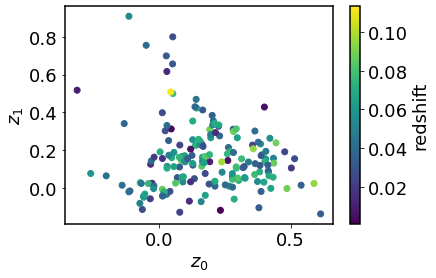

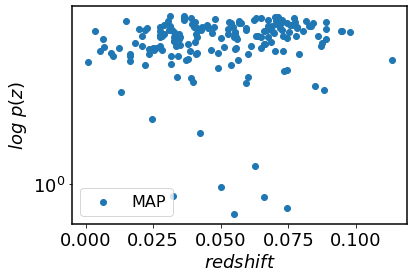

findfont: Font family ['lmodern'] not found. Falling back to DejaVu Sans.


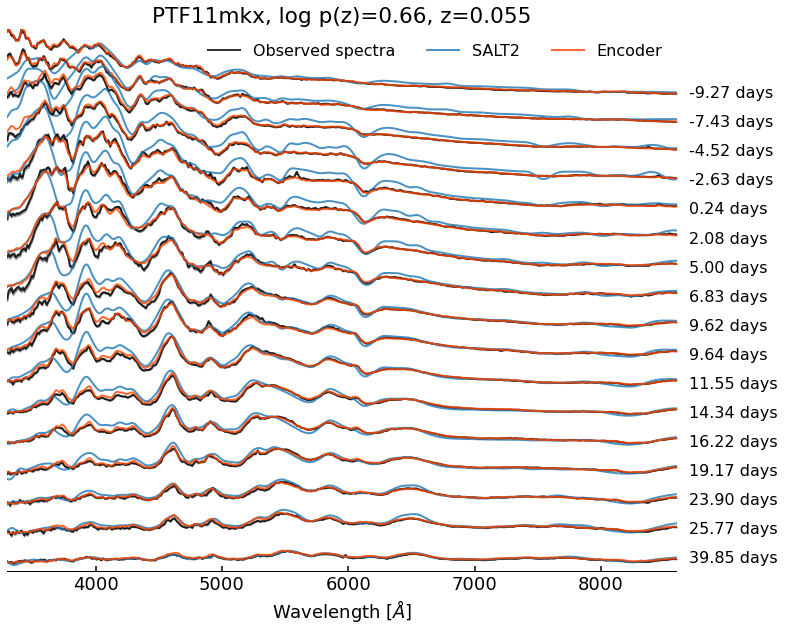

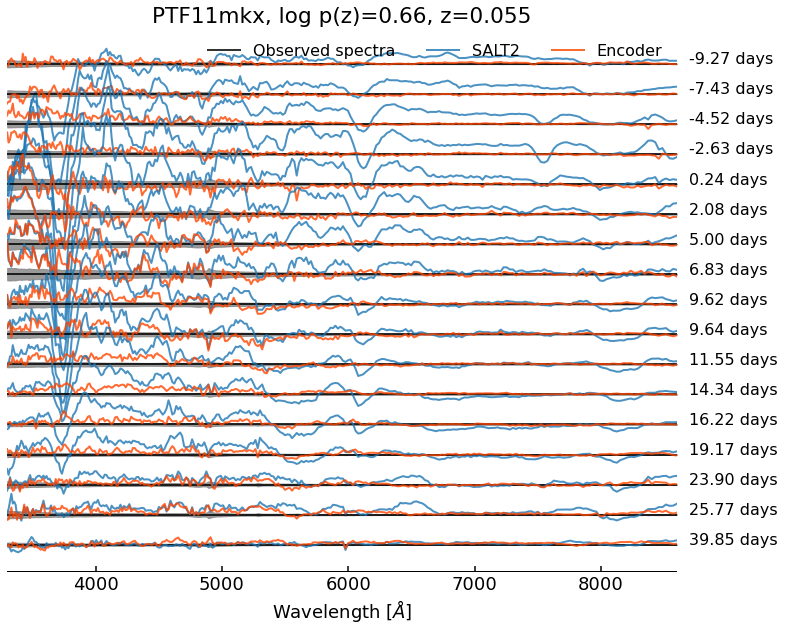

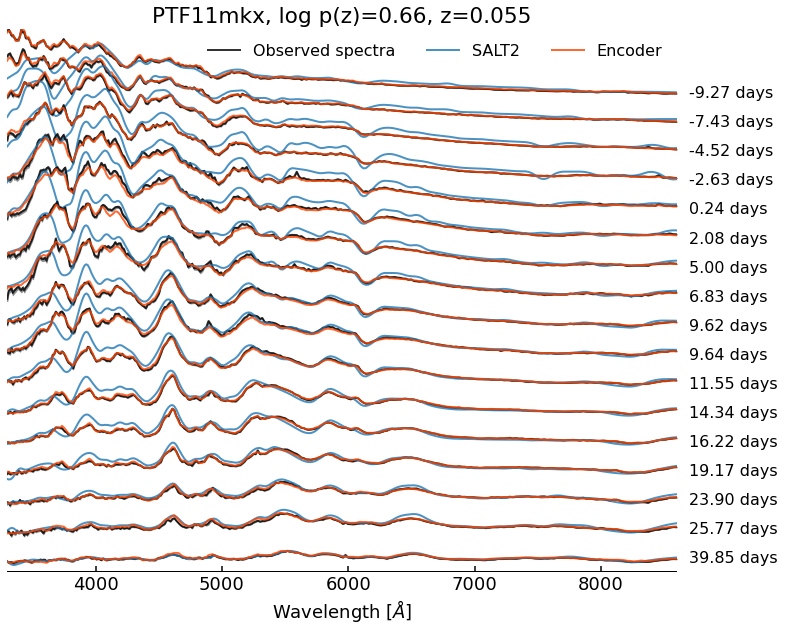

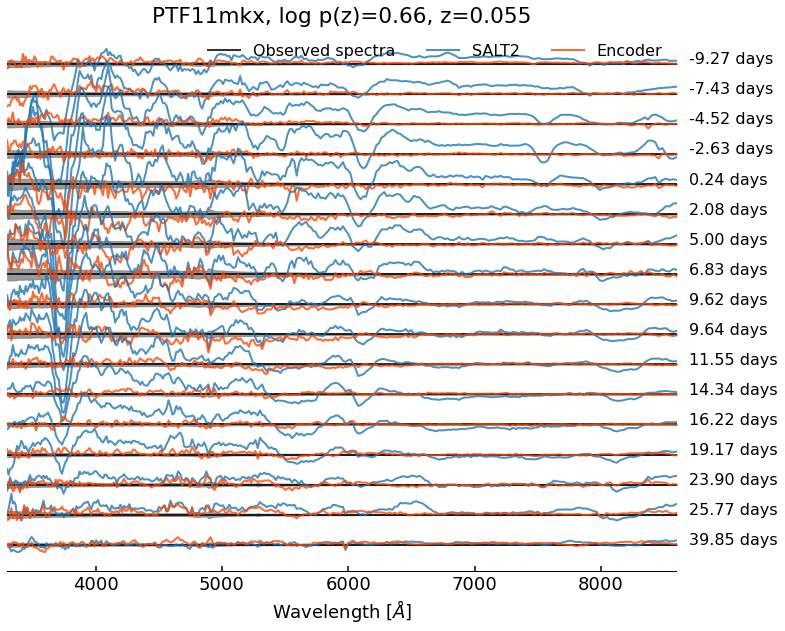

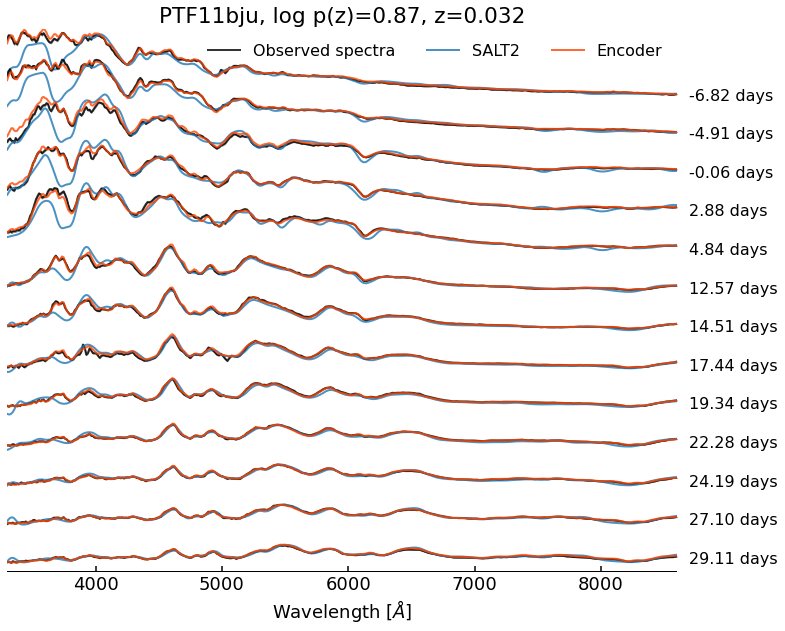

...

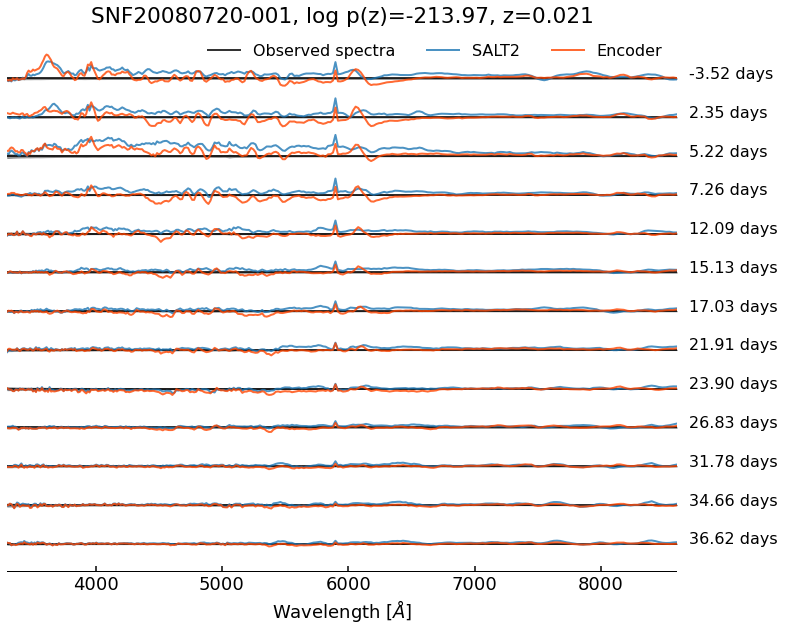

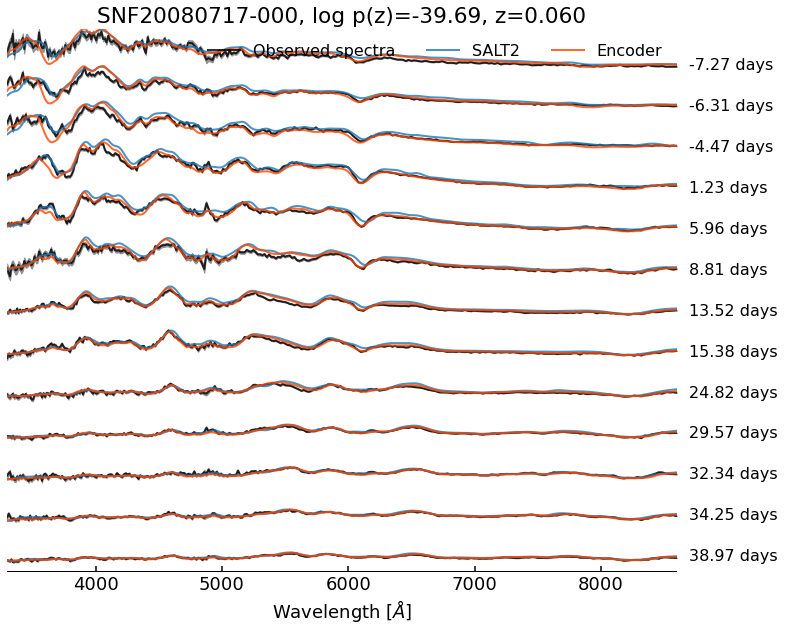

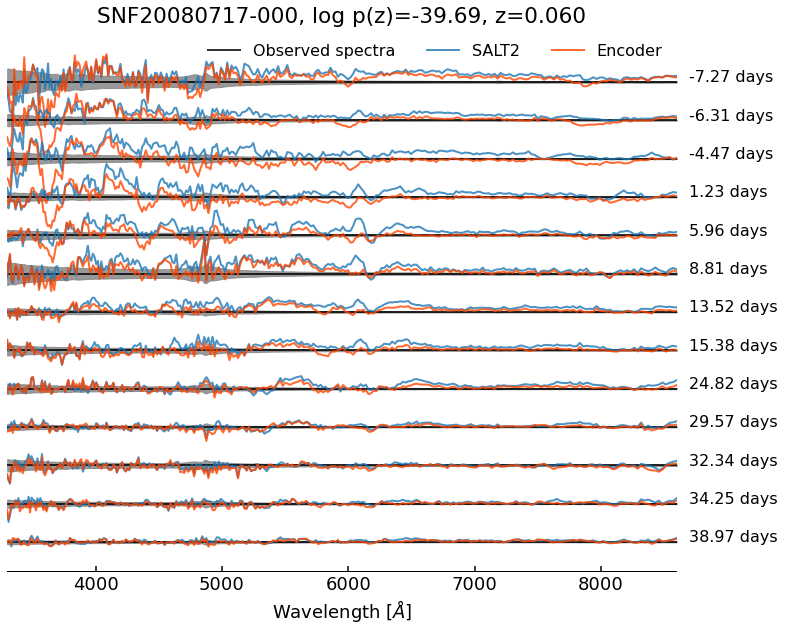

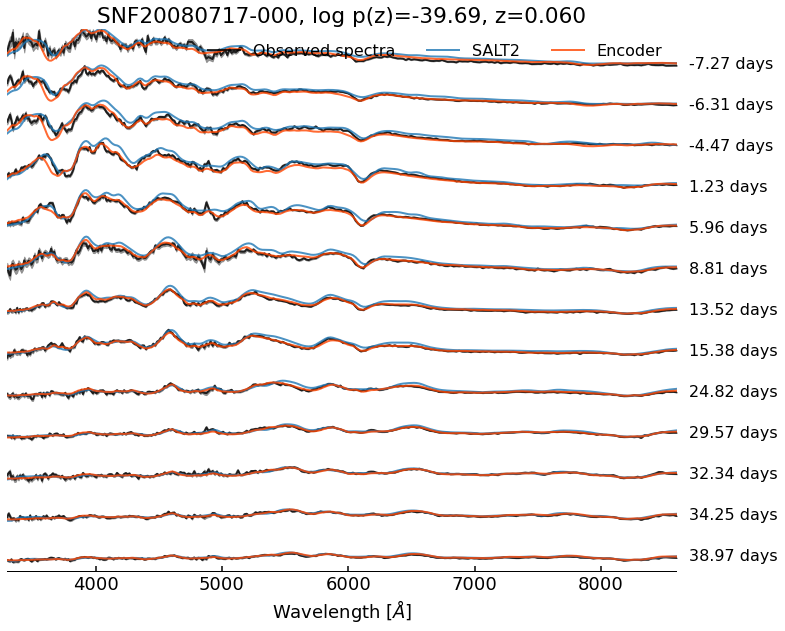

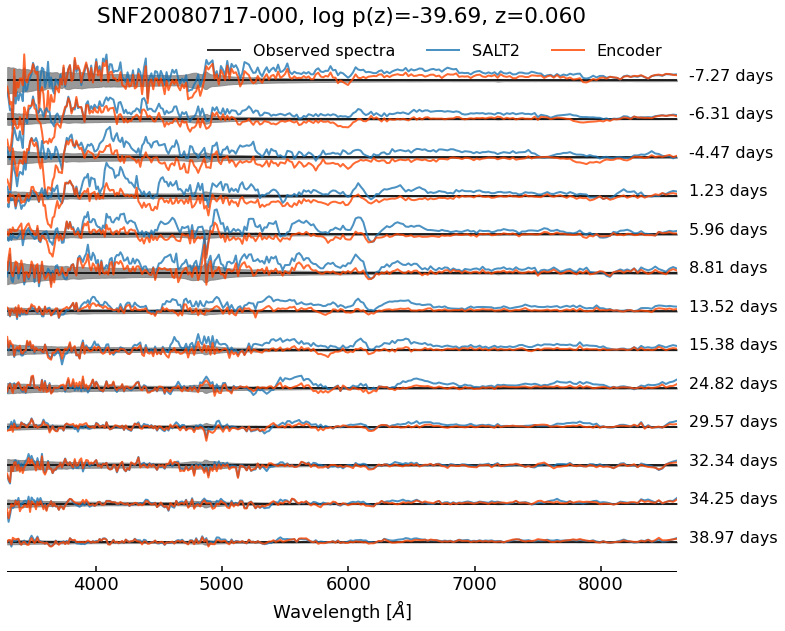

In [13]:
ind_min_pz = {}

savefig = False
# savefig = True

for tstr in ['train', 'test']:
# for tstr in ['test']:

    plt.figure()
    plt.scatter(z_latent_ae[tstr][:,0], z_latent_ae[tstr][:,1], c=redshifts[tstr])
    plt.colorbar(label='redshift')
    plt.xlabel('$z_0$')
    plt.ylabel('$z_1$')

    plt.figure()
#     plt.scatter(redshifts[tstr], lp_z_latent_ae[tstr], label='Encoder')
    plt.scatter(redshifts[tstr], lp_z_latent_map[tstr], label='MAP')

    plt.xlabel('$redshift$')
    plt.ylabel('$log\ p(z)$')
    
    plt.legend()
    plt.yscale('symlog')
#     if savefig:
#         plt.savefig(figdir+'probability_vs_redshift_{:s}_{:02d}Dlatent.pdf'.format(tstr, latent_dim), bbox_inches='tight')
    
    
    ind_min_pz[tstr] = np.argsort(lp_z_latent_ae[tstr]) #[::-1]
    
#     print(ind_min_pz[tstr])
#     print(labels[tstr][ind_min_pz[tstr]])
    
    nplt = 3
    
    for iplt, snplt in enumerate(ind_min_pz[tstr][:nplt]):
        title = labels[tstr][snplt]+', log p(z)={:.2f}'.format(lp_z_latent_map[tstr][snplt])
        print(iplt, snplt, labels[tstr][snplt])
        print('i, log p(z)', iplt, lp_z_latent_ae[tstr][snplt])
        
        n_timesamples = spectra[tstr].shape[1]
        n_spectra = np.shape(np.where(spectra[tstr][snplt, :, 0] > -1))[1] # number of spectra that exist in observation

        data_dim      = spectra[tstr].shape[2]

        print('Redshift of sample(s) = ', redshifts[tstr][snplt])
        print('number of spectra in sample(s) = ', n_spectra)

#         plt_predictions_offset(wavelengths, spectra[tstr][iplt], spectra_map[tstr][iplt], spectra_salt[tstr][iplt], 
#                 sigma[tstr][iplt], times[tstr][iplt], times_orig[tstr][iplt], dt[tstr][iplt], redshifts[tstr][iplt], n_spectra, title=tstr, ispec=iplt, savefig=savefig, train=False)
# def plt_predictions_offset(wavelengths, x_true, x_pred, x_salt, sigma, times, times_unscaled, dtime, red, n_spectra, title='Training', ispec=0, savefig=False, tstr='train', fhead='postMAP'):
#     dm = x_true[:,0] != -1.

        plt_predictions_offset(wavelengths, spectra[tstr][snplt], spectra_ae[tstr][snplt], spectra_salt[tstr][snplt], 
                sigma[tstr][snplt], times[tstr][snplt], times_orig[tstr][snplt], dt[tstr][snplt], redshifts[tstr][snplt], n_spectra, title=title, ispec=iplt, savefig=savefig, tstr=tstr, fhead='preMAP')

        plt_predictions_offset(wavelengths, spectra[tstr][snplt], spectra_map[tstr][snplt], spectra_salt[tstr][snplt], 
                sigma[tstr][snplt], times[tstr][snplt], times_orig[tstr][snplt], dt[tstr][snplt], redshifts[tstr][snplt], n_spectra, title=title, ispec=iplt, savefig=savefig, tstr=tstr, fhead='preMAP')


In [42]:
# RMSe
# savefig=True
savefig=False

def RMSe(spec_true, spec_pred, sigma, weighted=False, outlier_cut=95):
  
    dm = spec_true != -1.
    
    s0 = spec_true[dm].copy()
    s1 = spec_pred[dm].copy()
    sig = sigma[dm].copy()

    s0 = np.reshape(s0, (-1, 288))
    s1 = np.reshape(s1, (-1, 288))
    sig = np.reshape(sig, (-1, 288))

    mse = (s0 - s1)**2
    
    print(mse.min(), mse.max())
    print(sig.min(), sig.max())

    if weighted:
        mse /= sig**2

    # sometimes there are huge outliers,
    # so set errors larger than some percentile to the value corresponding to that percentile
    maxval = np.percentile(mse, outlier_cut, axis=0)

    maxval_tile = np.tile(maxval, (mse.shape[0], 1))
#         msei[np.greater(msei, maxval)] = maxval_tile
    indgt = np.greater(mse, maxval)
    
    mask = np.ones(mse.shape)
    mask[indgt] = 0. #maxval_tile[indgt]

    print(s0.shape, mask.shape)

    mean_flux = np.mean(s0, axis=0)
    rmse = np.sqrt(np.sum(mse*mask, axis=0)/np.sum(mask, axis=0))/mean_flux

    return rmse


csalt = 'k'
cae = 'C0' 
cmap = 'orangered'    

lw  = 2
weighted_list = [True, False]

abs_lab = ['Si II', 'FE', 'Si II', 'Si II', 'O I', 'Si II', 'Si II']
zref = 0.05
abs_wavelength = np.array([4131., 4800., 5972, 6355, 7773, 5454, 5640])#/(1+zref)
dxtxt = 5

outlier_cut = 98

ind_outlier_test = 3
inds_keep = np.arange(sigma['test'].shape[0])
inds_keep = np.concatenate((inds_keep[:ind_outlier_test], inds_keep[ind_outlier_test+1:]))
print('DEBUG', inds_keep, spectra['test'][inds_keep].shape)
for weighted in weighted_list:

    rms_p_salt_train = RMSe(spectra['train'], spectra_salt['train'], sigma['train'], weighted=weighted, outlier_cut=outlier_cut)
    rms_p_salt_test  = RMSe(spectra['test'][inds_keep], spectra_salt['test'][inds_keep], sigma['test'][inds_keep], weighted=weighted, outlier_cut=outlier_cut)
    
    rms_p_ae_train = RMSe(spectra['train'], spectra_ae['train'], sigma['train'], weighted=weighted, outlier_cut=outlier_cut)
    rms_p_ae_test  = RMSe(spectra['test'][inds_keep], spectra_ae['test'][inds_keep], sigma['test'][inds_keep], weighted=weighted, outlier_cut=outlier_cut)
    
    rms_p_map_train = RMSe(spectra['train'], spectra_map['train'], sigma['train'], weighted=weighted, outlier_cut=outlier_cut)
    rms_p_map_test  = RMSe(spectra['test'][inds_keep], spectra_map['test'][inds_keep], sigma['test'][inds_keep], weighted=weighted, outlier_cut=outlier_cut)

    rms_noise_train = RMSe(sigma['train'], sigma['train']*0, sigma['train']*1, weighted=weighted, outlier_cut=outlier_cut)
    rms_noise_test  = RMSe(sigma['test'][inds_keep] , sigma['test'][inds_keep] *0, sigma['test'][inds_keep]*1, weighted=weighted, outlier_cut=outlier_cut)

    print(rms_p_map_test)
    
    plt.figure(figsize=(12,5))
#     plt.plot(wavelengths, rms_noise_train, 'k', lw=lw-1, label='Observation noise')
#     plt.plot(wavelengths, rms_noise_test, '--k', lw=lw-1)

    plt.plot(wavelengths, rms_p_salt_train, '-', c=csalt, lw=lw, label="SALT2")
    plt.plot(wavelengths, rms_p_salt_test, '--', c=csalt, lw=lw)
    
    plt.plot(wavelengths, rms_p_ae_train, '-', c=cae, lw=lw, label="Encoder")
    plt.plot(wavelengths, rms_p_ae_test, '--', c=cae, lw=lw)
    
    plt.plot(wavelengths, rms_p_map_train, '-', c=cmap, lw=lw, label="MAP")
    plt.plot(wavelengths, rms_p_map_test, '--', c=cmap, lw=lw)

    plt.yscale('linear')
    # plt.yscale('log')
    plt.legend(ncol=1, fontsize=14)
    if weighted:
        plt.ylabel('weighted RMSe')
    else:
        plt.ylabel('Normalized RMS residual')
        plt.ylim(0, 0.4)
        
    plt.xlabel('Wavelength [$\AA$]')
    plt.grid()

    # add line labels
    for w, l in zip(abs_wavelength, abs_lab):
        plt.axvline(w, c='gray', ls=':')
        ymax = rms_p_ae_test.max()
        plt.text(w-dxtxt,  ymax, '{:s} $\lambda${:.0f}'.format(l,w), ha='right', va='top', rotation=90, color='gray', fontsize=14)

    if savefig: 
        fname = 'rmse_ae_map'
        if weighted: fname += '_weighted'
        plt.savefig(figdir+fname+'_{:02d}Dlatent.pdf'.format(latent_dim), bbox_inches='tight')

    plt.figure(figsize=(12,5))

#     plt.plot(wavelengths, rms_noise_train/rms_s, 'k', lw=lw-1, label='Observation noise')
#     plt.plot(wavelengths, rms_noise_test/rms_s, '--k',  lw=lw-1)

    plt.plot(wavelengths, rms_p_ae_train/rms_p_salt_train, '-', lw=lw, c=cae, label="AE")
    plt.plot(wavelengths, rms_p_ae_test/rms_p_salt_test, '--', lw=lw, c=cae)

    plt.plot(wavelengths, rms_p_map_train/rms_p_salt_train, '-', lw=lw, c=cmap, label='MAP')
    plt.plot(wavelengths, rms_p_map_test/rms_p_salt_test, '--', lw=lw, c=cmap, label="Testing")

    plt.axhline(1., lw=lw, color=csalt)
    plt.yscale('linear')
    # plt.yscale('log')

    plt.legend(ncol=1, fontsize=14)
    if weighted:
        plt.ylabel('weighted RMSe / weighted RMSe$_{SALT2}$')
    else:
        plt.ylabel('RMSe / RMSe$_{SALT2}$')
    plt.xlabel('Wavelength [$\AA$]')
    plt.grid()

    # add line labels
    for w, l in zip(abs_wavelength, abs_lab):
        plt.axvline(w, c='gray', ls=':')
        ymax = 1
        plt.text(w-dxtxt,  ymax, '{:s} $\lambda${:.0f}'.format(l,w), ha='right', va='top', rotation=90, color='gray', fontsize=14)

#     plt.ylim(0.2, 1.02)
    if savefig: 
        fname = 'rmse_ratio_ae_map'
        if weighted: fname += '_weighted'
        plt.savefig(figdir + fname + '_{:02d}Dlatent.pdf'.format(latent_dim), bbox_inches='tight')


DEBUG [ 0  1  2  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43] (43, 24, 288)
2.220446e-16 4.022616
1.6977116e-05 0.39049232
(2143, 288) (2143, 288)
0.0 1.1263226
1.5125555e-05 0.18922547
(549, 288) (549, 288)
3.469447e-16 4.071091
1.6977116e-05 0.39049232
(2143, 288) (2143, 288)
2.4480418e-14 1.1260974
1.5125555e-05 0.18922547
(549, 288) (549, 288)


KeyError: 'train'

# RMSE vs time bin

In [58]:
from scipy import stats
from scipy import interpolate

savefig = False
# savefig = True

def RMSe_time(spec_true, spec_pred, sigma, time, weighted=False, outlier_cut=98):
  
    dm = spec_true != -1.

    ntbins = 11
    t_bin_edge = np.linspace(0, 1, ntbins+1)
    t_bin_cent = (t_bin_edge[:-1] + t_bin_edge[1:])/2

    s0 = spec_true[dm].copy()
    s1 = spec_pred[dm].copy()  
    sig = sigma[dm].copy()

    t   = time[dm[:,:,0]][:,0]
    
    s0 = np.reshape(s0, (-1, 288))
    s1 = np.reshape(s1, (-1, 288))
    sig = np.reshape(sig, (-1, 288))

    mse = (s0 - s1)**2
    if weighted:
        mse /= sig**2
        
    mean_flux = np.mean(s0, axis=0)

    # sometimes there are huge outliers,
    # so set errors larger than some percentile to the value corresponding to that percentile
    sigma_t = np.zeros(( len(t_bin_cent), mse.shape[1],))
    bins = np.digitize(t, t_bin_edge) - 1
    for ibin in np.unique(bins):
        dm   = bins == ibin
        msei = mse[dm].copy()
        maxval = np.percentile(msei, outlier_cut, axis=0)
        maxval_tile = np.tile(maxval, (msei.shape[0], 1))

#         msei[np.greater(msei, maxval)] = maxval_tile
        indgt = np.greater(msei, maxval)
    
#         # set to max value
#         msei[indgt] = maxval_tile[indgt]
#         sigma_t[:, ibin] = np.mean(msei, axis=0)

        # mask values greater than outlier_cut
        mask = np.ones(msei.shape)
        mask[indgt] = 0. #maxval_tile[indgt]
        sigma_t[ibin, :] = np.sum(msei*mask, axis=0)/np.sum(mask, axis=0)
        
    sigma_t = np.sqrt(sigma_t)/mean_flux
    
    return sigma_t, t_bin_edge, t_bin_cent

# plt.savefig(figdir+'aenoise_vs_time.pdf', bbox_inches='tight')

outlier_cut=98
# weighted = True
weighted = False

# rmse_t_ae_train, t_bin_edge, t_bin_cent = RMSe_time(spectra['train'], spectra_ae['train'], sigma['train'], times['train'], weighted=weighted, outlier_cut=outlier_cut)
rmse_t_ae_train, t_bin_edge, t_bin_cent = RMSe_time(spectra['train'], spectra_map['train'], sigma['train'], times['train'], weighted=weighted, outlier_cut=outlier_cut)
rmse_t_salt_train, t_bin_edge, t_bin_cent = RMSe_time(spectra['train'], spectra_salt['train'],  sigma['train'], times['train'], weighted=weighted, outlier_cut=outlier_cut)

print(sigma['test'][ind_outlier_test].shape)
# rmse_t_ae_test, t_bin_edge, t_bin_cent = RMSe_time(spectra['test'], spectra_ae['test'], sigma['test'], times['test'], weighted=weighted, outlier_cut=outlier_cut)
rmse_t_ae_test, t_bin_edge, t_bin_cent = RMSe_time(spectra['test'][inds_keep], spectra_map['test'][inds_keep], sigma['test'][inds_keep], times['test'][inds_keep], weighted=weighted, outlier_cut=outlier_cut)
rmse_t_salt_test, t_bin_edge, t_bin_cent = RMSe_time(spectra['test'][inds_keep], spectra_salt['test'][inds_keep],  sigma['test'][inds_keep], times['test'][inds_keep], weighted=weighted, outlier_cut=outlier_cut)

# savefig = True

cmap = cm.get_cmap('coolwarm', 8)
vmin = 0
vmax = 0.4

# extents = [wavelengths.min(), wavelengths.max(), t_bin_edge[0]*50-10, t_bin_edge[-1]*50-10]

extents = [wavelengths.min(), wavelengths.max(), t_bin_edge[0]*50-10, t_bin_edge[-1]*50-10]

# im0 = (rmse_t_ae_train/rmse_t_salt_train) - 1
# im1 = (rmse_t_ae_test/rmse_t_salt_test) - 1

im0 = rmse_t_ae_train
im1 = rmse_t_ae_test

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,6))
plt.subplots_adjust(wspace=0.075, hspace=0.1)

print(axes.ravel().tolist())
ax0, ax1 = axes
ax0.imshow(im0, vmin=vmin, vmax=vmax,
           extent=extents, aspect='auto', cmap=cmap, interpolation='none', origin='lower')

im = ax1.imshow(im1, vmin=vmin, vmax=vmax,
           extent=extents, aspect='auto', cmap=cmap, interpolation='none', origin='lower')

# plt.xlabel('Wavelength [$\AA$]')
# plt.ylabel('Time [days]')

ax0.set_xlabel('wavelength [$\AA$]')
ax1.set_xlabel('wavelength [$\AA$]')

ax0.set_ylabel('Phase [days]')

ax0.set_title('Training')
ax1.set_title('Testing')

ax1.get_yaxis().set_visible(False)
lab = r'Normalized RMS residual'
# lab = r'$weighted\ RMSe/ weighted\ RMSe_{SALT2} - 1$'
# lab = r'$\frac{weighted\ RMSe}{weighted\ RMSe_{SALT2}} - 1$'
fig.colorbar(im, ax=axes.ravel().tolist(), label=lab, pad=0.025)
[~ind_outlier_test]
if savefig:
#     fname = 'rmse_ratio_vs_time_2D_ae'
    fname = 'rmse_ratio_vs_time_2D_map'

    plt.savefig(figdir+fname+'_{:02d}Dlatent.pdf'.format(latent_dim), bbox_inches='tight')


KeyError: 'train'

# Pull vs time bin

<ipython-input-73-6a7e6e8f6004>:41: RuntimeWarning: invalid value encountered in greater
  indgt = np.greater(pulli, maxval)


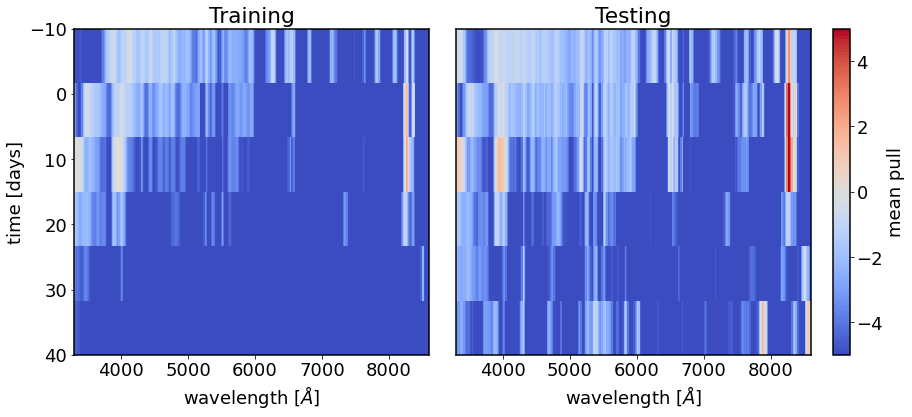

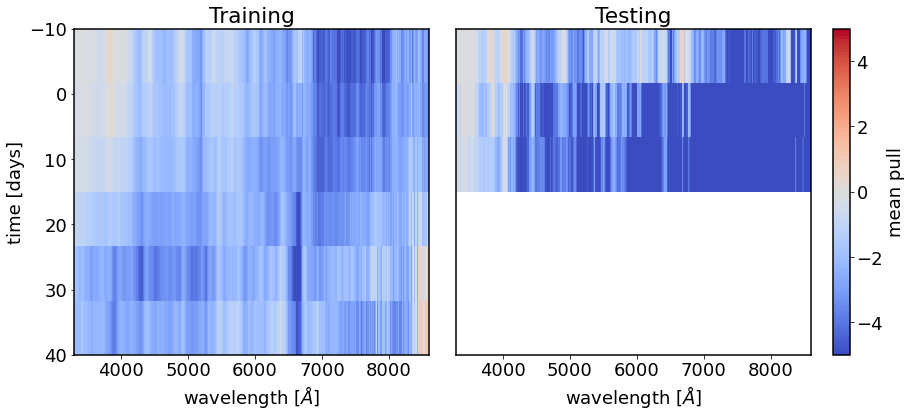

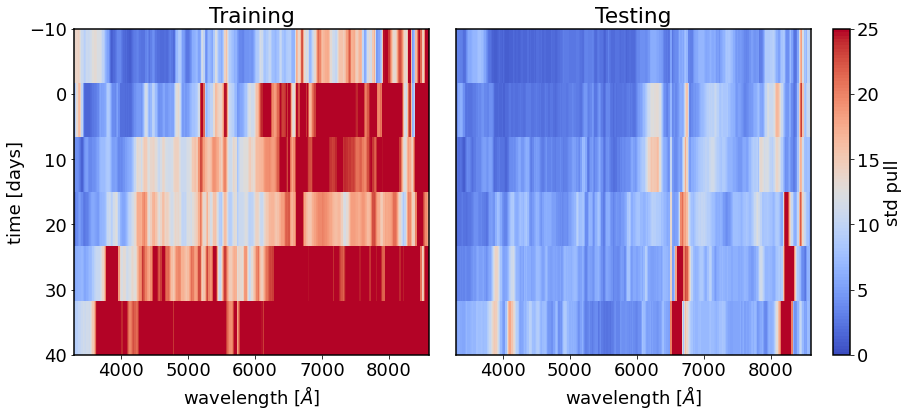

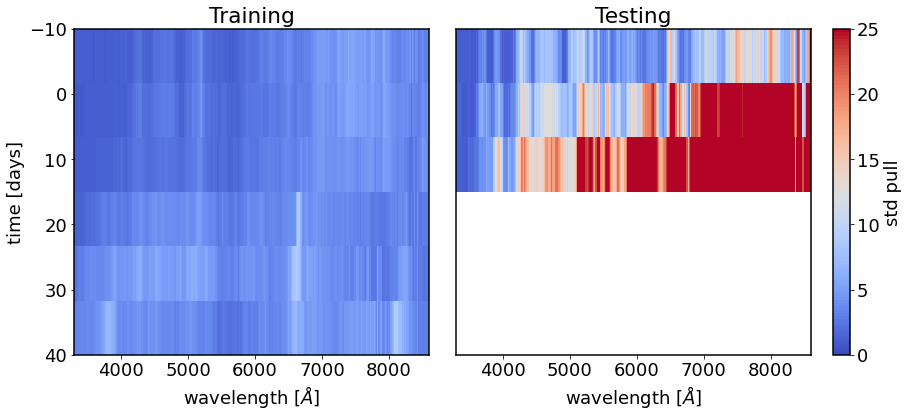

In [73]:
from scipy import stats
from scipy import interpolate

# savefig = False
savefig = True

def pull_time(spec_true, spec_pred, sigma, time, outlier_cut=98):
  
    dm = spec_true != -1.

    ntbins = 6
    t_bin_edge = np.linspace(0, 1, ntbins+1)
    t_bin_cent = (t_bin_edge[:-1] + t_bin_edge[1:])/2

    s0 = spec_true[dm].copy()
    s1 = spec_pred[dm].copy()  
    s1[3] = s0[3]
    sig = sigma[dm].copy()

    t   = time[dm[:,:,0]][:,0]
    
    s0 = np.reshape(s0, (-1, 288))
    s1 = np.reshape(s1, (-1, 288))
    sig = np.reshape(sig, (-1, 288))

    pull = (s0 - s1)/sig
    
    # sometimes there are huge outliers,
    # so can set errors larger than some percentile to the value corresponding to that percentile
    pull_t = np.zeros((len(t_bin_cent), pull.shape[1]))
    std_pull_t = np.zeros((len(t_bin_cent), pull.shape[1],))

    bins = np.digitize(t, t_bin_edge) - 1
    for ibin in np.unique(bins):
        dm   = bins == ibin
        pulli = pull[dm].copy()
        maxval = np.percentile(pulli, outlier_cut, axis=0)
        maxval_tile = np.tile(maxval, (pulli.shape[0], 1))

#         msei[np.greater(msei, maxval)] = maxval_tile
        indgt = np.greater(pulli, maxval)
    
        # mask values greater than outlier_cut
        mask = np.ones(pulli.shape)
        mask[indgt] = 0. #maxval_tile[indgt]
        pull_t[ibin, :] = np.sum(pulli*mask, axis=0)/np.sum(mask, axis=0)
        
        std_pull_t[ibin, :] = np.sqrt(  np.sum((pulli - pull_t[ibin, :])**2*mask, axis=0)/np.sum(mask, axis=0))

    
    return pull_t, std_pull_t, t_bin_edge, t_bin_cent

# plt.savefig(figdir+'aenoise_vs_time.pdf', bbox_inches='tight')

outlier_cut=80
pull_t_ae_train, std_pull_t_ae_train, t_bin_edge, t_bin_cent = pull_time(spectra['train'], spectra_ae['train'], sigma['train'], times['train'], outlier_cut=outlier_cut)
# pull_t_map_train, std_pull_t_map_train, t_bin_edge, t_bin_cent = pull_time(spectra['train'], spectra_map['train'], sigma['train'], times['train'], outlier_cut=outlier_cut)
pull_t_salt_train, std_pull_t_salt_train, t_bin_edge, t_bin_cent = pull_time(spectra['train'], spectra_salt['train'],  sigma['train'], times['train'], outlier_cut=outlier_cut)

pull_t_ae_test, std_pull_t_ae_test, t_bin_edge, t_bin_cent = pull_time(spectra['test'], spectra_ae['test'], sigma['test'], times['test'], outlier_cut=outlier_cut)
# pull_t_map_test, std_pull_t_map_test, t_bin_edge, t_bin_cent = pull_time(spectra['test'], spectra_map['test'], sigma['test'], times['test'], outlier_cut=outlier_cut)
pull_t_salt_test, std_pull_t_salt_test, t_bin_edge, t_bin_cent = pull_time(spectra['test'], spectra_salt['test'],  sigma['test'], times['test'], outlier_cut=outlier_cut)

# savefig = True

cmap = cm.get_cmap('coolwarm', 100)
vmin = -3
vmax = 3


extents = [wavelengths.min(), wavelengths.max(), t_bin_edge[-1]*50-10, t_bin_edge[0]*50-10]


# PULL

def plot_pull(im_train, im_test, vmin, vmax, label='pull'):
    
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,6))
    plt.subplots_adjust(wspace=0.075, hspace=0.1)

    ax0, ax1 = axes
    ax0.imshow(im_train, vmin=vmin, vmax=vmax,
               extent=extents, aspect='auto', cmap=cmap, interpolation='none', origin='lower')

    im = ax1.imshow(im_test, vmin=vmin, vmax=vmax,
               extent=extents, aspect='auto', cmap=cmap, interpolation='none', origin='lower')

    # plt.xlabel('Wavelength [$\AA$]')
    # plt.ylabel('Time [days]')

    ax0.set_xlabel('wavelength [$\AA$]')
    ax1.set_xlabel('wavelength [$\AA$]')

    ax0.set_ylabel('time [days]')

    ax0.set_title('Training')
    ax1.set_title('Testing')

    ax1.get_yaxis().set_visible(False)

    fig.colorbar(im, ax=axes.ravel().tolist(), label=label, pad=0.025)

#     if savefig:
#     #     fname = 'rmse_ratio_vs_time_2D_ae'
#         fname = 'pull_ratio_vs_time_2D_map'

#     #     plt.savefig(figdir+fname+'_{:02d}Dlatent.pdf'.format(latent_dim), bbox_inches='tight')

vmin_pull, vmax_pull = -5, 5
vmin_std, vmax_std = 0, 25

plot_pull(pull_t_salt_train, pull_t_salt_test, vmin=vmin_pull, vmax=vmax_pull, label='mean pull')
plot_pull(pull_t_ae_train, pull_t_ae_test, vmin=vmin_pull, vmax=vmax_pull, label='mean pull')
# plot_pull(pull_t_map_train, pull_t_map_test, vmin=vmin_pull, vmax=vmax_pull, label='pull')

# STD PUll
plot_pull(std_pull_t_salt_train, std_pull_t_salt_test, vmin=vmin_std, vmax=vmax_std, label='std pull')
plot_pull(std_pull_t_ae_train, std_pull_t_ae_test, vmin=vmin_std, vmax=vmax_std, label='std pull')
# plot_pull(std_pull_t_map_train, std_pull_t_map_test, vmin=vmin_std, vmax=vmax_std, label='std pull')

# vmin = 0
# vmax = 10

# fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,6))
# plt.subplots_adjust(wspace=0.075, hspace=0.1)

# ax0, ax1 = axes
# ax0.imshow(std_pull_t_ae_train, vmin=vmin, vmax=vmax,
#            extent=extents, aspect='auto', cmap=cmap, interpolation='none', origin='lower')

# im = ax1.imshow(std_pull_t_ae_test, vmin=vmin, vmax=vmax,
#            extent=extents, aspect='auto', cmap=cmap, interpolation='none', origin='lower')

# # plt.xlabel('Wavelength [$\AA$]')
# # plt.ylabel('Time [days]')

# ax0.set_xlabel('wavelength [$\AA$]')
# ax1.set_xlabel('wavelength [$\AA$]')

# ax0.set_ylabel('time [days]')

# ax0.set_title('Training')
# ax1.set_title('Testing')

# ax1.get_yaxis().set_visible(False)

# # lab = r'$weighted\ RMSe/ weighted\ RMSe_{SALT2} - 1$'
# lab = r'std(pull)'
# fig.colorbar(im, ax=axes.ravel().tolist(), label=lab, pad=0.025)

# if savefig:
# #     fname = 'rmse_ratio_vs_time_2D_ae'
#     fname = 'pull_ratio_vs_time_2D_map'

# #     plt.savefig(figdir+fname+'_{:02d}Dlatent.pdf'.format(latent_dim), bbox_inches='tight')


# Amplitude fits

In [76]:
# Load data
spectra = {}
spectra_salt = {}
sigma = {}
mask = {}
times = {}
times_orig = {}
salts = {}
redshifts = {}
labels = {}
salt_params = {}
luminosity_distance = {}

spectra_ae = {}
spectra_map = {}

u_latent_ae = {}
z_latent_ae = {}
u_latent_map = {}
z_latent_map = {}

lp_u_latent_ae = {}
lp_z_latent_ae = {}
lJ_u_latent_ae = {}
lp_u_latent_map = {}
lp_z_latent_map = {}
lJ_u_latent_map = {}

loss_ae = {}
loss_map = {}

dt = {}
cov = {}
dt_sig = {}
A = {}
A_sig = {}


labels_all = np.array([])
logp_all = np.array([])
redshifts_all = np.array([])
ind_fold = np.array([])

latent_dim=4
for kfold in range(0, 1):
    for tstr in ['train', 'test']:

        # spectra data
#         df = np.load('../data/{:s}_data.npz'.format(tstr))

        df = np.load('../data/{:s}_data_kfold{:d}.npz'.format(tstr, kfold))

        wavelengths       = df['wavelengths']
        salt_params[tstr] = df['salt_params']
        salt_params_label = df['salt_params_label']

        spectra[tstr]      = df['spectra']
        spectra_salt[tstr] = df['spectra_salt']
        sigma[tstr]        = df['sigma']

        mask[tstr]         = df['mask']    
        times[tstr]        = df['times']
        times_orig[tstr]   = df['times_orig']
        salts[tstr]        = df['salts']
        redshifts[tstr]    = df['redshifts']
        labels[tstr]       = df['labels']

        luminosity_distance[tstr] = df['luminosity_distance']

        labels_all = np.concatenate((labels_all, labels[tstr]))
        redshifts_all = np.concatenate((redshifts_all, redshifts[tstr]))
        ind_fold = np.concatenate((ind_fold, redshifts[tstr]*0+kfold))
        # post map
        
#         df = np.load('../data/{:s}_data_{:02d}Dlatent_MAP.npz'.format(tstr, latent_dim))
        df = np.load('../data/{:s}_data_{:02d}Dlatent_MAP_kfold{:01d}.npz'.format(tstr, latent_dim, kfold))

        print(df.files)

        spectra_map[tstr] = df['spectra_map']
        spectra_ae[tstr]  = df['spectra_ae']

        u_latent_ae[tstr] = df['u_latent_ae']
        z_latent_ae[tstr] = df['z_latent_ae']
        u_latent_map[tstr] = df['u_latent_map']
        z_latent_map[tstr] = df['z_latent_map']

        lp_u_latent_ae[tstr] = df['lp_u_latent_ae']
        lp_z_latent_ae[tstr] = df['lp_z_latent_ae']
        lJ_u_latent_ae[tstr] = df['lJ_u_latent_ae']
        lp_u_latent_map[tstr] = df['lp_u_latent_map']
        lp_z_latent_map[tstr] = df['lp_z_latent_map']
        lJ_u_latent_map[tstr] = df['lJ_u_latent_map']

        logp_all = np.concatenate((logp_all, lp_z_latent_map[tstr]))
        
        loss_ae[tstr]  = df['loss_ae']
        loss_map[tstr] = df['loss_map']

        dt[tstr]  = df['dtime']*50
        A[tstr]  = df['amplitude']

        cov[tstr] = df['covariance']
        dt_sig[tstr] = np.sqrt(cov[tstr][:, -1, -1])*50
        A_sig[tstr] = np.sqrt(cov[tstr][:, -2, -2])

        dt[tstr][np.isnan(dt[tstr])] = 0
        A[tstr][np.isnan(dt[tstr])] = 0

cond_dim     = 1 # time
n_timestep   = spectra['test'].shape[1]
n_wavelength = spectra['test'].shape[2]

# spectra_map = spectra_ae

['spectra_ae', 'spectra_map', 'u_latent_ae', 'z_latent_ae', 'u_latent_map', 'z_latent_map', 'lp_z_latent_ae', 'lp_u_latent_ae', 'lJ_u_latent_ae', 'lp_z_latent_map', 'lp_u_latent_map', 'lJ_u_latent_map', 'loss_ae', 'loss_map', 'nspectra', 'redshift', 'dtime', 'amplitude', 'covariance']
['spectra_ae', 'spectra_map', 'u_latent_ae', 'z_latent_ae', 'u_latent_map', 'z_latent_map', 'lp_z_latent_ae', 'lp_u_latent_ae', 'lJ_u_latent_ae', 'lp_z_latent_map', 'lp_u_latent_map', 'lJ_u_latent_map', 'loss_ae', 'loss_map', 'nspectra', 'redshift', 'dtime', 'amplitude', 'covariance']


<ipython-input-76-29ff275574ad>:105: RuntimeWarning: invalid value encountered in sqrt
  A_sig[tstr] = np.sqrt(cov[tstr][:, -2, -2])


[ 1.95484046  1.46402441  1.10968731  0.61955387  2.18166623  0.67363028
  3.15417554  0.66928887  1.61774042  1.5704648   0.83884932  1.1798599
  0.87430984  2.03387807  0.60885728  0.78364709  0.88108081  4.19209583
  0.56644419  0.87844108  0.70052585  0.65945687 14.9323427   2.3183916
  1.2458146   2.60995996  0.76186432  1.04367438  1.22581166  8.03734739
  0.91615847  2.46579348  0.94969594  0.66094211  1.64491681  0.74810315
  1.38055072  0.65806148  2.01282687  0.63746333  5.5808283   1.39157029
  1.22231393  0.713525    1.26075048  0.81103842  0.69364501  1.11088065
  1.83788109  0.90392069  0.58575768  2.23586162  0.75064989  0.62660648
  1.21938352  7.68760272  1.74265058  0.77611898  0.64790814  2.79104672
  5.05829288  1.51152498  2.33401551  1.45053807  1.58765027  9.47765067
  0.8272721   0.54725533  1.33586357  0.59073729  1.11442439  1.66687204
  0.83879031  1.28982057  0.73176214  1.7875143   1.29053436 64.56358621
  0.63318307  0.82856883  1.05296531  1.54403009  0.7

<ipython-input-52-0cba5a6f8d13>:17: RuntimeWarning: divide by zero encountered in true_divide
  plt.plot(zz, 1./dl_interp_vals(zz)**2, 'k', label='true')


Text(0, 0.5, '1 / $d_L^2$')

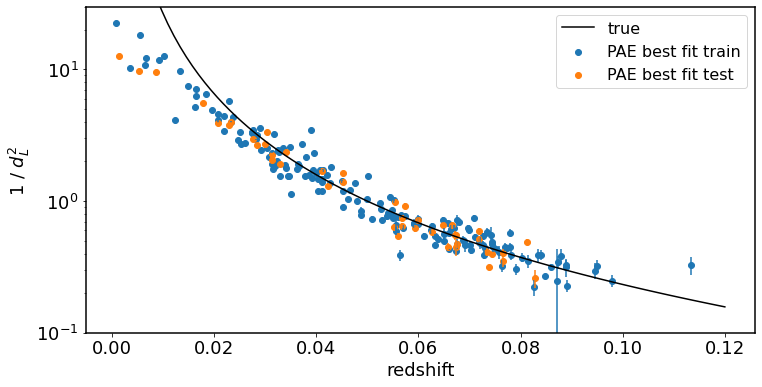

In [52]:
plt.figure(figsize=(12,6))
for ti, tstr in enumerate(['train', 'test']):

#     print(A[tstr])
#     print(dl_interp_vals(redshifts[tstr]))
    print(1./dl_interp_vals(redshifts[tstr]))
#     dl_frac =  np.sqrt(A[tstr]) / (1./dl_interp_vals(redshifts[tstr]))
#     dl_frac_err = np.sqrt(A_sig[tstr]) / (1./dl_interp_vals(redshifts[tstr]))

    dl_frac =  A[tstr]#1./np.sqrt(A[tstr])
    dl_frac_err = A_sig[tstr]#1./np.sqrt(A_sig[tstr])
    
    plt.errorbar(redshifts[tstr], dl_frac, yerr=dl_frac_err, ls='none', color='C{:d}'.format(ti))
    plt.scatter(redshifts[tstr], dl_frac, color='C{:d}'.format(ti), label='PAE best fit {:s}'.format(tstr))

zz = np.linspace(0, 0.12, 100)
plt.plot(zz, 1./dl_interp_vals(zz)**2, 'k', label='true')
plt.yscale('log')

plt.legend()

plt.ylim(0.1, 30)
# plt.axhline(1, color='k')
plt.xlabel('redshift')
plt.ylabel(r'1 / $d_L^2$')

[0.49965437 0.69002479 0.89525587 1.58662447 0.45199031 1.41773292
 0.31574855 1.4761081  0.6087733  0.62319349 1.16803567 0.85473583
 1.14660642 0.48706414 1.69099747 1.21330128 1.11037982 0.23835918
 1.72128419 1.14536815 1.41098264 1.5077167  0.0764213  0.42652943
 0.79264551 0.38294356 1.30326262 0.93532496 0.80104563 0.12425134
 1.10532662 0.40694575 1.06975605 1.54274976 0.6041761  1.2705175
 0.72592579 1.57454623 0.48763072 1.56504809 0.18646626 0.71122607
 0.82943569 1.3815267  0.77971065 1.22188387 1.46140635 0.87219192
 0.53689581 1.08510051 1.78837496 0.44266824 1.39574395 1.62826751
 0.80752911 0.12684942 0.54829065 1.24938312 1.54645329 0.37233879
 0.19365122 0.61320397 0.42474988 0.6766679  0.63106122 0.10513454
 1.20586364 1.77783236 0.76254588 1.58509225 0.92941603 0.60148583
 1.18862745 0.78302217 1.20938426 0.56123768 0.77311287 0.01539273
 1.57707046 1.11180854 0.92449102 0.63817211 1.33343862 0.54189536
 1.34699326 0.53320523 0.64355478 0.6694168  0.86092935 0.67742

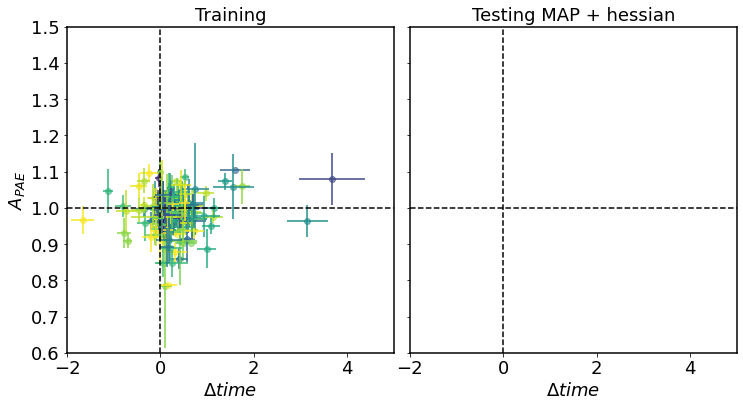

In [78]:
# --------- both------------------
# savefig=True
savefig=False

fig = plt.figure(figsize=(12, 6))
gs = fig.add_gridspec(1, 2)
gs.update(wspace=0.05, hspace=0.075)

ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])
# ax2 = fig.add_subplot(gs[0, 2])

zmin = min(redshifts['train'].min(), redshifts['test'].min())
zmax = min(redshifts['train'].max(), redshifts['test'].max())

for ti, tstr in enumerate(['train']):
    
#     dl_frac =  np.sqrt(A[tstr])/(1./dl_interp_vals(redshifts[tstr]))
#     dl_frac_err = np.sqrt(A_sig[tstr])/(1./dl_interp_vals(redshifts[tstr]))
    print(dl_frac)
    dl_frac =  A[tstr]
    dl_frac_err = A_sig[tstr]
    for i in range(dt[tstr].shape[0]):
        colori = (redshifts[tstr][i] - zmin)/(zmax-zmin)
        ax0.errorbar(dt[tstr][i], dl_frac[i], xerr=dt_sig[tstr][i], yerr=dl_frac_err[i], ls='none', color=plt.cm.viridis(colori))
        ax0.scatter(dt[tstr][i], dl_frac[i], label=tstr, color=plt.cm.viridis(colori), alpha=0.6)
        
# for ti, tstr in enumerate(['test']):
#     for i in range(dt[tstr].shape[0]):
#         colori = (redshifts[tstr][i] - zmin)/(zmax-zmin)
#         ax1.errorbar(dt[tstr][i], A[tstr][i], xerr=dt_sig[tstr][i], yerr=A_sig[tstr][i], ls='none', color=plt.cm.viridis(colori))
#         ax1.scatter(dt[tstr][i], A[tstr][i], label=tstr, color=plt.cm.viridis(colori), alpha=0.6)


# ax2.errorbar(dtime_test_mcmc, amp_test_mcmc, xerr=sig_dtime_test_mcmc, yerr=sig_amp_test_mcmc, ls='none', color='C2')
# ax2.scatter(dtime_test_mcmc, amp_test_mcmc, label='Test MCMC', color='C2', alpha=0.6)


ax0.set_ylabel('$A_{PAE}$')
ax0.set_xlabel('$\Delta time$')
ax1.set_xlabel('$\Delta time$')
# ax2.set_xlabel('$\Delta time$')

ax0.axhline(1.0, ls='--', color='k')
ax1.axhline(1.0, ls='--', color='k')
# ax2.axhline(1.0, ls='--', color='k')

ax0.axvline(0.0, ls='--', color='k')
ax1.axvline(0.0, ls='--', color='k')
# ax2.axvline(0.0, ls='--', color='k')

# ax0.legend(loc='upper right', frameon=False)
# ax1.legend(loc='upper right', frameon=False)
# ax2.legend(loc='upper right', frameon=False)

ax0.set_title('Training', fontsize=18)
ax1.set_title('Testing MAP + hessian', fontsize=18)
# ax2.set_title('Testing HMC', fontsize=18)

#   ax1.legend(loc='upper center', frameon=False, ncol=4, 
#                    handlelength=1., handletextpad=0.5,
#                    bbox_to_anchor=(0.5, 1.15), title='Posterior $A, \Delta t:$')
        
ax1.set_yticklabels([])
# ax2.set_yticklabels([])

xmin = -2
xmax = 5 #2.5
ax0.set_xlim(xmin, xmax)
ax1.set_xlim(xmin, xmax)
# ax2.set_xlim(-xminmax, xminmax)

ymin = 0.6
ymax = 1.5
ax0.set_ylim(ymin, ymax)
ax1.set_ylim(ymin, ymax)
# ax2.set_ylim(0.6,1.7)

if savefig:
    plt.savefig('../figures/uncertainty_quantification/train_test_amplitude_time_scatter.pdf', bbox_inches='tight')



In [ ]:
  lp_z = flow.log_prob(MAPz)
    lp_u = -1./2 * np.sum(MAPu**2, axis=1)
    lJ_u = flow.bijector.forward_log_det_jacobian(MAPu, event_ndims=1)

    plt.figure()
    plt.scatter(lp_u+lJ_u, lp_z)
    plt.figure()
    plt.scatter(lJ_u, lp_z)

    # .flow.bijector.forward(self.MAPu) 
    def transformed_log_prob(bijector, log_prob, x):
          return ()
    # print(flow.bijector.inverse_log_det_jacobian(MAPz, event_ndims=1), )
    #       flow.log_prob(flow.bijector.forward(MAPu)))

    # print(p_z)
    # print(p_u)
    # print(flow.bijector.inverse_log_det_jacobian(MAPz, event_ndims=1), flow.log_prob(flow.bijector.inverse(MAPu)))

    # plt.figure()
    # plt.scatter(A, dt)
    # plt.xlabel('Amplitude')
    # plt.ylabel('time')

    # amax = 1.2
    # amin = 0.8
    # A[A > amax] = amax
    # A[A < amin] = amin

    plt.figure()
    plt.scatter(MAPz[:,0], MAPz[:,1], c=lp_z)
    plt.colorbar(label='log p(z)')
    plt.xlabel('$z_0$')
    plt.ylabel('$z_1$')

    plt.figure()
    plt.scatter(MAPz[:,0], MAPz[:,1], c=lJ_u+lp_u)
    plt.colorbar(label='log p(z)')
    plt.xlabel('$z_0$')
    plt.ylabel('$z_1$')

    plt.figure()
    plt.scatter(lp_z, A)
    plt.ylabel('Amplitude')
    plt.xlabel('log p(z)')

    plt.figure()
    plt.scatter(lJ_u+lp_u, A)
    plt.ylabel('Amplitude')
    plt.xlabel('log p(z)')

# # # amplitude
# # plt.figure()
# # plt.scatter(MAPu[:,0], MAPu[:,1], c=A, cmap='coolwarm')
# # plt.colorbar(label='Amplitude best fit')
# # plt.xlabel('$u_0$')
# # plt.ylabel('$u_1$')

# # plt.figure()
# # plt.scatter(MAPz[:,0], MAPz[:,1], c=A, cmap='coolwarm')
# # plt.colorbar(label='Amplitude best fit')
# # plt.xlabel('$z_0$')
# # plt.ylabel('$z_1$')

# # #time
# # plt.figure()
# # plt.scatter(MAPu[:,0], MAPu[:,1], c=dt)
# # plt.colorbar(label='delta time best fit')
# # plt.xlabel('$u_0$')
# # plt.ylabel('$u_1$')

# # plt.figure()
# # plt.scatter(MAPz[:,0], MAPz[:,1], c=dt)
# # plt.colorbar(label='delta time best fit')
# # plt.xlabel('$z_0$')
# # plt.ylabel('$z_1$')


In [28]:
log_posterior.amplitude

# zin, x0_in, x0_z_fac = np.loadtxt('x0_vs_z_with_x0z_fac.txt', unpack=True)
# # x0_z_fac = (cosmo.luminosity_distance(z)/cosmo.luminosity_distance(zref))**2 * (1+z)/(1+zref) 

# if train:
#     Asalt = (x0_in*x0_z_fac)[:len(log_posterior.amplitude.numpy())]
#     zin = zin[:len(log_posterior.amplitude.numpy())]
# else:
#     Asalt = (x0_in*x0_z_fac)[-len(log_posterior.amplitude.numpy()):]
#     zin = zin[-len(log_posterior.amplitude.numpy()):]

# plt.scatter(np.abs(log_posterior.amplitude), Asalt, c=zin)
# plt.colorbar()

# plt.figure()
# plt.scatter(np.abs(log_posterior.amplitude), log_posterior.dtime.numpy()*50, c=zin)
# plt.colorbar()

# sample = 0
# cov_save = np.zeros((nsn*nmulti, covariance.shape[-2], covariance.shape[-1]))
# MAP_save = np.zeros((nsn*nmulti, log_posterior.MAP.shape[-1]))
# amp_save = np.zeros((nsn*nmulti))
# dt_save  = np.zeros((nsn*nmulti))

# nspec_save    = np.zeros((nsn*nmulti))
# redshift_save = np.zeros((nsn*nmulti))
# loss_save     = np.zeros((nsn*nmulti))

# cov_save[nmulti*sample:nmulti*(sample+1)] = covariance
# MAP_save[nmulti*sample:nmulti*(sample+1)] = log_posterior.MAP.numpy()
# amp_save[nmulti*sample:nmulti*(sample+1)] = log_posterior.amplitude.numpy()
# dt_save[nmulti*sample:nmulti*(sample+1)]  = log_posterior.dtime.numpy()
# nspec_save[nmulti*sample:nmulti*(sample+1)] = n_spectra_each
# redshift_save[nmulti*sample:nmulti*(sample+1)] = z_c
# loss_save[nmulti*sample:nmulti*(sample+1)] = loss_hist[-1]

# np.savez("{:s}_params_cov_MAP_amplitude_time_randini_bunch.npz".format(fhead), 
# #     np.savez("{:s}_params_cov_MAP_amplitude.npz".format(fhead), 
# loss=loss_save,
# nspectra=nspec_save,
# redshift=redshift_save,
# dtime=dt_save,
# amplitude=amp_save,
# MAP=MAP_save,
# covariance=cov_save)
# log_posterior.amplitude.numpy()

ValueError: too many values to unpack (expected 3)

44
[-1.32561564 -1.2510457  -0.79417574 -0.77052057 -0.94679046 -1.16298914
 -1.3932215  -0.78333378 -1.38063812 -1.36221564 -0.98485327 -1.13845396
 -0.50883591 -1.11991739 -0.95754206 -0.79349756 -0.91259778 -1.25915682
 -1.09863341 -1.10083342 -1.10775542 -1.12983859 -1.31068194 -0.56511629
 -1.02589059 -1.24067068 -1.29838157 -1.52922988 -0.99918008 -1.23787904
 -1.03075457 -0.84307194 -0.80035365 -0.72204924 -0.87382007 -0.97111762
 -0.90342999 -1.37471414 -0.86348391 -0.9884032  -1.14585745 -0.63698071
 -1.41729581 -0.89760029]


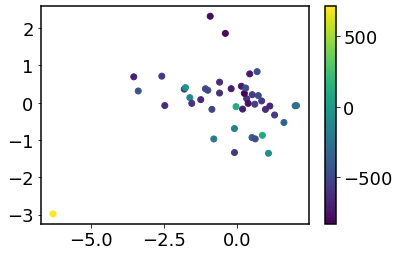

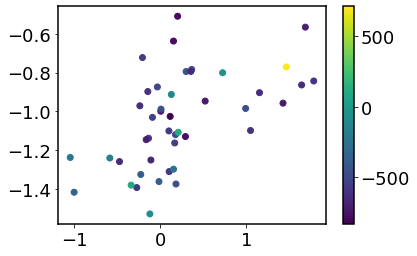

In [43]:
print(len(amp_save))

plt.figure()
plt.scatter(MAP_save[:,0], MAP_save[:,1], c=loss_save)
plt.colorbar()

plt.figure()
plt.scatter(dt_save*50, amp_save, c=loss_save)
plt.colorbar()

print(amp_save)

In [30]:
def get_sigma_params(model, cov, trainable_params, nsamp=10000):
    '''get samples in both u and z around MAP
    matrix not always positive definitate. Re-finding MAP usually helps
    '''
#     print('Hessian', hess)

    sig_z = np.zeros((cov.shape[0], cov.shape[-1]))
    for icov, covi in enumerate(cov):
    #     print('Cov', covi)

        samples = []
        for jj in range(nsamp):
            samples.append(np.dot(np.linalg.cholesky(covi), np.random.randn(covi.shape[-1])))

        samples = np.asarray(samples).astype(np.float32)

        lu = model.MAP.shape[1]

        shift   = np.concatenate([i[icov].flatten() for i in trainable_params])
        samples += shift

        samples_z = samples.copy()
        samples_z[:,:lu] = model.flow.bijector.forward(samples[:, :lu]).numpy()

        sig_z[icov] = np.std(samples_z, axis=0)
    
    return sig_z

In [38]:
# dt_save*50, amp_save, MAP_save, cov_save
# plt.scatter(np.arange(len(amp_save)), amp_save)
import glob
from scipy import interpolate

showplt = True

# Salt amplitude paramaters
# x0_z_fac = (cosmo.luminosity_distance(z)/cosmo.luminosity_distance(zref))**2 * (1+z)/(1+zref) 

z_salt, x0_salt, x0_z_fac_salt, dl_z = np.loadtxt('x0_vs_z_with_x0z_fac.txt', unpack=True)

Asalt_train  = (x0_salt*x0_z_fac_salt)[:-44]
z_salt_train = z_salt[:-44]
x0_z_fac_salt_train = x0_z_fac_salt[:-44]

Asalt_test  = (x0_salt*x0_z_fac_salt)[-44:]
z_salt_test = z_salt[-44:]
x0_z_fac_salt_test = x0_z_fac_salt[-44:]

dl_z_train = dl_z[:-44]
dl_z_test  = dl_z[-44:]

zz, dl_zz = np.loadtxt('dl_of_z.txt', unpack=True)
dl_of_z = interpolate.interp1d(zz, dl_zz)

fin_train = np.load("../data/fits/training_new_params_cov_MAP_amplitude_time.npz")

nspectra_train   = fin_train['nspectra']
redshift_train   = fin_train['redshift']
amp_train        = np.abs(fin_train['amplitude'])
dtime_train      = fin_train['dtime']
MAP_train        = fin_train['MAP']
covariance_train = fin_train['covariance']
loss_train       = fin_train['loss']

# sig_amp_train = np.sqrt(np.abs(covariance_train[:, -2,-2]))
# sig_dtime_train = np.sqrt(np.abs(covariance_train[:, -1,-1]))*50

if amplitude_in_network:
    sigma_z_train = get_sigma_params(log_posterior, covariance_train, [MAP_train, dtime_train], nsamp=10000)
    sig_amp_train = sigma_z_train[:,0]
    sig_dtime_train = sigma_z_train[:,-1]*50

else:
    sig_amp_train = np.sqrt(np.abs(covariance_train[:, -2,-2]))
    sig_dtime_train = np.sqrt(np.abs(covariance_train[:, -1,-1]))*50

dtime_train *= 50

# fin_test = np.load("testing_params_cov_MAP_amplitude_time.npz")
fin_test = np.load("../data/fits/testing_params_cov_MAP_amplitude_time.npz")

nspectra_test   = fin_test['nspectra']
redshift_test   = fin_test['redshift']
amp_test        = np.abs(fin_test['amplitude'])
dtime_test      = fin_test['dtime']#*50
MAP_test        = fin_test['MAP']
covariance_test = fin_test['covariance']
loss_test       = fin_test['loss']

if amplitude_in_network:
    sigma_z_test = get_sigma_params(log_posterior, covariance_test, [MAP_test, dtime_test], nsamp=10000)
    sig_amp_test = sigma_z_test[:,0]
    sig_dtime_test = sigma_z_test[:,-1]*50

else:
    sig_amp_test = np.sqrt(np.abs(covariance_test[:, -2,-2]))
    sig_dtime_test = np.sqrt(np.abs(covariance_test[:, -1,-1]))*50

dtime_test *= 50

print(amp_test)
# mcmc_files = sorted(glob.glob('../data/fits/TEST*'))
# print(mcmc_files)

# ntest = 44
# nspec_each = 4
# nchains = 40
# nmulti  = 10

# amp_test_mcmc        = np.zeros(ntest)
# sig_amp_test_mcmc    = np.zeros(ntest)
# dtime_test_mcmc      = np.zeros(ntest)
# sig_dtime_test_mcmc  = np.zeros(ntest)

# isn = 0
# for j, f in enumerate(mcmc_files):
#     print(j, f)
#     fin_test_mcmc = np.load(f)
    
#     samples_dtime = fin_test_mcmc['samples_dtime']
#     samples_MAP   = fin_test_mcmc['samples_MAP']
#     samples_amp   = fin_test_mcmc['samples_amp']
    
#     is_accepted   = fin_test_mcmc['is_accepted']
#     for i in np.arange(0, nchains, nmulti):

#         # add all chains together
#         samples_plt = np.c_[samples_dtime[:,i:i+nmulti][is_accepted[:,i:i+nmulti]].flatten()*50, 
#                             samples_MAP[:,i:i+nmulti][is_accepted[:,i:i+nmulti]].reshape(-1,2), 
#                             samples_amp[:,i:i+nmulti][is_accepted[:,i:i+nmulti]].flatten()]


#         dtime_test_mcmc[isn]     = samples_plt[:,0].mean()
#         sig_dtime_test_mcmc[isn] = samples_plt[:,0].std()

# #         MAP_mean[isn] = samples_plt[:,1:3].mean()
# #         MAP_std[isn]  = samples_plt[:,1:3].std()

#         amp_test_mcmc[isn]      = samples_plt[:,3].mean()
#         sig_amp_test_mcmc[isn]  = samples_plt[:,3].std()
        
#         isn += 1
    
# amp_test_mcmc

[1.15572691 1.11511528 0.99205774 0.45814866 0.83050418 1.06160891
 0.93099421 1.05708742 1.03152144 1.115152   0.96890783 0.90912014
 0.88295966 1.2035749  0.95428896 1.29253316 1.352386   1.17571497
 1.04728556 0.98975176 0.98362327 0.96398586 1.11754835 0.96277642
 1.16139877 0.947191   1.09856009 1.09753609 0.86579734 0.92092764
 0.8998524  0.97516125 0.92289066 1.30892694 0.84235585 0.90859854
 0.99058676 1.30198002 0.98039407 0.96501917 1.01936245 0.93030548
 0.99975097 0.92517382]


In [75]:
# Amplitude
savefig = False
# savefig = True

# --------- Histogram ------------------
plt.figure(figsize=(8,6))

xbins = np.linspace(0.5,1.5,25)
plt.hist(amp_train, color='C0', bins=xbins, alpha=0.5, density=True, label='Train')
plt.hist(amp_test,  color='C1', bins=xbins, alpha=0.5, density=True, label='Test MAP')
# plt.hist(amp_test_mcmc,  color='C2', bins=xbins, alpha=0.5, density=True, label='Test MCMC')

plt.axvline(1.0, ls='--', color='k')

plt.xlabel('Luminosity')
plt.legend(loc='upper right')

if savefig: plt.savefig('../figures/uncertainty_quantification/amplitude_histogram.pdf', bbox_inches='tight')


# --------- Errorbar ------------------
plt.figure(figsize=(12,4))

plt.errorbar(np.arange(amp_train.shape[0]), amp_train, yerr=sig_amp_train, ls='none')
plt.errorbar(np.arange(amp_test.shape[0])+0.1, amp_test, yerr=sig_amp_test, ls='none')
# plt.errorbar(np.arange(amp_test_mcmc.shape[0])+0.2, amp_test_mcmc, yerr=sig_amp_test_mcmc, ls='none')

plt.scatter(np.arange(amp_train.shape[0]), amp_train, label='Train')
plt.scatter(np.arange(amp_test.shape[0])+0.1, amp_test, label='Test MAP')
# plt.scatter(np.arange(amp_test_mcmc.shape[0])+0.2, amp_test_mcmc, label='Test MCMC')

plt.ylabel('Luminosity')
plt.xlabel('Supernovae sample')

plt.axhline(1.0, ls='--', color='k')

plt.legend(loc='upper right')

plt.ylim(0.6,1.6)

if savefig: plt.savefig('../figures/uncertainty_quantification/amplitude_scatter.pdf', bbox_inches='tight')


# Time
# --------- Histogram ------------------
plt.figure(figsize=(8,6))
xbins = np.linspace(-2,2,25)

plt.hist(dtime_train, color='C0', bins=xbins, alpha=0.5, density=True, label='Train')
plt.hist(dtime_test,  color='C1', bins=xbins, alpha=0.5, density=True, label='Test')

plt.axvline(0.0, ls='--', color='k')

plt.xlabel(r'$\Delta t\ [days]$')
plt.legend(loc='upper right')
if savefig: plt.savefig('../figures/uncertainty_quantification/time_histogram.pdf', bbox_inches='tight')



# --------- Errorbar ------------------
plt.figure(figsize=(12,4))

plt.errorbar(np.arange(dtime_train.shape[0]), dtime_train, yerr=sig_dtime_train, ls='none')
plt.errorbar(np.arange(dtime_test.shape[0])+0.1, dtime_test, yerr=sig_dtime_test, ls='none')
# plt.errorbar(np.arange(dtime_test_mcmc.shape[0])+0.2, dtime_test_mcmc, yerr=sig_dtime_test_mcmc, ls='none')

plt.scatter(np.arange(dtime_train.shape[0]), dtime_train, label='Train')
plt.scatter(np.arange(dtime_test.shape[0])+0.1, dtime_test, label='Test MAP')
# plt.scatter(np.arange(dtime_test_mcmc.shape[0])+0.2, dtime_test_mcmc, label='Test MCMC')

plt.ylabel(r'$\Delta t\ [days]$')
plt.xlabel('Supernovae sample')

plt.axhline(0.0, ls='--', color='k')

plt.legend(loc='upper right')

# plt.ylim(-2.25,2.25)

if savefig: plt.savefig('../figures/uncertainty_quantification/time_scatter.pdf', bbox_inches='tight')


    

NameError: name 'amp_train' is not defined

<Figure size 576x432 with 0 Axes>

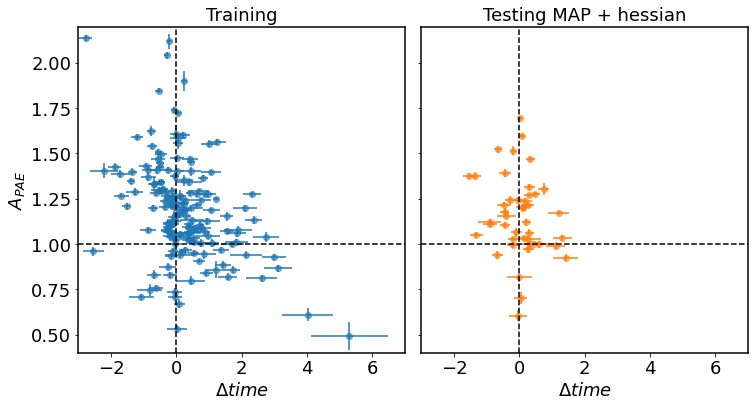

In [160]:
# --------- both------------------
savefig=True
# savefig=False

fig = plt.figure(figsize=(12, 6))
gs = fig.add_gridspec(1, 2)
gs.update(wspace=0.05, hspace=0.075)

ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])
# ax2 = fig.add_subplot(gs[0, 2])


ax0.errorbar(dtime_train, amp_train, xerr=sig_dtime_train, yerr=sig_amp_train, ls='none', color='C0')
ax0.scatter(dtime_train, amp_train, label='Train', color='C0', alpha=0.6)


ax1.errorbar(dtime_test, amp_test, xerr=sig_dtime_test, yerr=sig_amp_test, ls='none', color='C1')
ax1.scatter(dtime_test, amp_test, label='Test MAP', color='C1', alpha=0.6)

# ax2.errorbar(dtime_test_mcmc, amp_test_mcmc, xerr=sig_dtime_test_mcmc, yerr=sig_amp_test_mcmc, ls='none', color='C2')
# ax2.scatter(dtime_test_mcmc, amp_test_mcmc, label='Test MCMC', color='C2', alpha=0.6)


ax0.set_ylabel('$A_{PAE}$')
ax0.set_xlabel('$\Delta time$')
ax1.set_xlabel('$\Delta time$')
# ax2.set_xlabel('$\Delta time$')

ax0.axhline(1.0, ls='--', color='k')
ax1.axhline(1.0, ls='--', color='k')
# ax2.axhline(1.0, ls='--', color='k')

ax0.axvline(0.0, ls='--', color='k')
ax1.axvline(0.0, ls='--', color='k')
# ax2.axvline(0.0, ls='--', color='k')

# ax0.legend(loc='upper right', frameon=False)
# ax1.legend(loc='upper right', frameon=False)
# ax2.legend(loc='upper right', frameon=False)

ax0.set_title('Training', fontsize=18)
ax1.set_title('Testing MAP + hessian', fontsize=18)
# ax2.set_title('Testing HMC', fontsize=18)

#   ax1.legend(loc='upper center', frameon=False, ncol=4, 
#                    handlelength=1., handletextpad=0.5,
#                    bbox_to_anchor=(0.5, 1.15), title='Posterior $A, \Delta t:$')
        
ax1.set_yticklabels([])
# ax2.set_yticklabels([])

xmin = -3
xmax = 7 #2.5
ax0.set_xlim(xmin, xmax)
ax1.set_xlim(xmin, xmax)
# ax2.set_xlim(-xminmax, xminmax)

ymin = 0.4
ymax = 2.2
ax0.set_ylim(ymin, ymax)
ax1.set_ylim(ymin, ymax)
# ax2.set_ylim(0.6,1.7)

if savefig: plt.savefig('../figures/uncertainty_quantification/train_test_amplitude_time_scatter.pdf', bbox_inches='tight')



[2.36909107e-03 2.34330070e-03 1.55675617e-03 1.77457563e-03
 1.66089436e-03 1.83718779e-03 1.16154789e-03 1.63325314e-03
 1.95532973e-03 1.64281260e-03 1.41606808e-03 1.46183523e-03
 2.14279877e-03 5.92327875e-04 1.65861392e-03 1.07957396e-03
 9.08587846e-04 3.38588627e-04 1.43830450e-03 1.46271596e-03
 1.45868147e-03 1.63426940e-03 3.20711898e-05 1.28969870e-03
 2.00842402e-03 2.68327518e-03 1.31122573e-03 1.95659876e-03
 2.75960015e-04 1.45100004e-03 1.71265401e-03 1.05358781e-03
 2.23699678e-03 1.30050502e-03 1.23622942e-03 2.60993623e-03
 1.54944945e-03 1.84146096e-03 8.12049008e-04 1.90636718e-03
 2.04323362e-03 1.86351919e-03 2.24260280e-03 1.24780901e-03
 1.30134132e-03 1.66073791e-03 1.86111020e-03 1.60923377e-03
 2.52408153e-03 1.05450767e-03 1.95203291e-03 1.66681728e-03
 1.76948205e-03 1.52193959e-03 7.11641328e-04 8.28536333e-04
 1.35443511e-03 1.83055504e-03 1.19330269e-03 1.62305876e-04
 1.49651852e-03 1.12053453e-03 1.39694794e-03 2.17598346e-03
 1.51485890e-03 3.298003

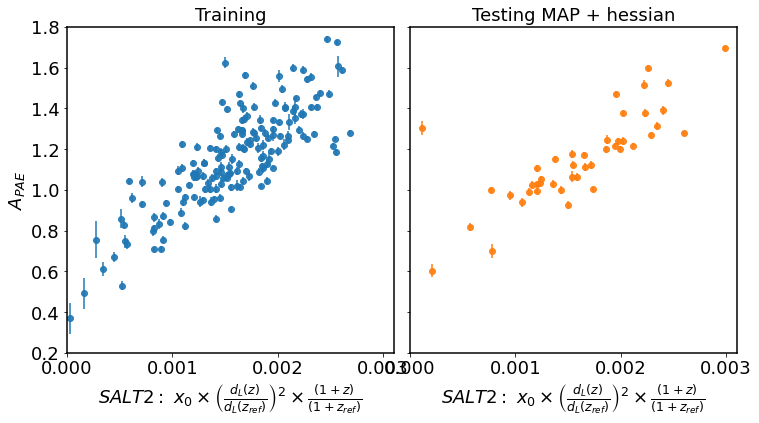

In [151]:
# --------- both------------------
savefig=True
# savefig=False

fig = plt.figure(figsize=(12, 6))
gs = fig.add_gridspec(1, 2)
gs.update(wspace=0.05, hspace=0.075)

ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])
# ax2 = fig.add_subplot(gs[0, 2])

print(Asalt_train)

ax0.errorbar(Asalt_train, amp_train, yerr=sig_amp_train, ls='none', color='C0')
ax0.scatter(Asalt_train, amp_train, label='Train', color='C0', alpha=0.9)

ax1.errorbar(Asalt_test, amp_test, yerr=sig_amp_test, ls='none', color='C1')
ax1.scatter(Asalt_test, amp_test, label='Test MAP', color='C1', alpha=0.9)


# ax2.errorbar(dtime_test_mcmc, amp_test_mcmc, xerr=sig_dtime_test_mcmc, yerr=sig_amp_test_mcmc, ls='none', color='C2')
# ax2.scatter(dtime_test_mcmc, amp_test_mcmc, label='Test MCMC', color='C2', alpha=0.6)

# x0_z_fac = (cosmo.luminosity_distance(z)/cosmo.luminosity_distance(zref))**2 * (1+z)/(1+zref) 
x0lab = r'$SALT2:\ x_0 \times \left(\frac{d_L(z)}{d_L(z_{ref})}\right)^2 \times \frac{(1+z)}{(1+z_{ref})}$'
ax0.set_ylabel('$A_{PAE}$')
ax0.set_xlabel(x0lab)
ax1.set_xlabel(x0lab)
# ax2.set_xlabel('$\Delta time$')



ampscale_ae   = 1./np.median(amp_train/Asalt_train) 
xx = np.linspace(0,1,100)
yy = xx/ampscale_ae
# ax0.plot(xx, yy, '--k')

ax0.set_title('Training', fontsize=18)
ax1.set_title('Testing MAP + hessian', fontsize=18)
# ax2.set_title('Testing HMC', fontsize=18)

#   ax1.legend(loc='upper center', frameon=False, ncol=4, 
#                    handlelength=1., handletextpad=0.5,
#                    bbox_to_anchor=(0.5, 1.15), title='Posterior $A, \Delta t:$')
        
ax1.set_yticklabels([])

xminmax = 3.1e-3
ax0.set_xlim(0, xminmax)
ax1.set_xlim(0, xminmax)
# ax2.set_xlim(0, xminmax)
xx = np.linspace(0, xminmax)
# ax1.plot(xx, xx*1000, 'k')

ymin = 0.2
ymax = 1.8
ax0.set_ylim(ymin,ymax)
ax1.set_ylim(ymin,ymax)
# ax2.set_ylim(0.6,1.7)

if savefig: plt.savefig('../figures/uncertainty_quantification/train_test_amplitude_x0_scatter.pdf', bbox_inches='tight')



0.0011460245001013863
901.4505410953213 1070.1837191206394


<ipython-input-152-f519c8e10090>:38: RuntimeWarning: divide by zero encountered in true_divide
  Fz_ae = 1./(1+zz) * L0_ae/(4*np.pi*dl_z**2)
<ipython-input-152-f519c8e10090>:39: RuntimeWarning: divide by zero encountered in true_divide
  Fz_salt = 1./(1+zz) * L0_salt/(4*np.pi*dl_z**2)


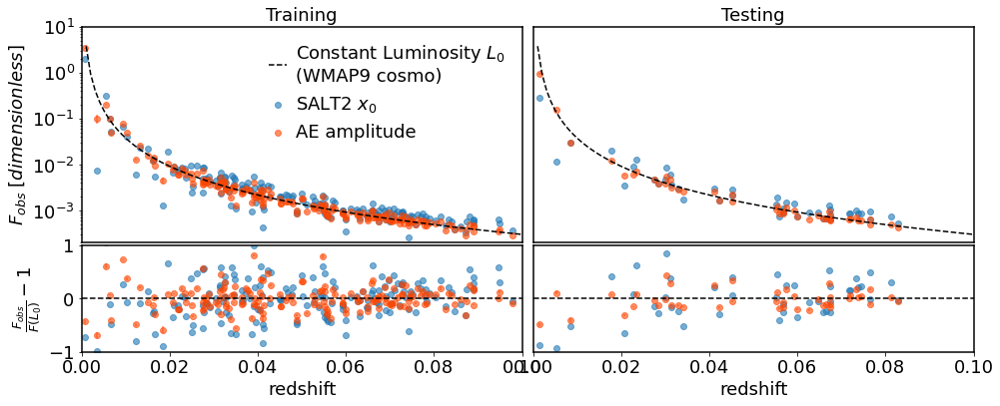

In [152]:
# --------- both------------------
savefig=True
# savefig=False

alpha=0.6

cae = 'orangered'

fig = plt.figure(figsize=(16, 6))
gs = fig.add_gridspec(3, 2)
gs.update(wspace=0.025, hspace=0.025)

ax0 = fig.add_subplot(gs[0:2, 0])
ax1 = fig.add_subplot(gs[0:2, 1])

ax2 = fig.add_subplot(gs[-1, 0])
ax3 = fig.add_subplot(gs[-1, 1])

# ax2 = fig.add_subplot(gs[0, 2])

# Asalt_train  = (x0_salt*x0_z_fac_salt)[:-44]
# z_salt_train = z_salt[:-44]
# x0_z_fac_salt_train = x0_z_fac_salt[:-44]

ampscale_salt = 1
ampscale_ae   = 1./np.mean(amp_train/Asalt_train) 
print(ampscale_ae)


# plot flux at constant luminosity
zz = np.linspace(0, 0.1,100)
dl_z = dl_of_z(zz)

L0_ae   = np.mean((1+z_salt_train) * (amp_train/x0_z_fac_salt_train * ampscale_ae) * 4*np.pi*dl_of_z(z_salt_train)**2)
L0_salt = np.mean((1+z_salt_train) * (Asalt_train/x0_z_fac_salt_train * ampscale_salt) * 4*np.pi*dl_of_z(z_salt_train)**2)

print(L0_ae, L0_salt)
Fz_ae = 1./(1+zz) * L0_ae/(4*np.pi*dl_z**2)
Fz_salt = 1./(1+zz) * L0_salt/(4*np.pi*dl_z**2)

Fz_const = Fz_ae
# ax0.plot(zz, Fz_ae, 'k', label='Constant Luminosity')
ax0.plot(zz, Fz_const, '--k', label='Constant Luminosity $L_0$\n(WMAP9 cosmo)')
ax1.plot(zz, Fz_const, '--k', label='Constant Luminosity')

# get flux values at sn points
dl_z_train = dl_of_z(z_salt_train)
dl_z_test  = dl_of_z(z_salt_test )

Fz_ae_train = 1./(1+z_salt_train) * L0_ae/(4*np.pi*dl_z_train**2)
Fz_salt_train = 1./(1+z_salt_train) * L0_salt/(4*np.pi*dl_z_train**2)
Fz_ae_test = 1./(1+z_salt_test) * L0_ae/(4*np.pi*dl_z_test**2)
Fz_salt_test = 1./(1+z_salt_test) * L0_salt/(4*np.pi*dl_z_test**2)

F_salt_train = Asalt_train/x0_z_fac_salt_train * ampscale_salt
F_ae_train   = amp_train/x0_z_fac_salt_train * ampscale_ae
F_sig_ae_train  = sig_amp_train/x0_z_fac_salt_train * ampscale_ae

F_salt_test = Asalt_test/x0_z_fac_salt_test * ampscale_salt
F_ae_test   = amp_test/x0_z_fac_salt_test * ampscale_ae
F_sig_ae_test  = sig_amp_test/x0_z_fac_salt_test * ampscale_ae


ax0.scatter(z_salt_train, F_salt_train, color='C0', alpha=alpha, label='SALT2 $x_0$')
ax0.errorbar(z_salt_train, F_ae_train,  yerr=F_sig_ae_train, ls='none', color=cae, alpha=alpha)
ax0.scatter(z_salt_train, F_ae_train, color=cae, alpha=alpha, label='AE amplitude')

ax1.scatter(z_salt_test, F_salt_test, color='C0', alpha=alpha, label='SALT2 $x_0$')
ax1.errorbar(z_salt_test, F_ae_test,  yerr=F_sig_ae_test, ls='none', color=cae, alpha=alpha)
ax1.scatter(z_salt_test, F_ae_test, color=cae, alpha=alpha, label='AE amplitude')

ax2.scatter(z_salt_train, F_salt_train/Fz_salt_train - 1, color='C0', alpha=alpha, label='SALT2 $x_0$')
ax2.errorbar(z_salt_train, F_ae_train/Fz_ae_train - 1,  yerr=F_sig_ae_train/Fz_ae_train, ls='none', color=cae, alpha=alpha)
ax2.scatter(z_salt_train, F_ae_train/Fz_ae_train - 1, color=cae, alpha=alpha, label='AE amplitude')

ax3.scatter(z_salt_test, F_salt_test/Fz_salt_test - 1, color='C0', alpha=alpha, label='SALT2 $x_0$')
ax3.errorbar(z_salt_test, F_ae_test/Fz_ae_test - 1,  yerr=F_sig_ae_test/Fz_ae_test, ls='none', color=cae, alpha=alpha)
ax3.scatter(z_salt_test, F_ae_test/Fz_ae_test - 1, color=cae, alpha=alpha, label='AE amplitude')

# ax2.errorbar(dtime_test_mcmc, amp_test_mcmc, xerr=sig_dtime_test_mcmc, yerr=sig_amp_test_mcmc, ls='none', color='C2')
# ax2.scatter(dtime_test_mcmc, amp_test_mcmc, label='Test MCMC', color='C2', alpha=0.6)

# x0_z_fac = (cosmo.luminosity_distance(z)/cosmo.luminosity_distance(zref))**2 * (1+z)/(1+zref) 
ax0.set_ylabel('$F_{obs}\ [dimensionless]$')
ax2.set_ylabel(r'$\frac{F_{obs}}{F(L_0)} - 1$')

# ax1.set_ylabel('Flux [dimensionless]')

# ax0.set_xlabel('redshift')
ax2.set_xlabel('redshift')
ax3.set_xlabel('redshift')

# ax2.set_xlabel('$\Delta time$')

ax2.axhline(0, ls='--', color='k')
ax3.axhline(0, ls='--', color='k')

# ax1.axhline(1.0, ls='--', color='k')
# # ax2.axhline(1.0, ls='--', color='k')

# ax0.axvline(0.0, ls='--', color='k')
# ax1.axvline(0.0, ls='--', color='k')
# # ax2.axvline(0.0, ls='--', color='k')

# ax0.legend(loc='upper right', frameon=False)
# ax1.legend(loc='upper right', frameon=False)
# ax2.legend(loc='upper right', frameon=False)

ax0.set_title('Training', fontsize=18)
ax1.set_title('Testing', fontsize=18)
# ax2.set_title('Testing HMC', fontsize=18)

ax0.legend(loc='upper right', frameon=False, ncol=1, 
               handlelength=1., handletextpad=0.5)

ax1.set_yticklabels([])

xminmax = 0.1
ax0.set_xlim(0, xminmax)
ax1.set_xlim(0, xminmax)
ax2.set_xlim(0, xminmax)
ax3.set_xlim(0, xminmax)
# # ax2.set_xlim(0, xminmax)
# xx = np.linspace(0, xminmax)
# # ax1.plot(xx, xx*1000, 'k')

ymin = 2e-4
ax0.set_ylim(ymin,1e1)
ax1.set_ylim(ymin,1e1)

ymin = -1
ymax = 1
ax2.set_ylim(ymin,ymax)
ax3.set_ylim(ymin,ymax)

ax0.set_yscale('log')
ax1.set_yscale('log')

ax0.get_xaxis().set_visible(False)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)

if savefig: plt.savefig('../figures/uncertainty_quantification/train_test_flux_z_scatter.pdf', bbox_inches='tight')
